<a href="https://colab.research.google.com/github/jeet1912/aoxcgrt/blob/master/aoxcgrt/code/PolicyEffectiveness.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


### Import and Install


In [1]:
!pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 1.6 MB/s eta 0:00:00


In [194]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 4.3 MB/s eta 0:00:00


In [195]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
#from google.colab.data_table import DataTable
import geopandas as gpd
from matplotlib.lines import Line2D
pd.set_option('display.max_columns', 100)
#DataTable.max_columns = 1000
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")
sns.set_theme(style="darkgrid")

from category_encoders import BinaryEncoder

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LinearRegression, ElasticNet, ElasticNetCV
from sklearn.pipeline import Pipeline
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import r2_score, accuracy_score, precision_score, make_scorer
from sklearn.metrics import mean_squared_error, f1_score, confusion_matrix, recall_score, auc, roc_curve, ConfusionMatrixDisplay


from sklearn.tree import plot_tree

from sklearn.preprocessing import StandardScaler, PolynomialFeatures, FunctionTransformer, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

import shap
import imblearn

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/jeet1912/aoxcgrt/master/Datasets/CleanedDS.csv')

In [4]:
df.head()

,CountryCode,Date,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,Mortality Rate,H5,V1,V3,Mortality_Rate_7day_MA,ConfirmedCases_7day_MA
0,AFG,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.50,0.0,0.0,0,0,0.0,0.0
1,BRA,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,215313504.0,14103.452,75.88,2.20,0.0,0.0,0,0,0.0,0.0
2,NLD,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,17564020.0,48472.545,82.28,3.32,0.0,0.0,0,0,0.0,0.0
3,ZAF,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,59893884.0,12294.876,64.13,2.32,0.0,0.0,0,0,0.0,0.0
4,NOR,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,5434324.0,64800.057,82.40,3.60,0.0,0.0,0,0,0.0,0.0


### Country-Specific Plots

In [ ]:
countries =  ['USA', 'CHN', 'SWE', 'FIN', 'PAK', 'IDN', 'IND', 'AUS', 'JPN']
justViewing = df[df['CountryCode'].isin(countries)]
justViewing.shape

(9864, 19)

In [ ]:
df.columns

Index(['CountryCode', 'Date', 'ConfirmedCases', 'ConfirmedDeaths',
       'MajorityVaccinated', 'StringencyIndex_Average',
       'GovernmentResponseIndex_Average', 'ContainmentHealthIndex_Average',
       'EconomicSupportIndex', 'Population', 'GDP_Per_Capita',
       'Life_Expectancy', 'Hospital_Beds_Per_Thousand', 'Mortality Rate', 'H5',
       'V1', 'V3', 'Mortality_Rate_7day_MA', 'ConfirmedCases_7day_MA'],
      dtype='object')

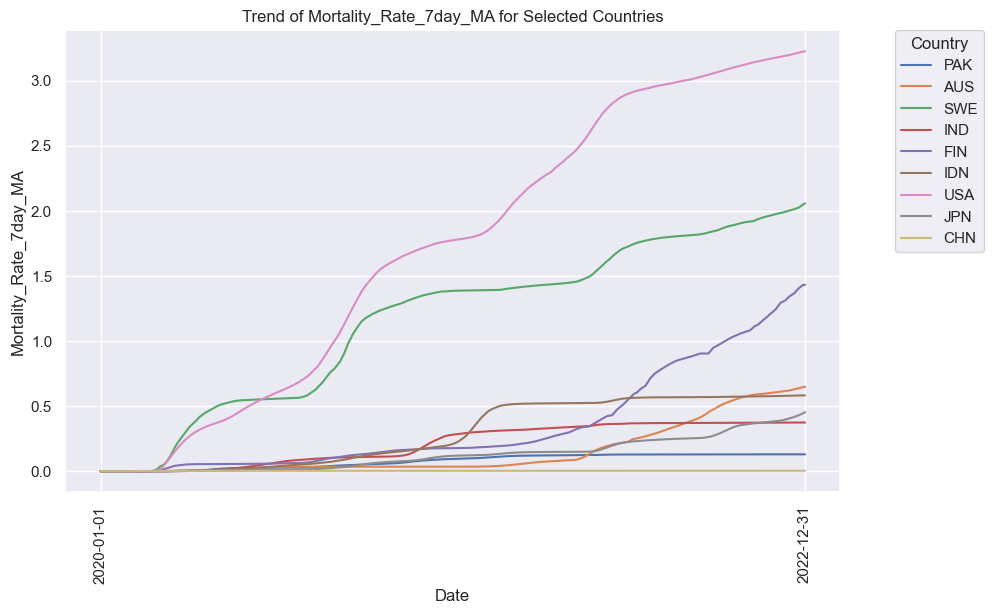

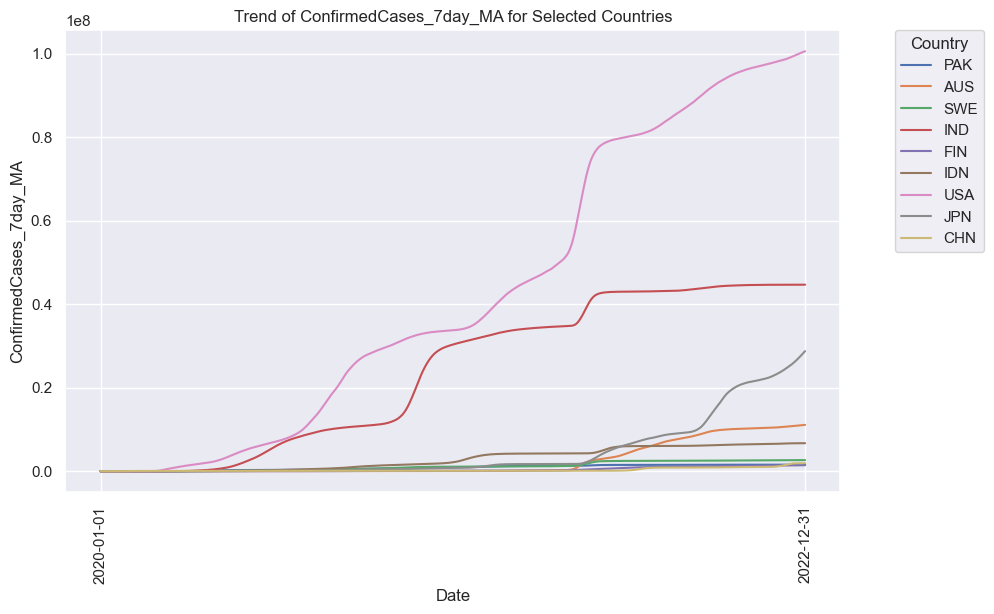

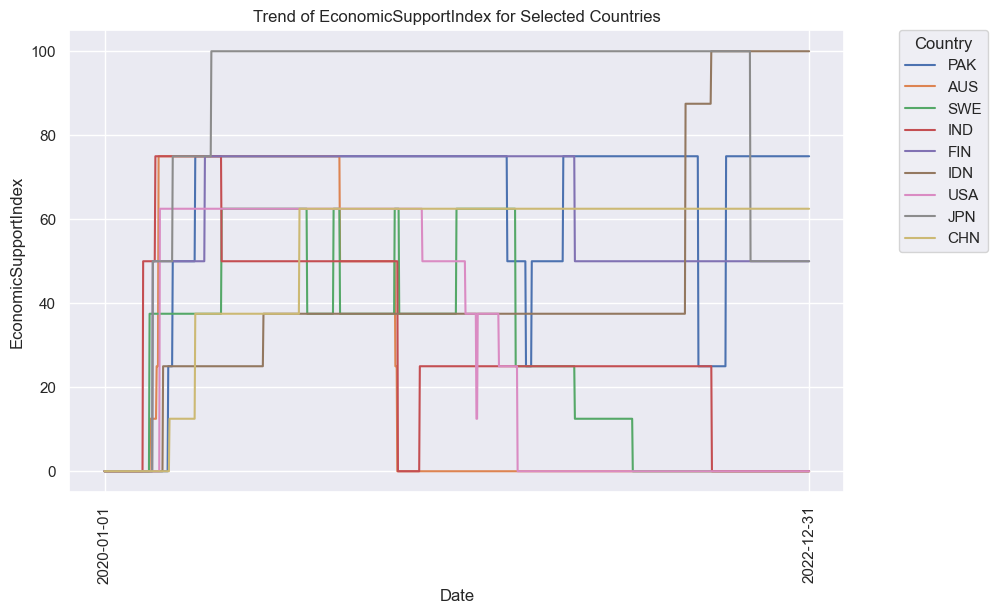

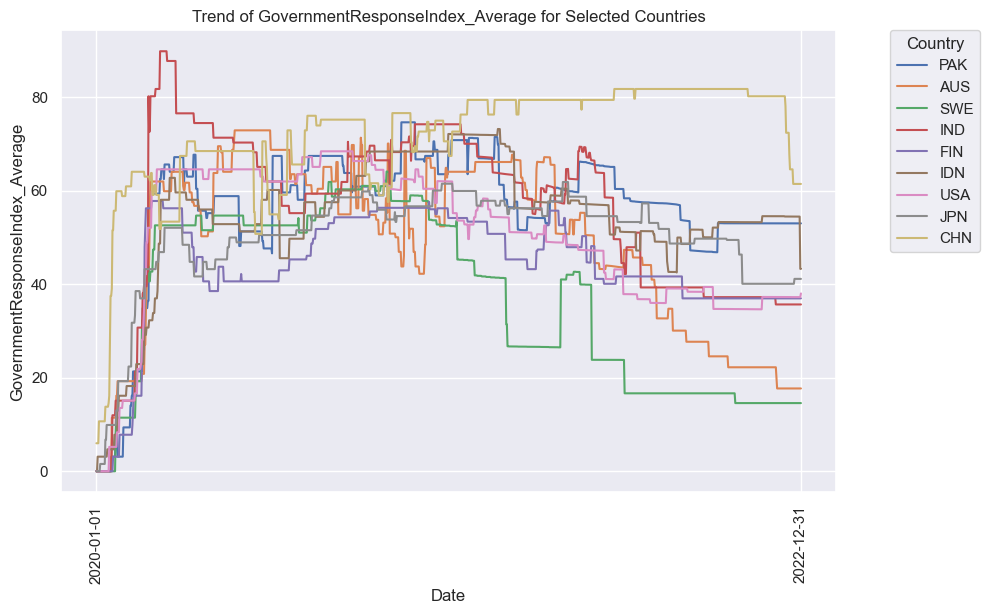

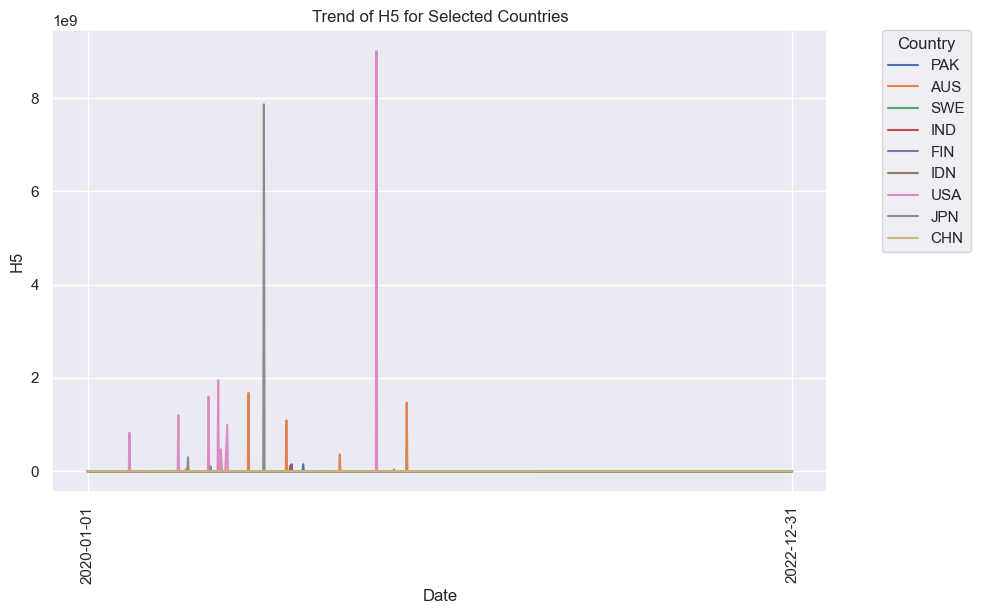

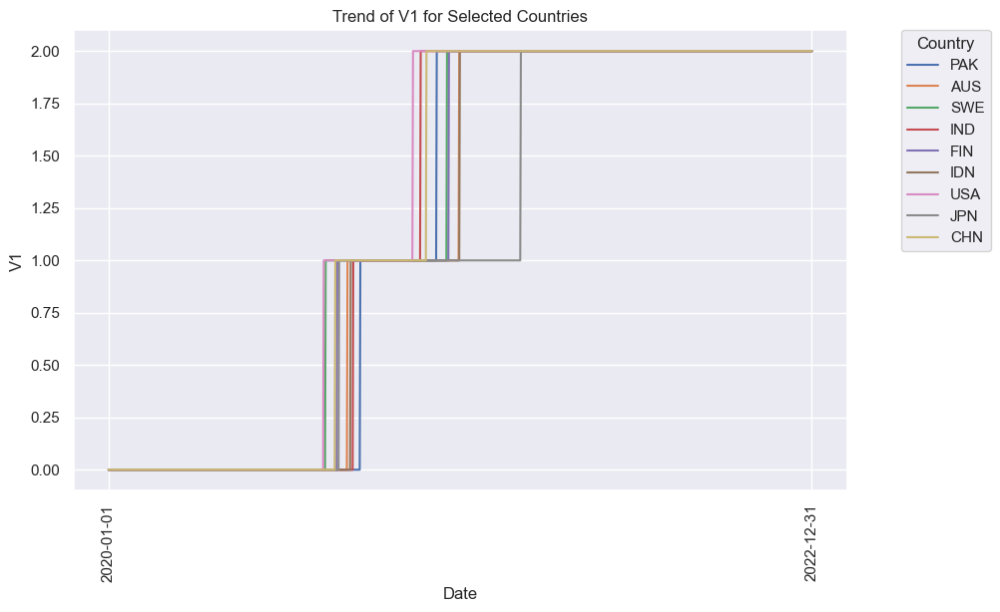

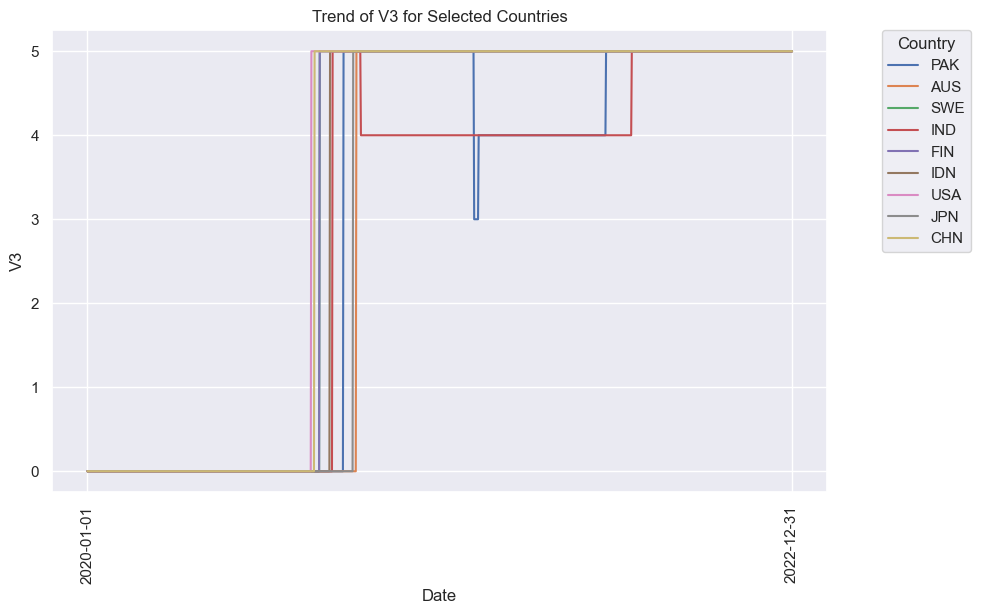

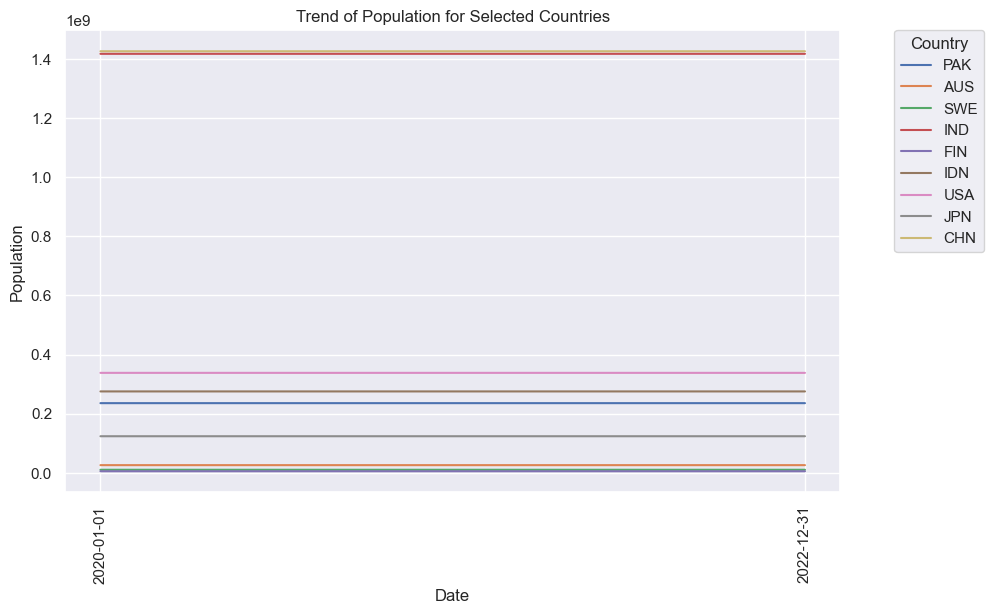

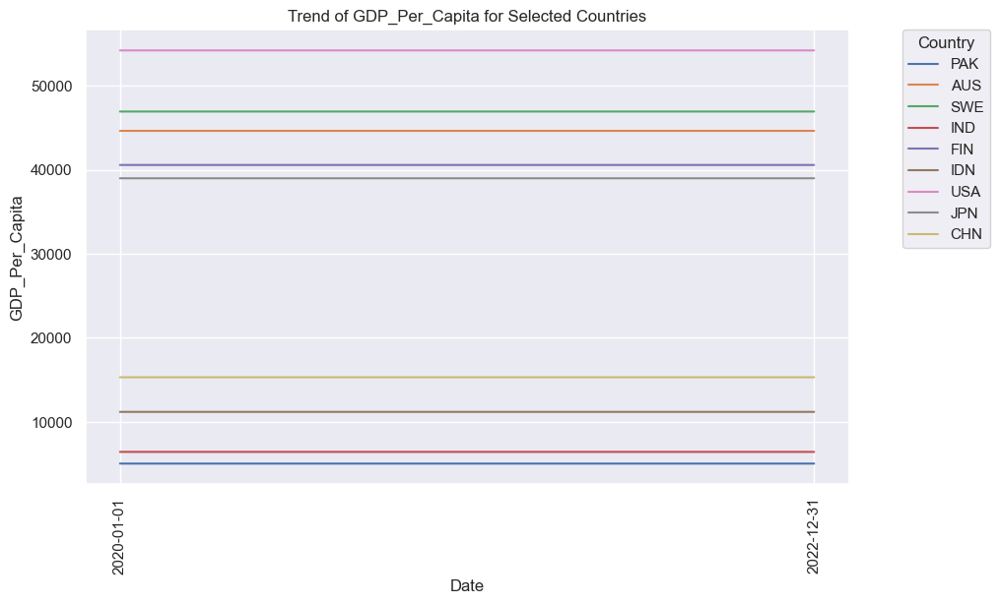

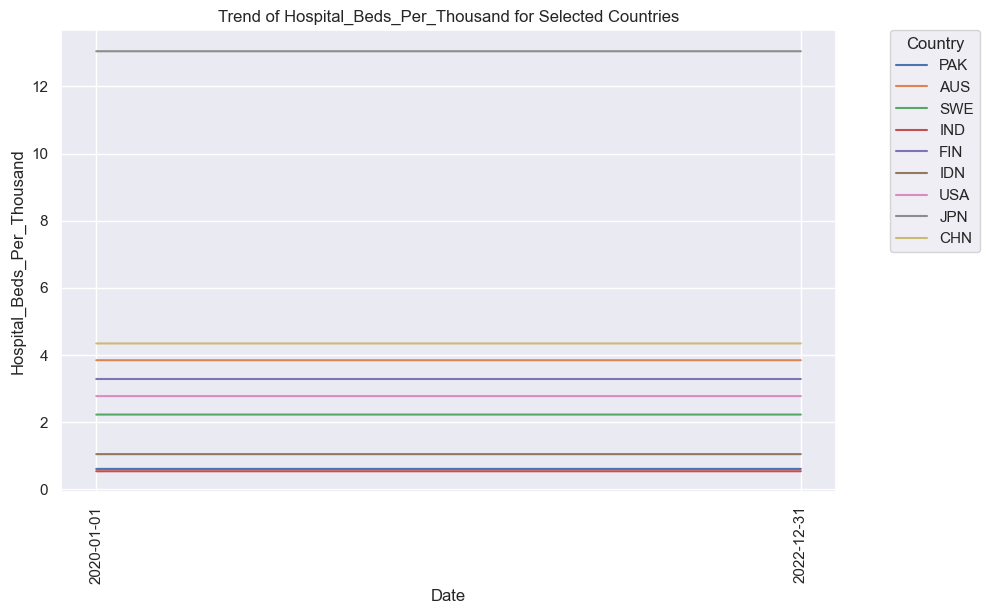

In [ ]:
selectedColumns = ['Mortality_Rate_7day_MA', 'ConfirmedCases_7day_MA', 'EconomicSupportIndex','GovernmentResponseIndex_Average', 'H5',
       'V1', 'V3', 'Population', 'GDP_Per_Capita', 'Hospital_Beds_Per_Thousand']

start_date = justViewing['Date'].min()
end_date = justViewing['Date'].max()

for column in selectedColumns:
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=justViewing, x='Date', y=column, hue='CountryCode')
    plt.title(f'Trend of {column} for Selected Countries')
    plt.xlabel('Date')
    plt.xticks([start_date, end_date],rotation=90)
    plt.legend(title='Country',loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.show()

####  Creating New Features

In [ ]:
justViewing = justViewing.sort_values(by=['CountryCode', 'Date'])
justViewing['changeInCC'] = justViewing.groupby(['CountryCode'])['ConfirmedCases'].transform(lambda x: x.diff())
justViewing['changeInMR'] = justViewing.groupby(['CountryCode'])['Mortality Rate'].transform(lambda x: x.diff())
justViewing = justViewing.replace(np.nan, 0)

justViewing['ChangeCC_7dayMA'] = justViewing.groupby(['CountryCode'])['changeInCC'].rolling(window=7, min_periods=1).mean().reset_index(0, drop=True)
justViewing['ChangeMR_7dayMA'] = justViewing.groupby(['CountryCode'])['changeInMR'].rolling(window=7, min_periods=1).mean().reset_index(0, drop=True)

justViewing.head(1)


,CountryCode,Date,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,Mortality Rate,H5,V1,V3,Mortality_Rate_7day_MA,ConfirmedCases_7day_MA,changeInCC,changeInMR,ChangeCC_7dayMA,ChangeMR_7dayMA
44,AUS,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
justViewing['ChangeMR_14dayMA'] = justViewing.groupby(['CountryCode'])['changeInMR'].rolling(window=14, min_periods=1).mean().reset_index(0, drop=True)

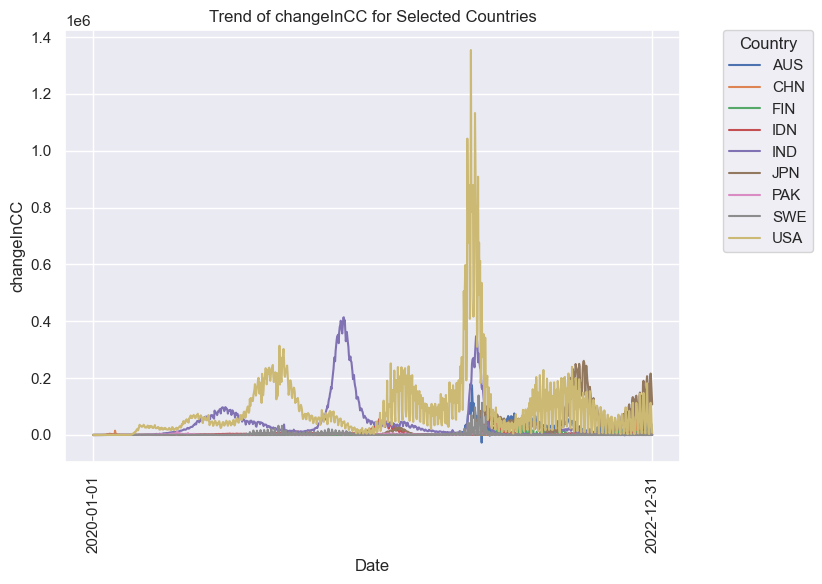

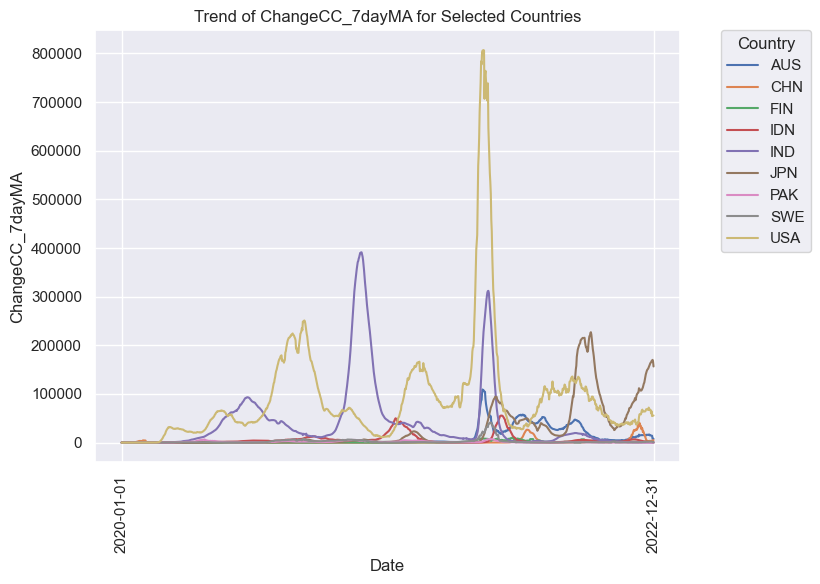

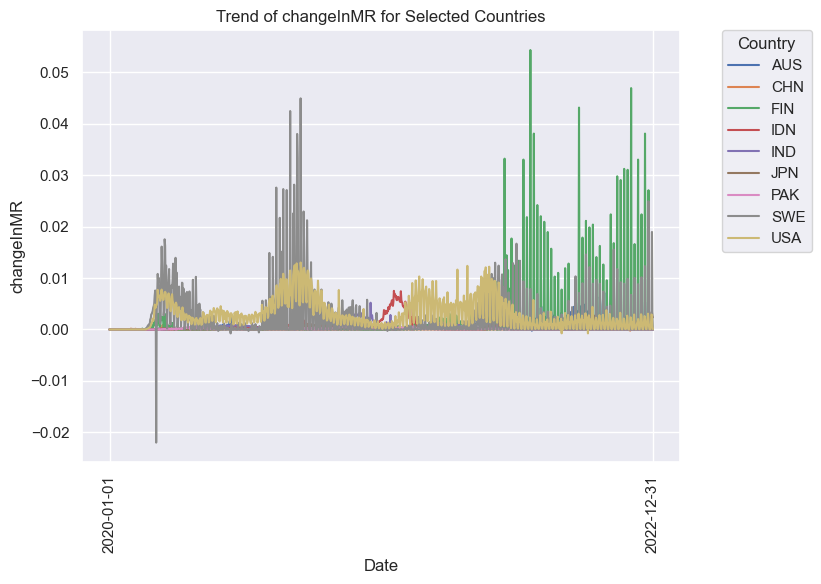

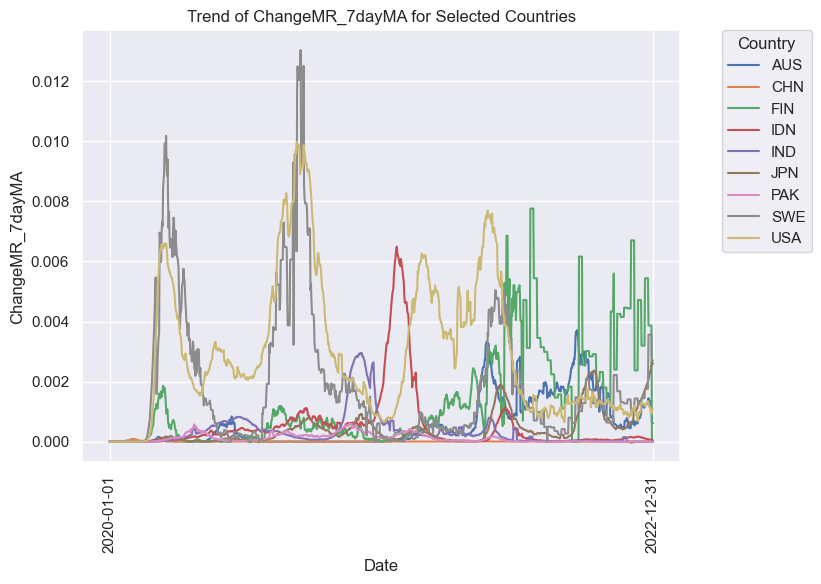

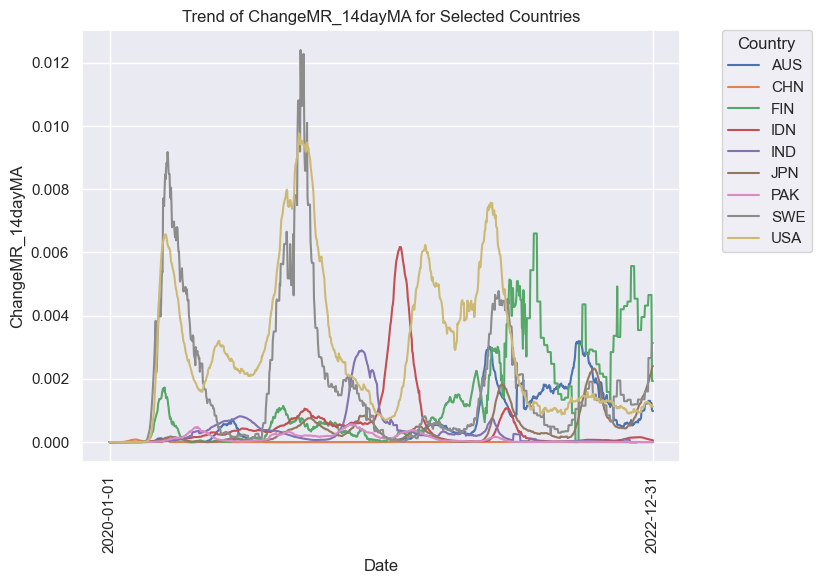

In [ ]:
selectedColumns = ['changeInCC', 'ChangeCC_7dayMA','changeInMR','ChangeMR_7dayMA', 'ChangeMR_14dayMA']
start_date = justViewing['Date'].min()
end_date = justViewing['Date'].max()


for column in selectedColumns:
    plt.figure(figsize=(10, 6))  # Set the figure size
    sns.lineplot(data=justViewing, x='Date', y=column, hue='CountryCode')
    plt.title(f'Trend of {column} for Selected Countries')
    plt.xlabel('Date')
    plt.xticks([start_date, end_date],rotation=90)
    plt.legend(title='Country',loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

In [ ]:
justViewing[justViewing['CountryCode'] == 'CHN']['ConfirmedCases']

126             0.0
261             0.0
300             0.0
450             0.0
732             0.0
            ...    
163664    1933112.0
163867    1938214.0
164071    1943729.0
164163    1950933.0
164313    1956071.0
Name: ConfirmedCases, Length: 1096, dtype: float64

In [ ]:
justViewing.head()

,CountryCode,Date,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,Mortality Rate,H5,V1,V3,Mortality_Rate_7day_MA,ConfirmedCases_7day_MA,changeInCC,changeInMR,ChangeCC_7dayMA,ChangeMR_7dayMA,ChangeMR_14dayMA
44,AUS,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
254,AUS,2020-01-02,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
378,AUS,2020-01-03,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
550,AUS,2020-01-04,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
677,AUS,2020-01-05,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
justViewing[justViewing['CountryCode'] == 'GER']['Date']

Series([], Name: Date, dtype: object)

#### Daily Change in ConfirmedCases

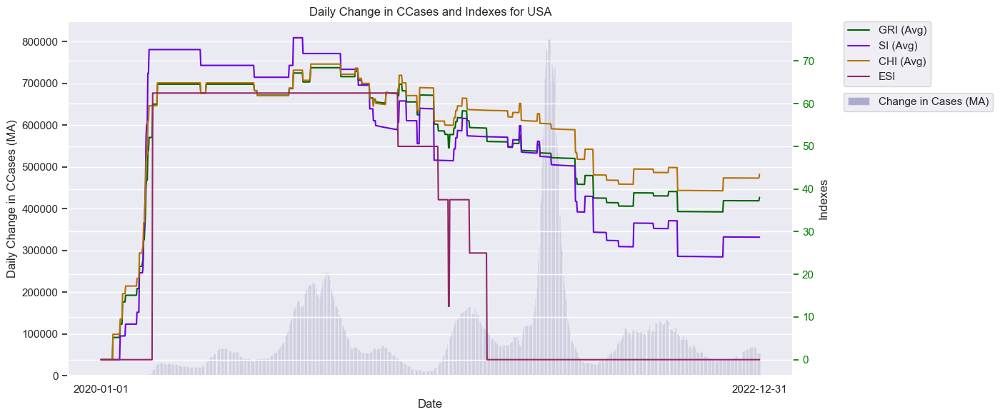

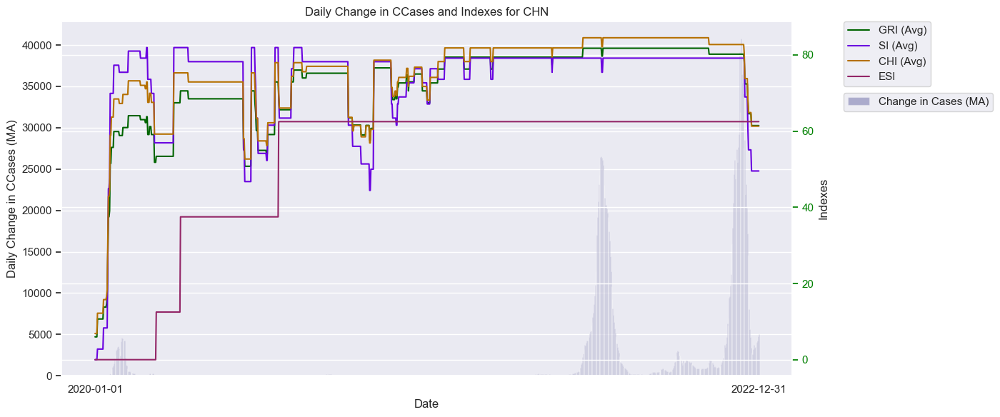

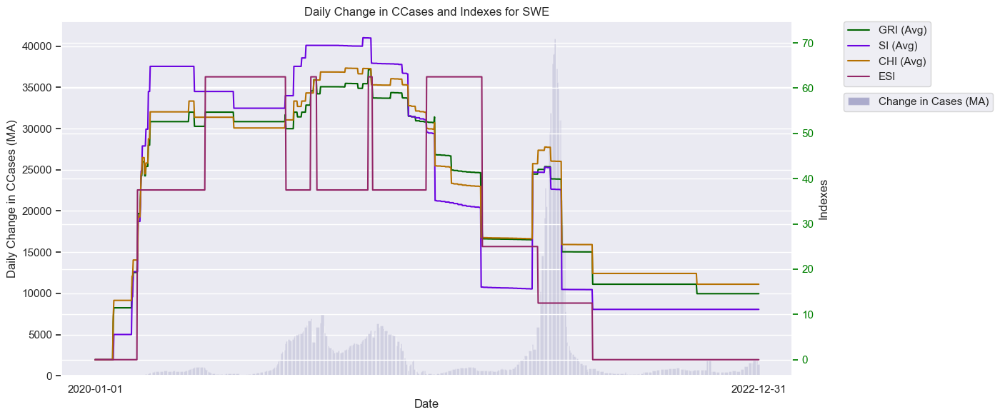

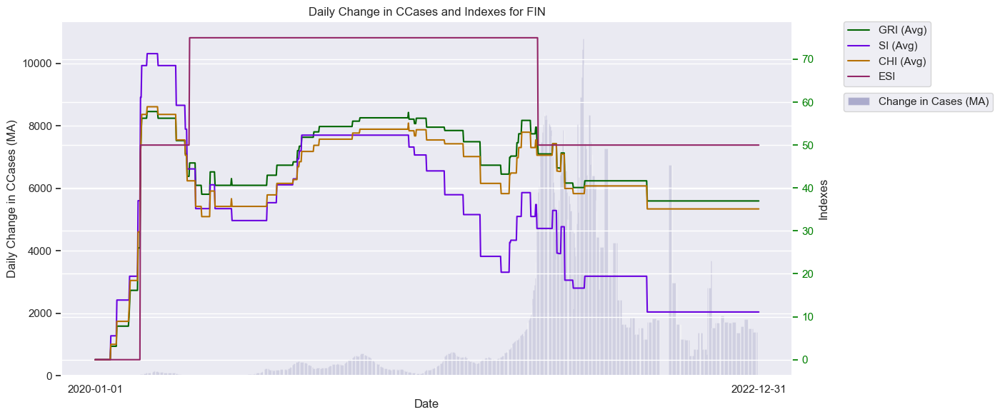

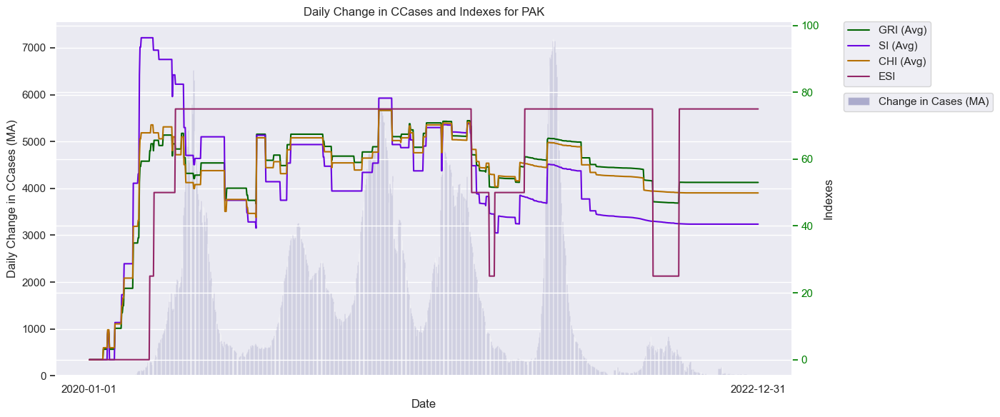

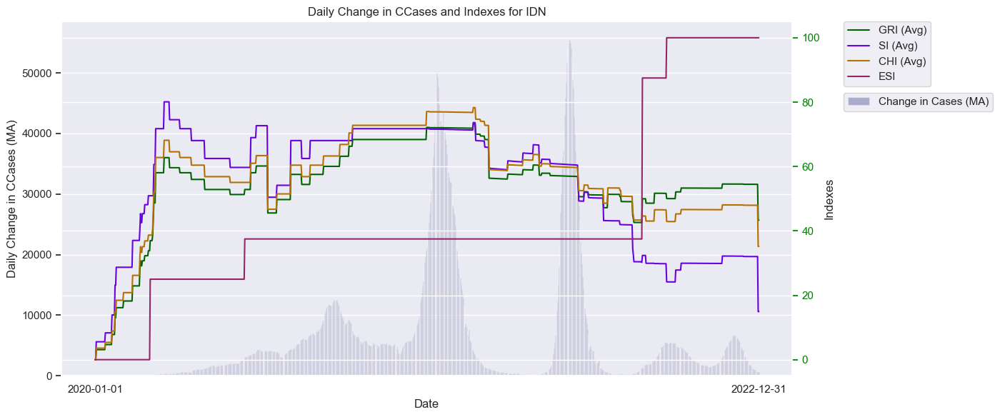

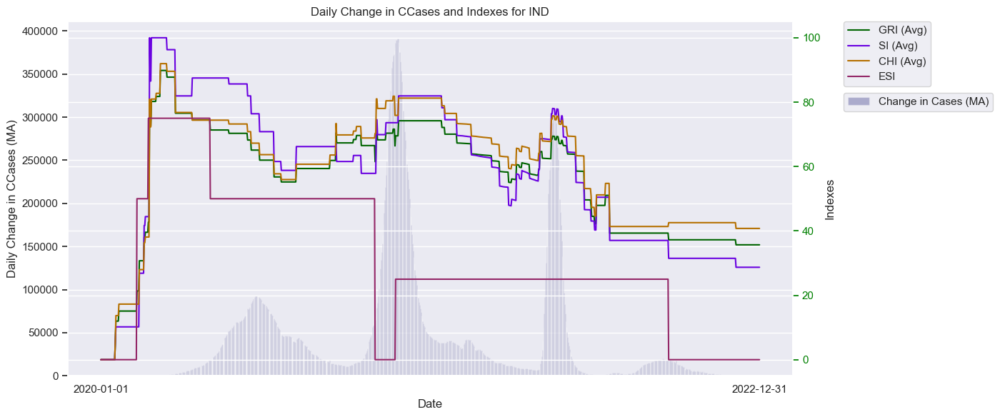

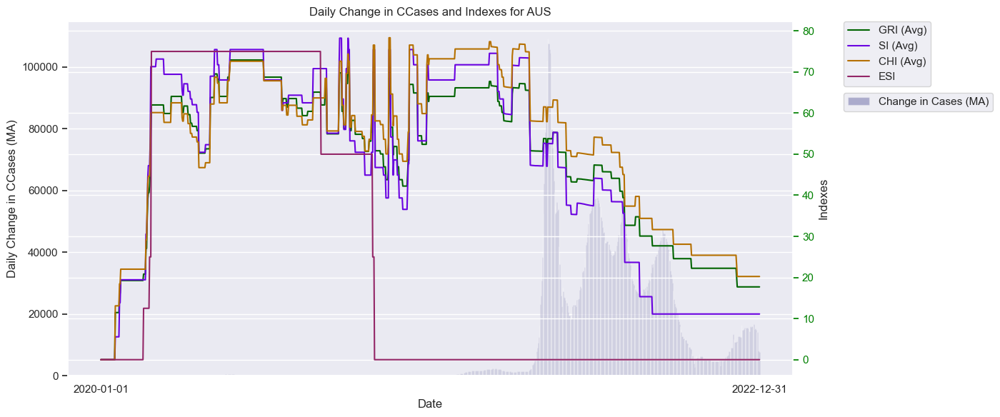

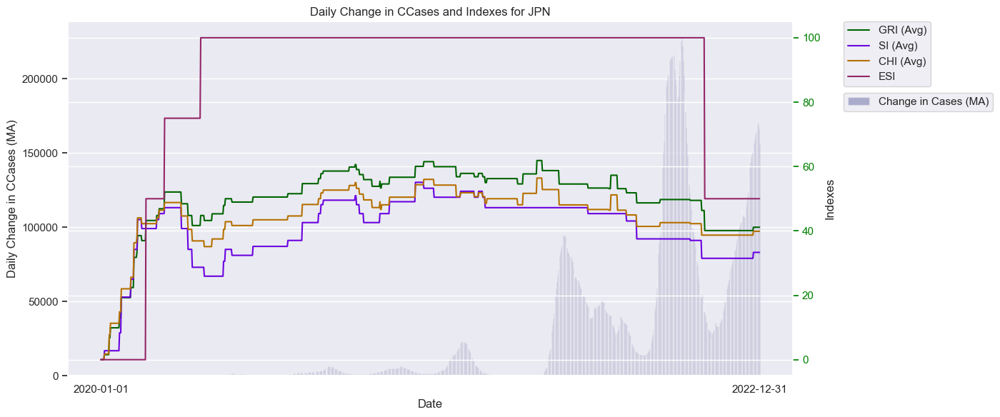

In [ ]:
start_date = justViewing['Date'].min()
end_date = justViewing['Date'].max()

for idx, country in enumerate(countries):

    plt.figure(figsize=(14, 6))

    data = justViewing[justViewing['CountryCode'] == country].sort_values(by='Date')

    ax1 = sns.barplot(x='Date', y='ChangeCC_7dayMA', data=data, color='#040080',zorder=1,alpha=0.3,label='Change in Cases (MA)')
    ax1.set_ylabel('Daily Change in CCases (MA)')
    ax1.set_title(f'Daily Change in CCases and Indexes for {country}')
    ax1.tick_params(axis='y', colors='#292929')

    ax2 = ax1.twinx()
    sns.lineplot(x='Date', y='GovernmentResponseIndex_Average', data=data, ax=ax2, color='darkgreen', label='GRI (Avg)')
    sns.lineplot(x='Date', y='StringencyIndex_Average', data=data, ax=ax2, color='#6a02e0', label='SI (Avg)')
    sns.lineplot(x='Date', y='ContainmentHealthIndex_Average', data=data, ax=ax2, color='#b57000', label='CHI (Avg)')
    sns.lineplot(x='Date', y='EconomicSupportIndex', data=data, ax=ax2, color='#932667', label='ESI')
    ax2.set_ylabel('Indexes')
    ax2.tick_params(axis='y', colors='green')

    ax1.legend(loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.xticks([start_date, end_date])
    plt.tight_layout()
    plt.show()

#### Daily Change in Mortality Rate

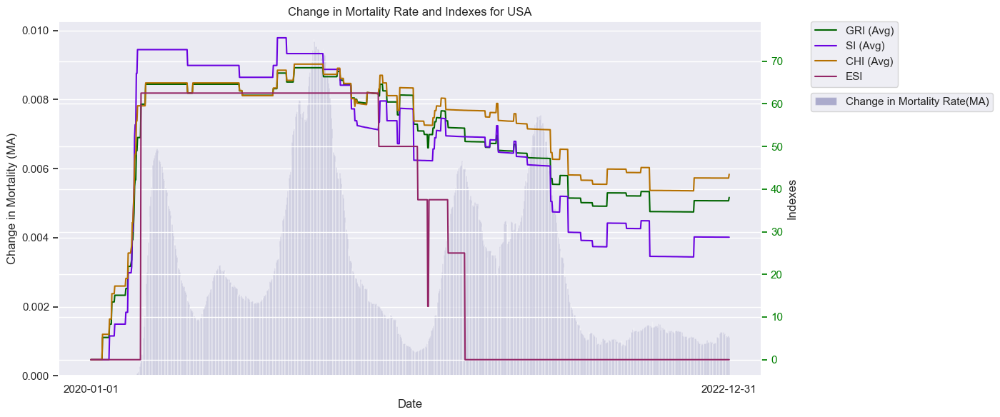

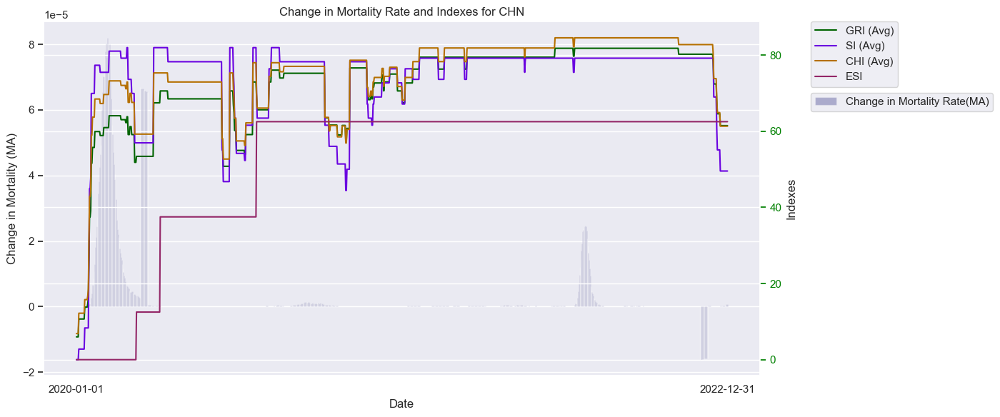

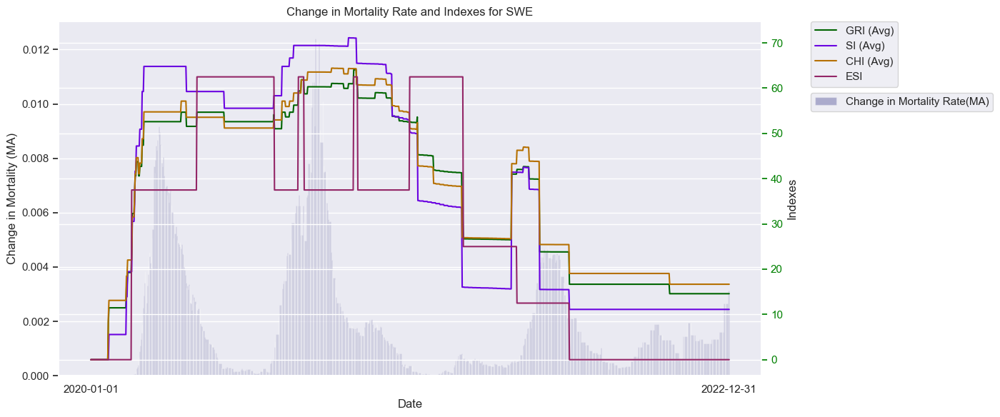

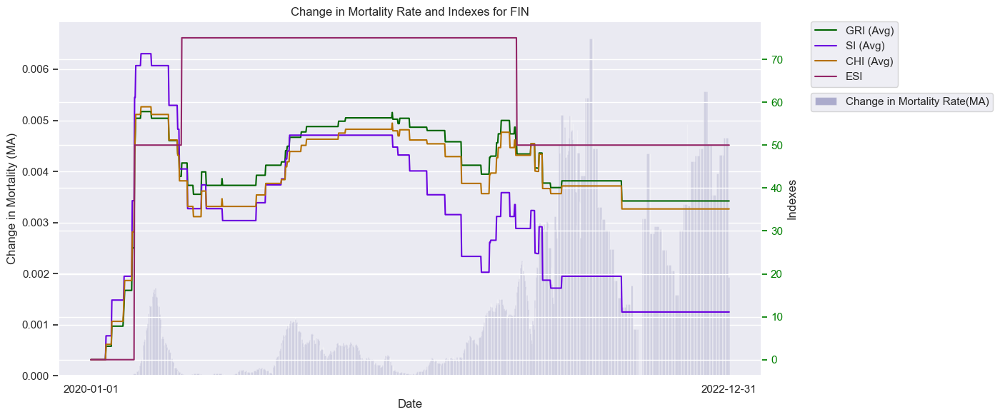

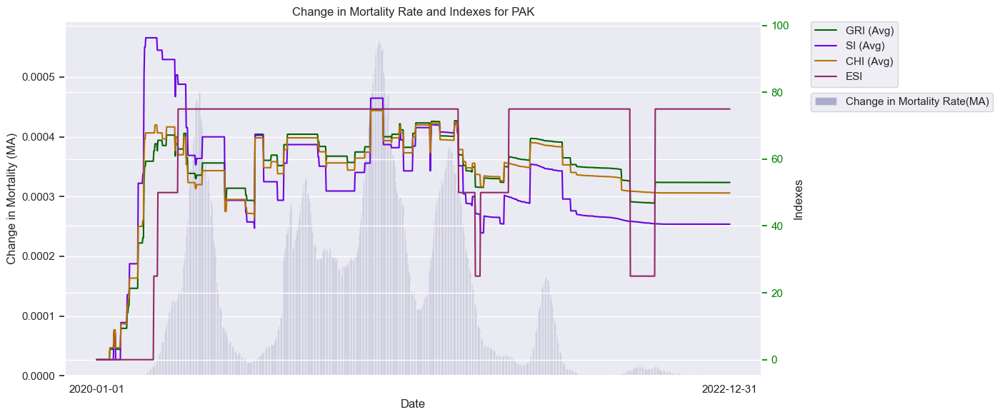

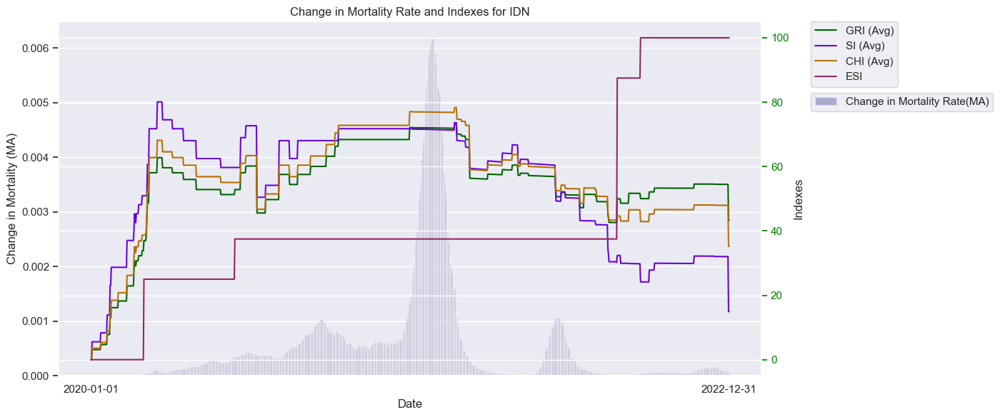

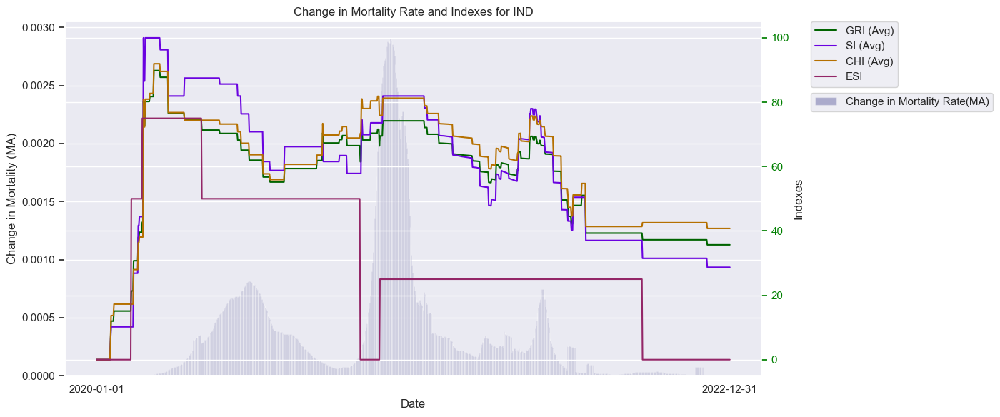

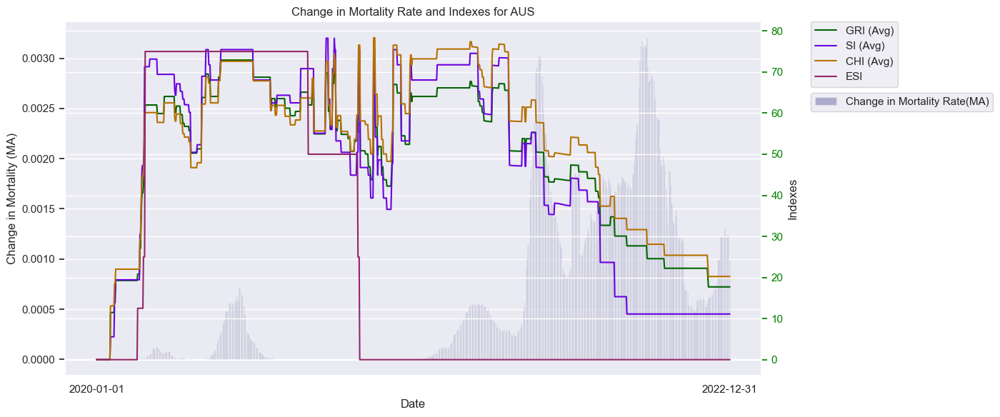

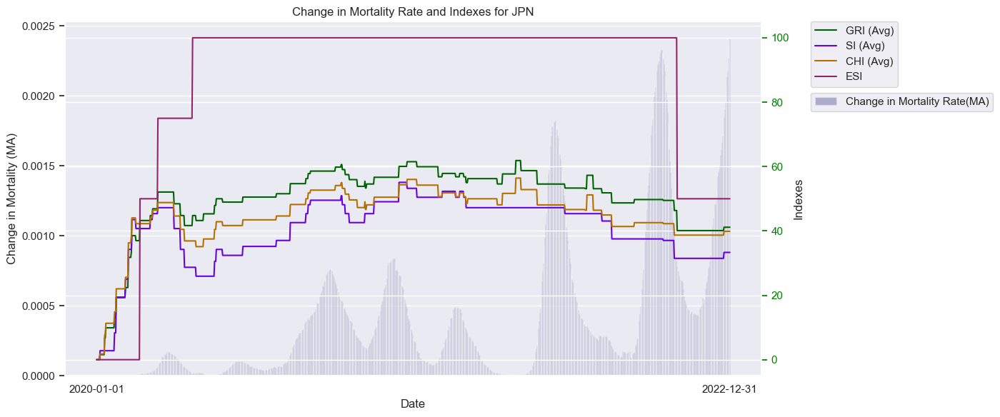

In [ ]:
start_date = justViewing['Date'].min()
end_date = justViewing['Date'].max()

for idx, country in enumerate(countries):

    plt.figure(figsize=(14, 6))

    data = justViewing[justViewing['CountryCode'] == country].sort_values(by='Date')

    ax1 = sns.barplot(x='Date', y='ChangeMR_14dayMA', data=data, color='#040080',zorder=1,alpha=0.3,label='Change in Mortality Rate(MA)')
    ax1.set_ylabel('Change in Mortality (MA)')
    ax1.set_title(f'Change in Mortality Rate and Indexes for {country}')
    ax1.tick_params(axis='y', colors='#292929')

    ax2 = ax1.twinx()
    sns.lineplot(x='Date', y='GovernmentResponseIndex_Average', data=data, ax=ax2, color='darkgreen', label='GRI (Avg)')
    sns.lineplot(x='Date', y='StringencyIndex_Average', data=data, ax=ax2, color='#6a02e0', label='SI (Avg)')
    sns.lineplot(x='Date', y='ContainmentHealthIndex_Average', data=data, ax=ax2, color='#b57000', label='CHI (Avg)')
    sns.lineplot(x='Date', y='EconomicSupportIndex', data=data, ax=ax2, color='#932667', label='ESI')
    ax2.set_ylabel('Indexes')
    ax2.tick_params(axis='y', colors='green')

    ax1.legend(loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.xticks([start_date, end_date])
    plt.tight_layout()
    plt.show()

#### Lagged Features

In [ ]:
justViewing = justViewing.sort_values(by=['CountryCode', 'Date'])

def create_lagged_features(justViewing, columns, days):
    df_lagged = justViewing.copy()
    for day in days:
        for col in columns:
            df_lagged[col + f'_Lag{day}'] = justViewing.groupby('CountryCode')[col].shift(day)
    return df_lagged


columns = ['StringencyIndex_Average', 'GovernmentResponseIndex_Average',
                 'ContainmentHealthIndex_Average', 'EconomicSupportIndex', 'H5', 'V1', 'V3', 'MajorityVaccinated']


days = [7,14,21]

justViewingLagged = create_lagged_features(justViewing, columns, days)

In [ ]:
justViewingLagged.head()

,CountryCode,Date,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,Mortality Rate,H5,V1,V3,Mortality_Rate_7day_MA,ConfirmedCases_7day_MA,changeInCC,changeInMR,ChangeCC_7dayMA,ChangeMR_7dayMA,ChangeMR_14dayMA,StringencyIndex_Average_Lag7,GovernmentResponseIndex_Average_Lag7,ContainmentHealthIndex_Average_Lag7,EconomicSupportIndex_Lag7,H5_Lag7,V1_Lag7,V3_Lag7,MajorityVaccinated_Lag7,StringencyIndex_Average_Lag14,GovernmentResponseIndex_Average_Lag14,ContainmentHealthIndex_Average_Lag14,EconomicSupportIndex_Lag14,H5_Lag14,V1_Lag14,V3_Lag14,MajorityVaccinated_Lag14,StringencyIndex_Average_Lag21,GovernmentResponseIndex_Average_Lag21,ContainmentHealthIndex_Average_Lag21,EconomicSupportIndex_Lag21,H5_Lag21,V1_Lag21,V3_Lag21,MajorityVaccinated_Lag21
44,AUS,2020-01-01,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
254,AUS,2020-01-02,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
378,AUS,2020-01-03,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
550,AUS,2020-01-04,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
677,AUS,2020-01-05,0.0,0.0,NV,0.0,0.0,0.0,0.0,26177410.0,44648.71,83.44,3.84,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
justViewingLagged[justViewingLagged['CountryCode'] == 'USA']['V3_Lag7']

98        NaN
270       NaN
319       NaN
468       NaN
742       NaN
         ... 
163728    5.0
163858    5.0
164096    5.0
164116    5.0
164349    5.0
Name: V3_Lag7, Length: 1096, dtype: float64

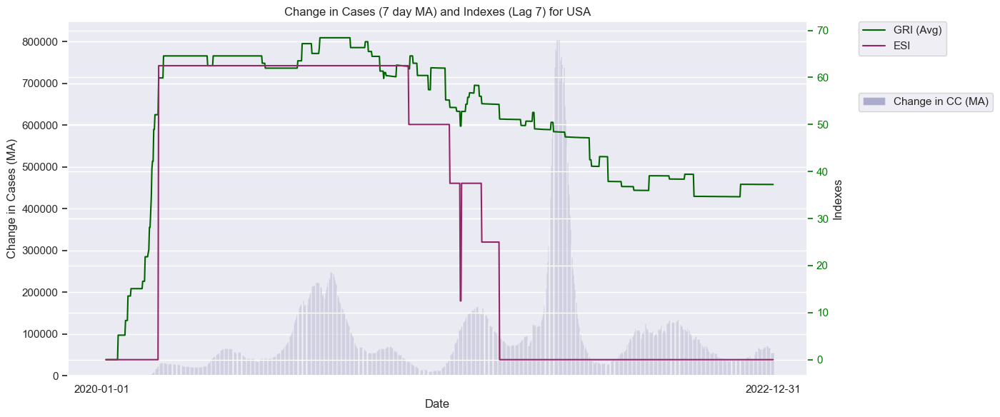

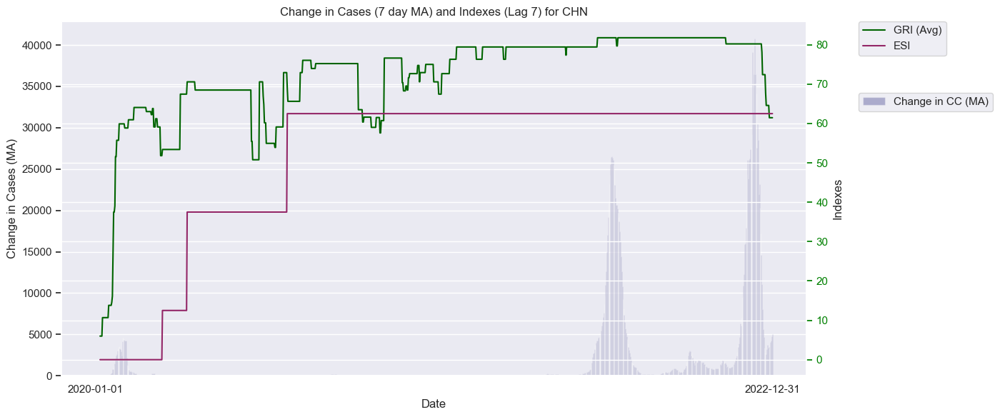

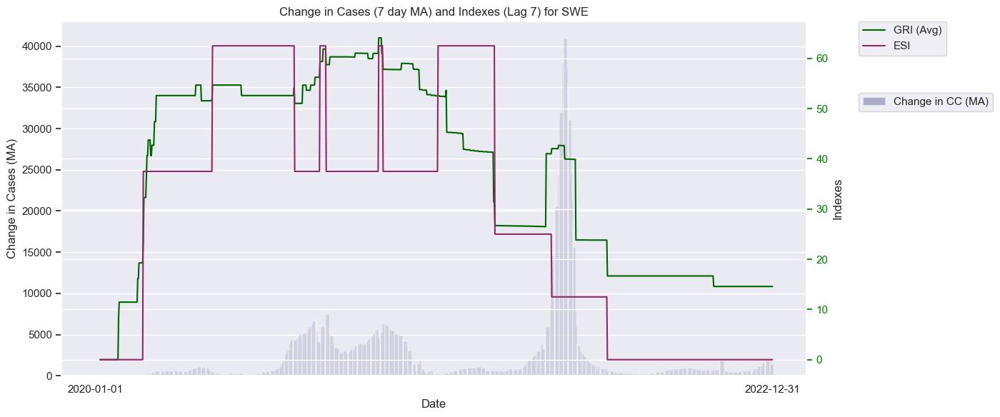

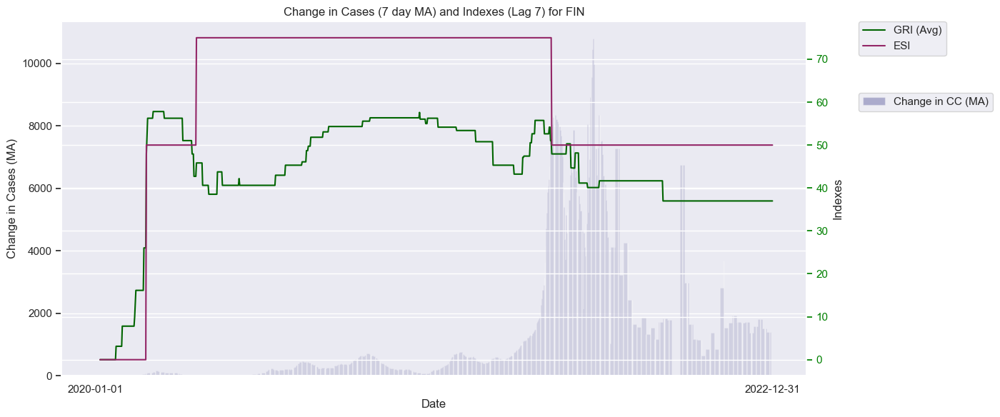

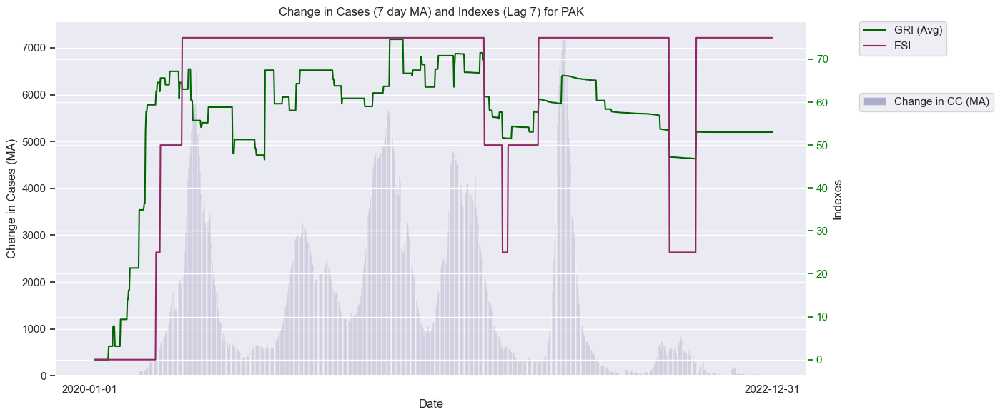

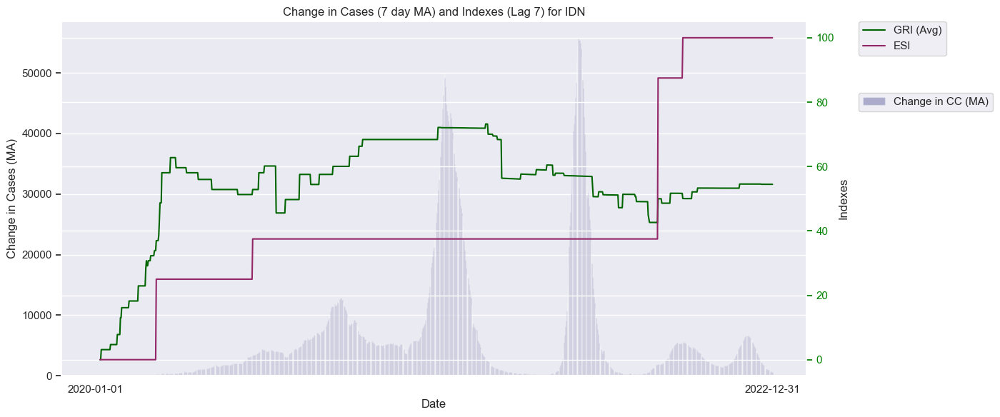

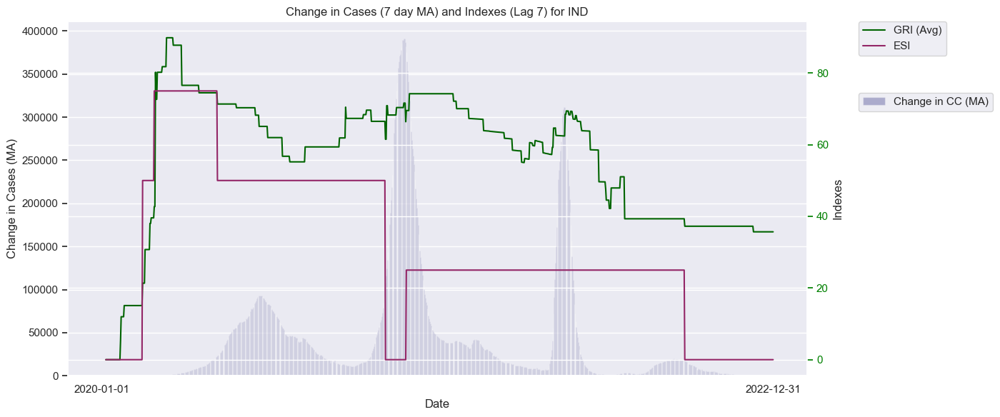

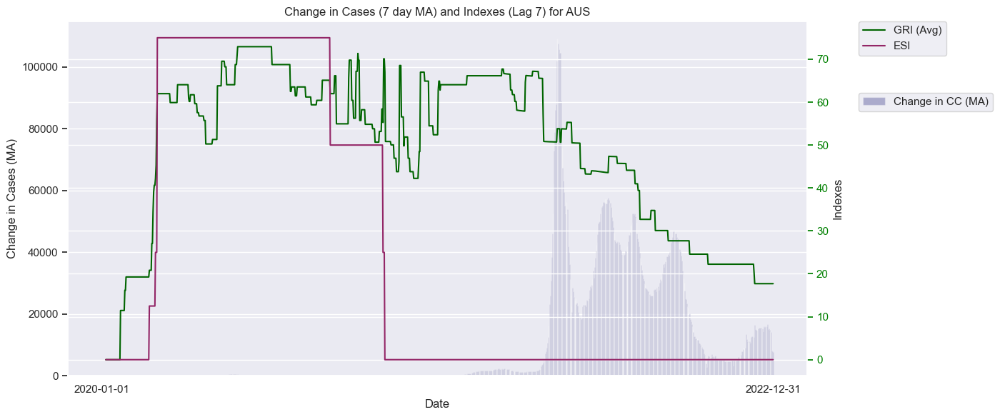

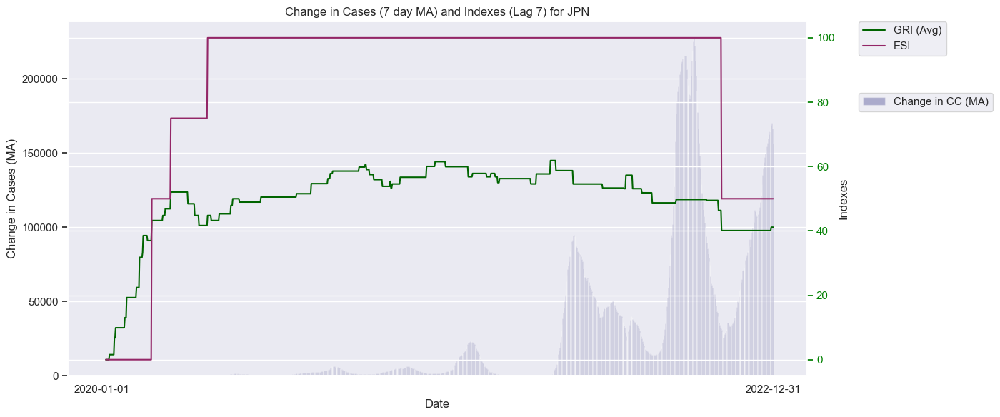

In [ ]:
start_date = justViewingLagged['Date'].min()
end_date = justViewingLagged['Date'].max()

for idx, country in enumerate(countries):

    plt.figure(figsize=(14, 6))

    data = justViewingLagged[justViewing['CountryCode'] == country].sort_values(by='Date')

    ax1 = sns.barplot(x='Date', y='ChangeCC_7dayMA', data=data, color='#040080',zorder=1,alpha=0.3,label='Change in CC (MA)')
    ax1.set_ylabel('Change in Cases (MA)')
    ax1.set_title(f'Change in Cases (7 day MA) and Indexes (Lag 7) for {country}')
    ax1.tick_params(axis='y', colors='#292929')

    ax2 = ax1.twinx()
    sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag7', data=data, ax=ax2, color='darkgreen', label='GRI (Avg)')
    sns.lineplot(x='Date', y='EconomicSupportIndex_Lag7', data=data, ax=ax2, color='#932667', label='ESI')
    ax2.set_ylabel('Indexes')
    ax2.tick_params(axis='y', colors='green')

    ax1.legend(loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.xticks([start_date, end_date])
    plt.tight_layout()
    plt.show()

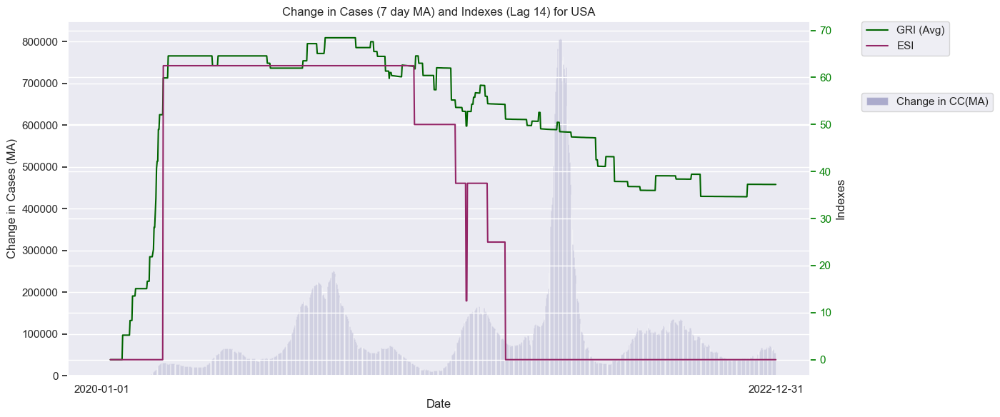

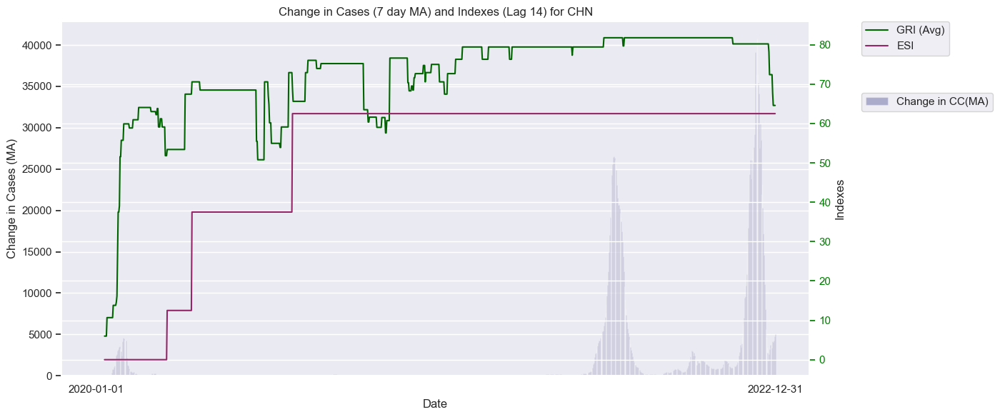

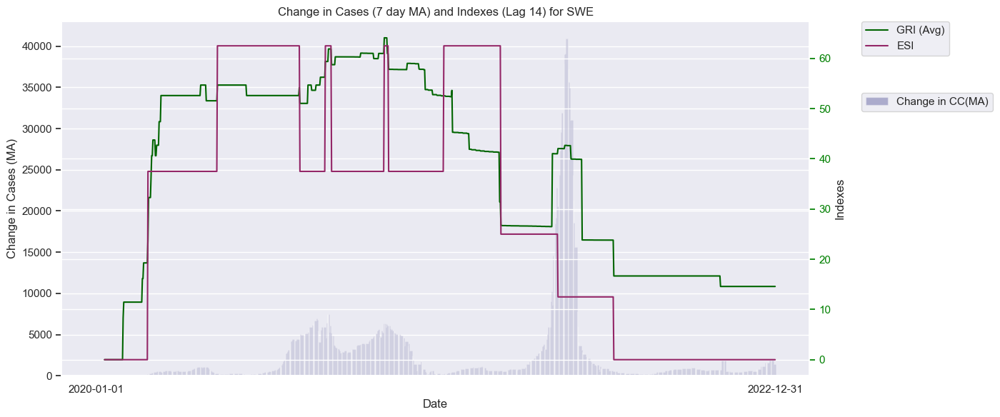

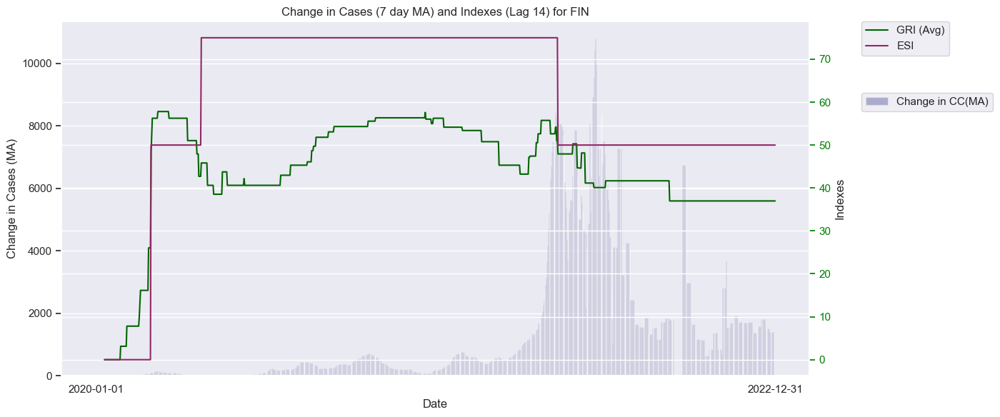

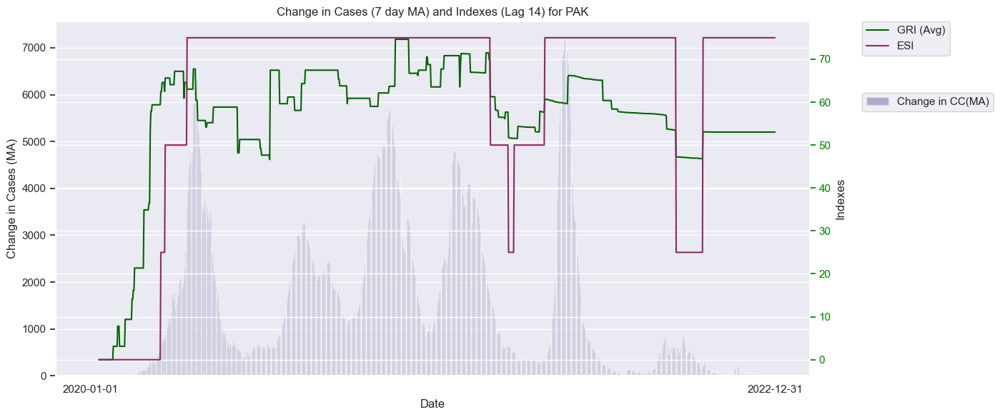

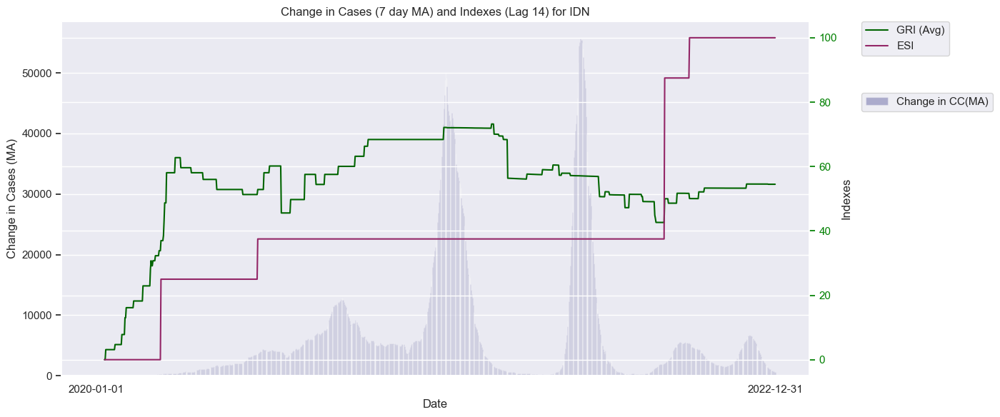

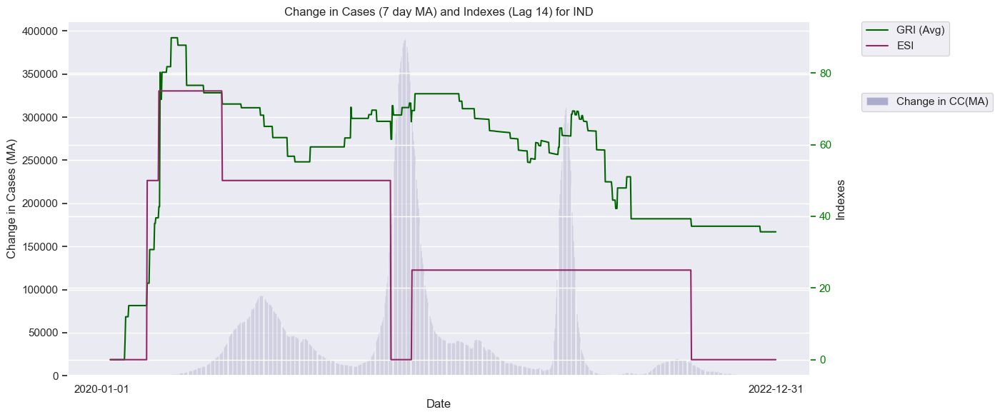

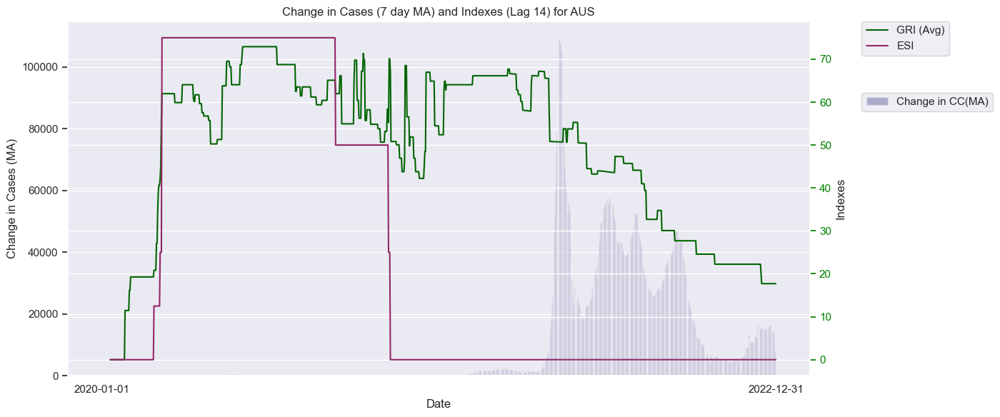

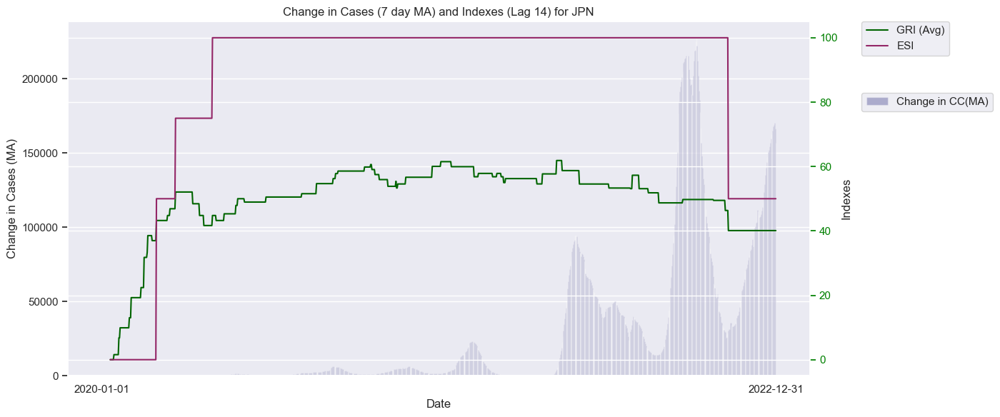

In [ ]:
start_date = justViewingLagged['Date'].min()
end_date = justViewingLagged['Date'].max()

for idx, country in enumerate(countries):

    plt.figure(figsize=(14, 6))

    data = justViewingLagged[justViewing['CountryCode'] == country].sort_values(by='Date')

    ax1 = sns.barplot(x='Date', y='ChangeCC_7dayMA', data=data, color='#040080',zorder=1,alpha=0.3,label='Change in CC(MA)')
    ax1.set_ylabel('Change in Cases (MA)')
    ax1.set_title(f'Change in Cases (7 day MA) and Indexes (Lag 14) for {country}')
    ax1.tick_params(axis='y', colors='#292929')

    ax2 = ax1.twinx()
    sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag14', data=data, ax=ax2, color='darkgreen', label='GRI (Avg)')
    sns.lineplot(x='Date', y='EconomicSupportIndex_Lag14', data=data, ax=ax2, color='#932667', label='ESI')
    ax2.set_ylabel('Indexes')
    ax2.tick_params(axis='y', colors='green')

    ax1.legend(loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.xticks([start_date, end_date])
    plt.tight_layout()
    plt.show()

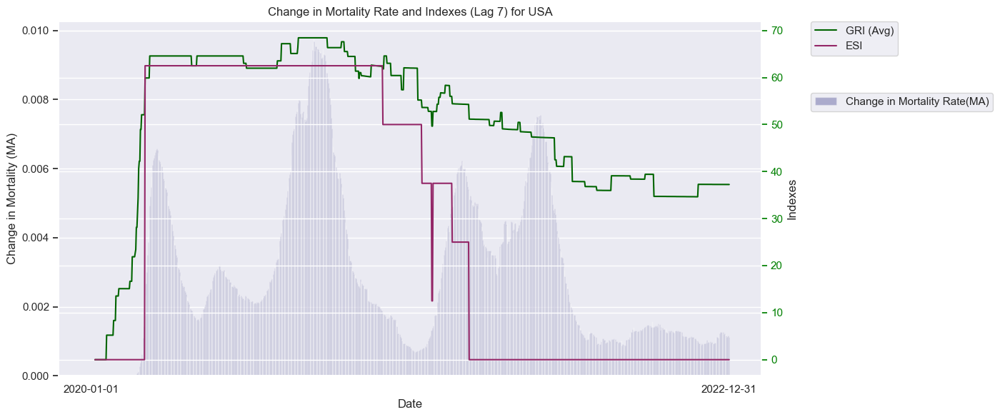

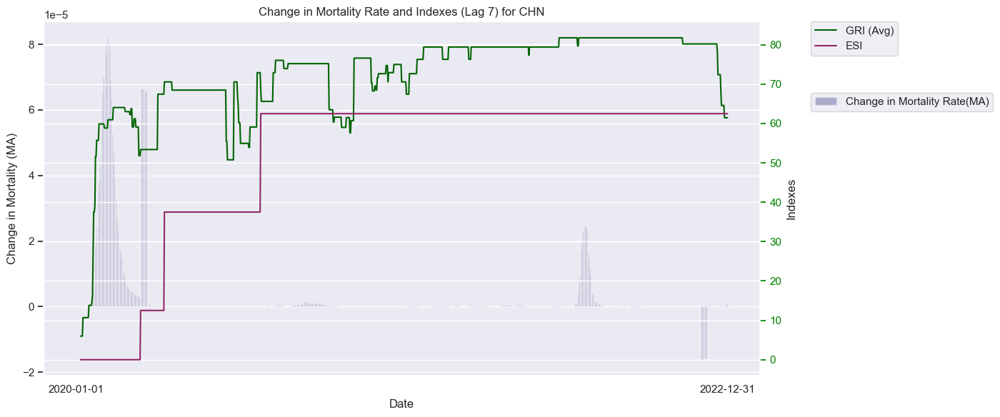

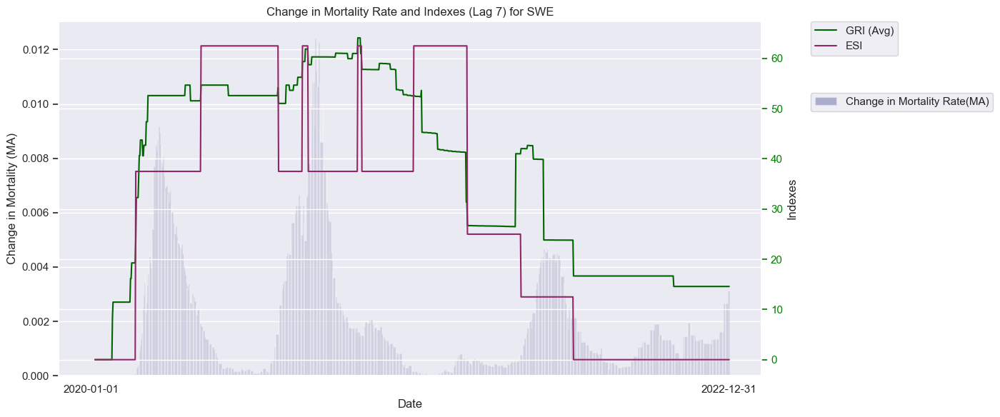

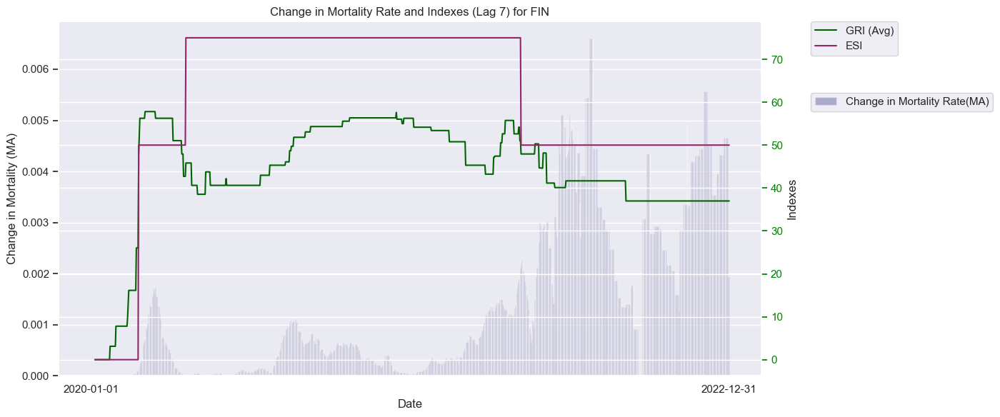

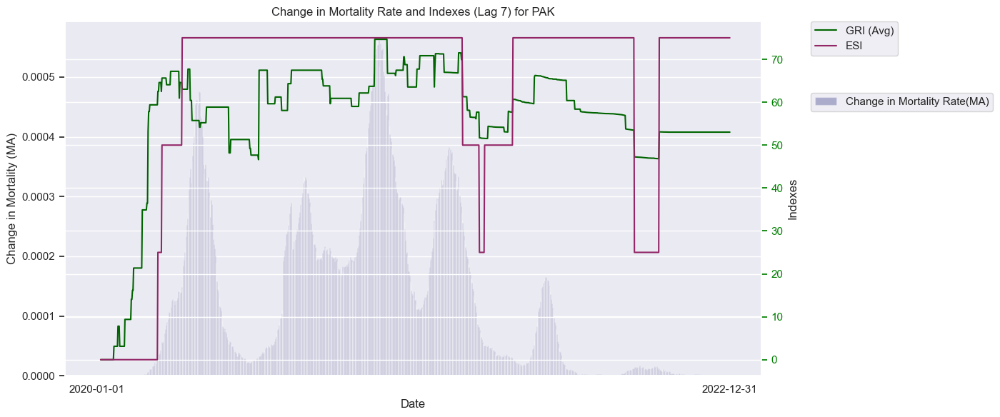

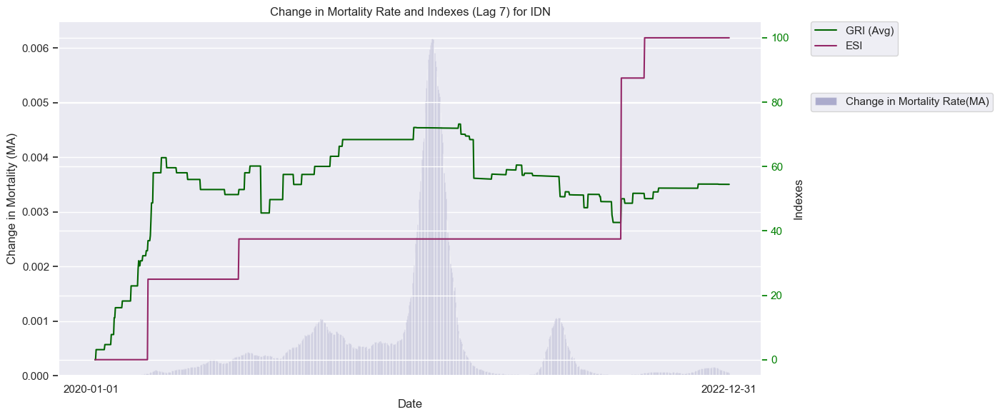

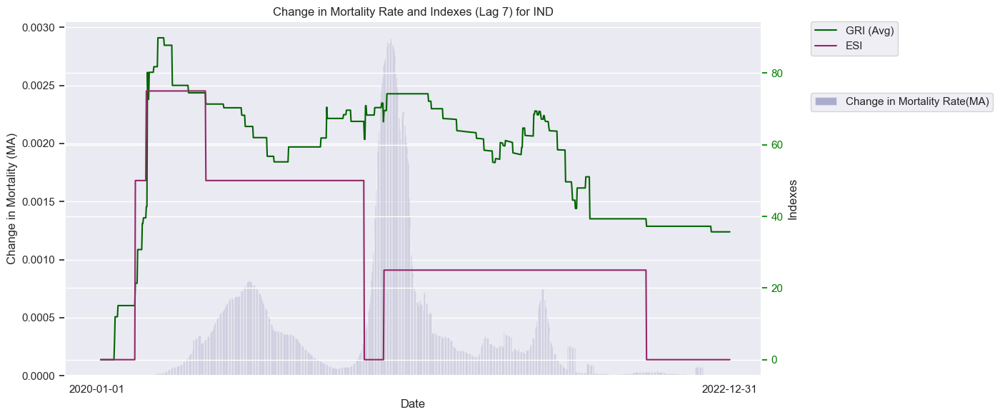

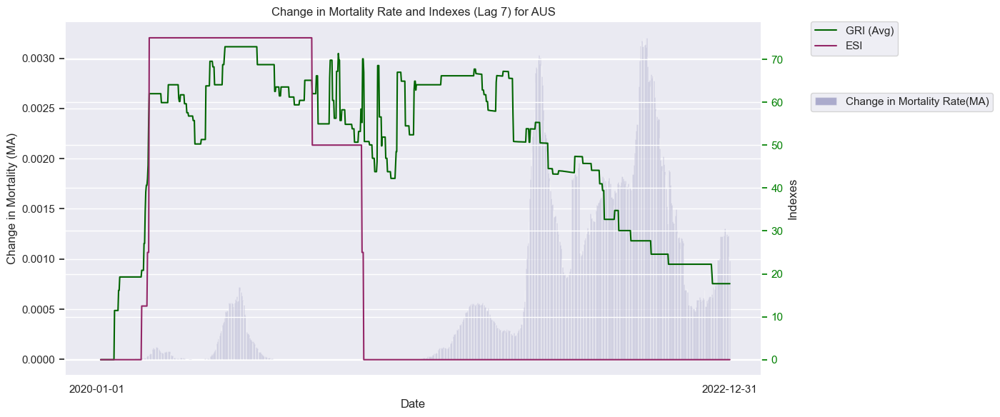

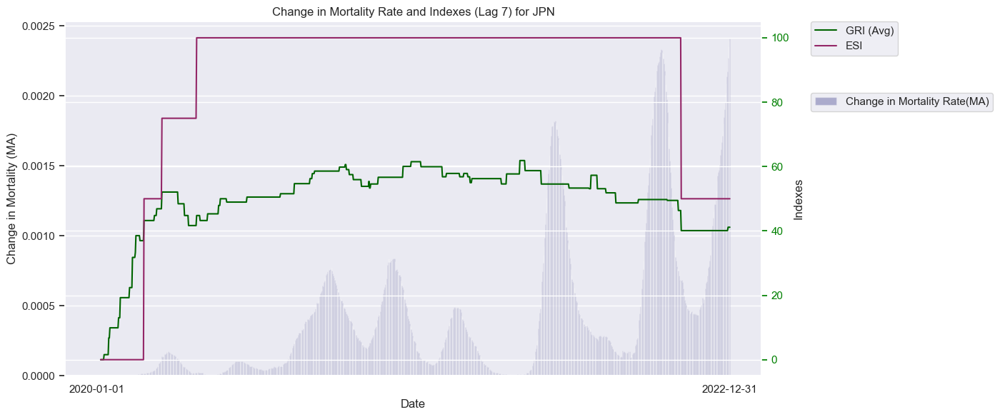

In [ ]:
start_date = justViewingLagged['Date'].min()
end_date = justViewingLagged['Date'].max()

for idx, country in enumerate(countries):

    plt.figure(figsize=(14, 6))

    data = justViewingLagged[justViewing['CountryCode'] == country].sort_values(by='Date')

    ax1 = sns.barplot(x='Date', y='ChangeMR_14dayMA', data=data, color='#040080',zorder=1,alpha=0.3,label='Change in Mortality Rate(MA)')
    ax1.set_ylabel('Change in Mortality (MA)')
    ax1.set_title(f'Change in Mortality Rate and Indexes (Lag 7) for {country}')
    ax1.tick_params(axis='y', colors='#292929')

    ax2 = ax1.twinx()
    sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag7', data=data, ax=ax2, color='darkgreen', label='GRI (Avg)')
    sns.lineplot(x='Date', y='EconomicSupportIndex_Lag7', data=data, ax=ax2, color='#932667', label='ESI')
    ax2.set_ylabel('Indexes')
    ax2.tick_params(axis='y', colors='green')

    ax1.legend(loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.xticks([start_date, end_date])
    plt.tight_layout()
    plt.show()

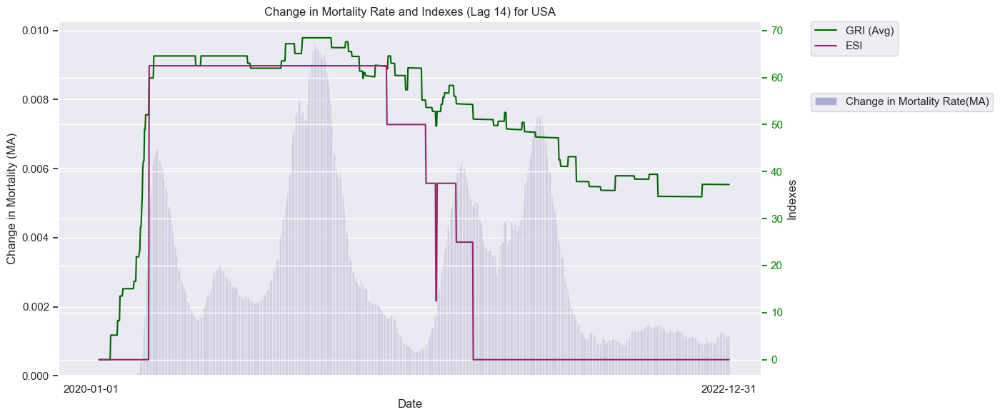

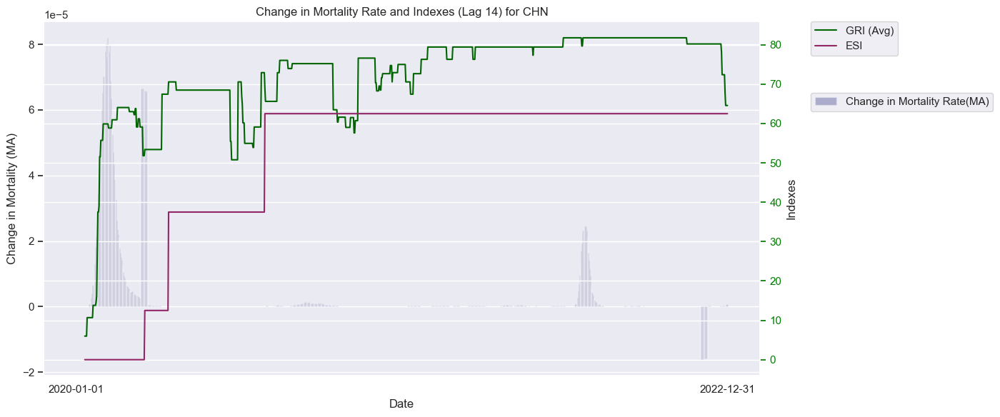

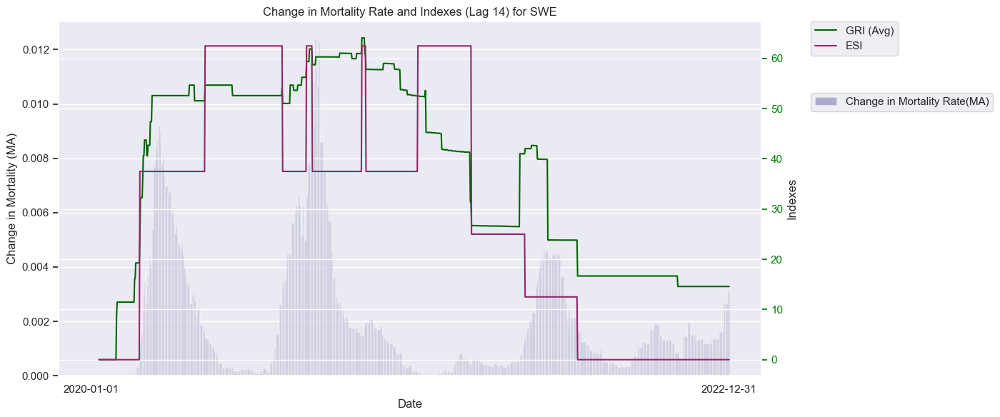

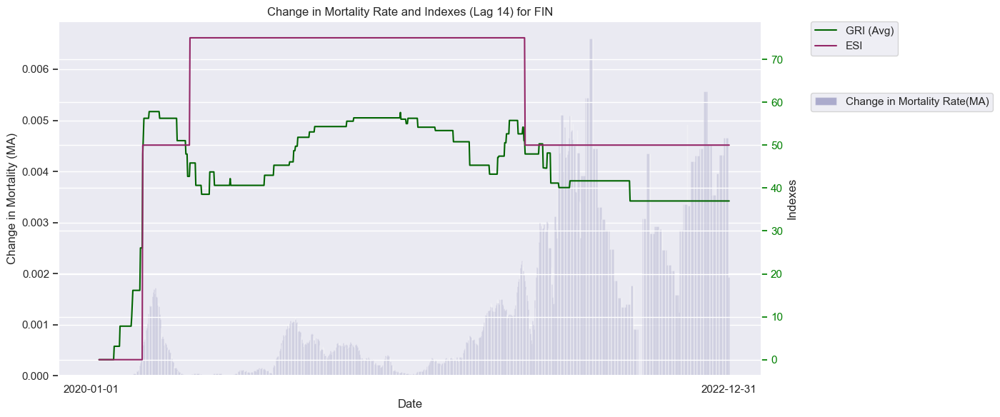

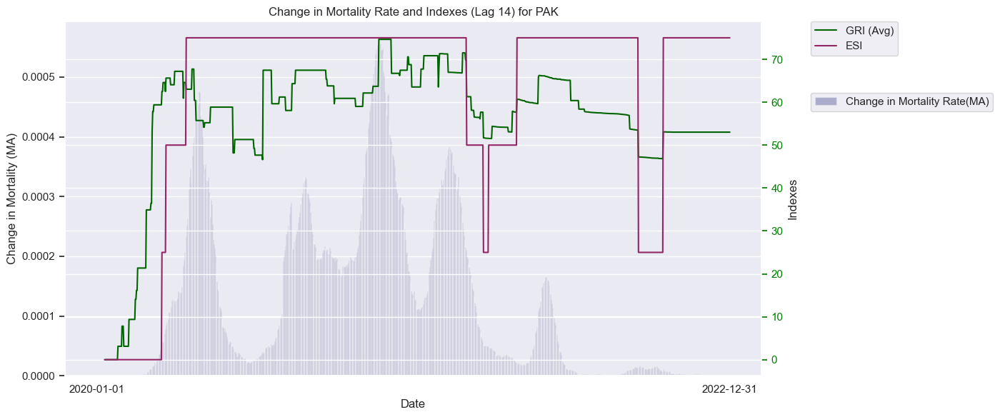

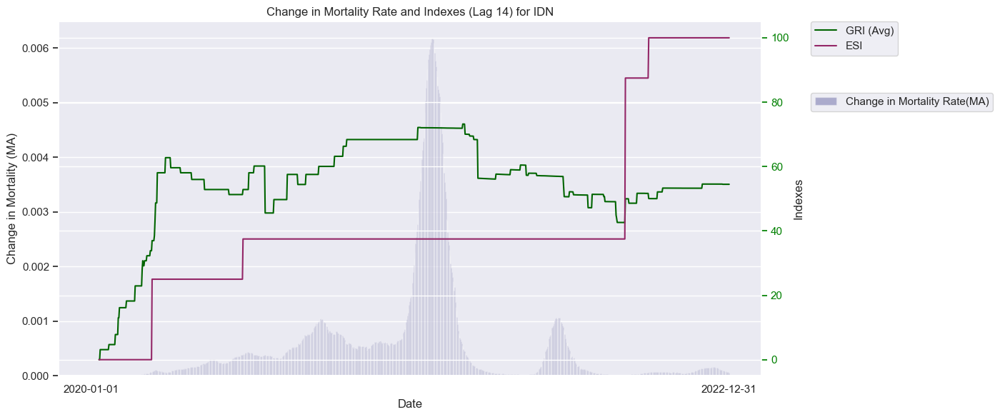

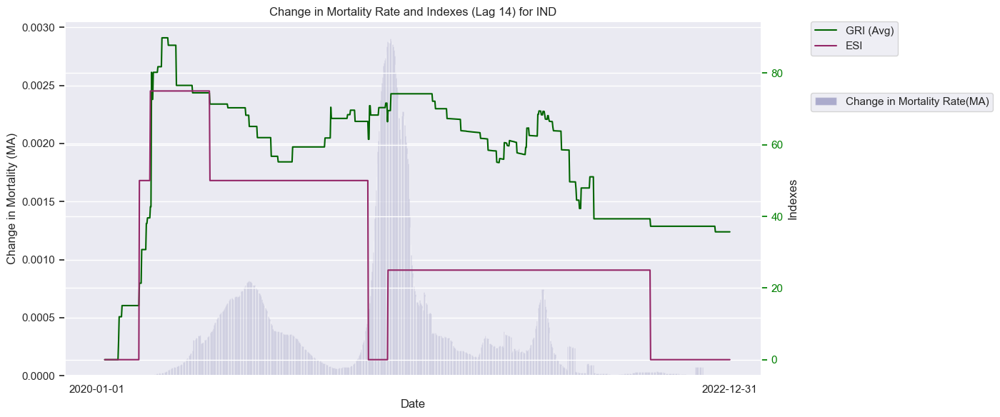

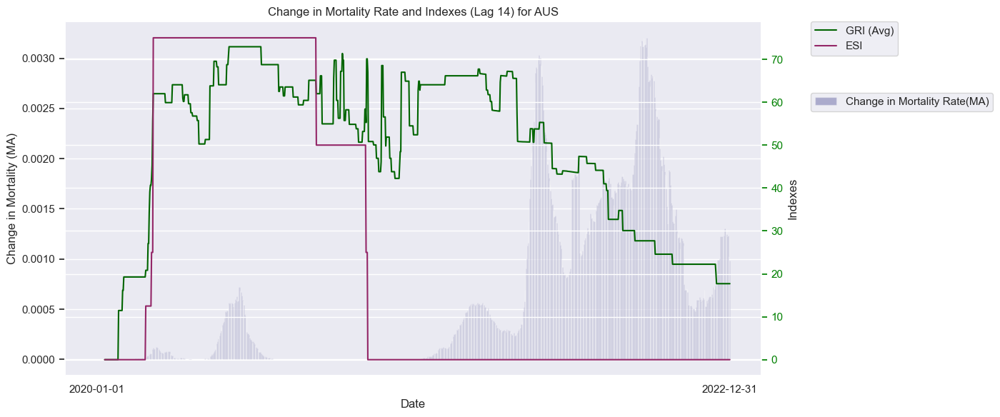

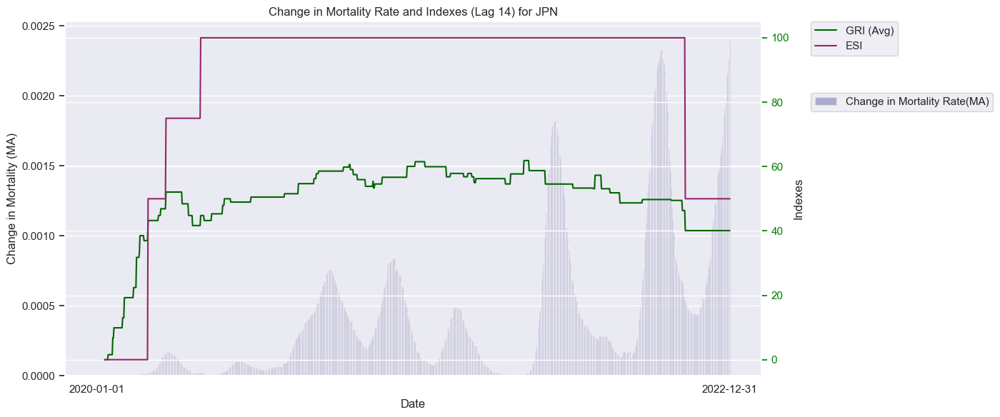

In [ ]:
start_date = justViewingLagged['Date'].min()
end_date = justViewingLagged['Date'].max()

for idx, country in enumerate(countries):

    plt.figure(figsize=(14, 6))

    data = justViewingLagged[justViewing['CountryCode'] == country].sort_values(by='Date')

    ax1 = sns.barplot(x='Date', y='ChangeMR_14dayMA', data=data, color='#040080',zorder=1,alpha=0.3,label='Change in Mortality Rate(MA)')
    ax1.set_ylabel('Change in Mortality (MA)')
    ax1.set_title(f'Change in Mortality Rate and Indexes (Lag 14) for {country}')
    ax1.tick_params(axis='y', colors='#292929')

    ax2 = ax1.twinx()
    sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag14', data=data, ax=ax2, color='darkgreen', label='GRI (Avg)')
    sns.lineplot(x='Date', y='EconomicSupportIndex_Lag14', data=data, ax=ax2, color='#932667', label='ESI')
    ax2.set_ylabel('Indexes')
    ax2.tick_params(axis='y', colors='green')

    ax1.legend(loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
    ax2.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
    plt.tight_layout(rect=[0, 0, 0.85, 1])

    plt.xticks([start_date, end_date])
    plt.tight_layout()
    plt.show()

#### Plot GRI with its lagged values for any one country

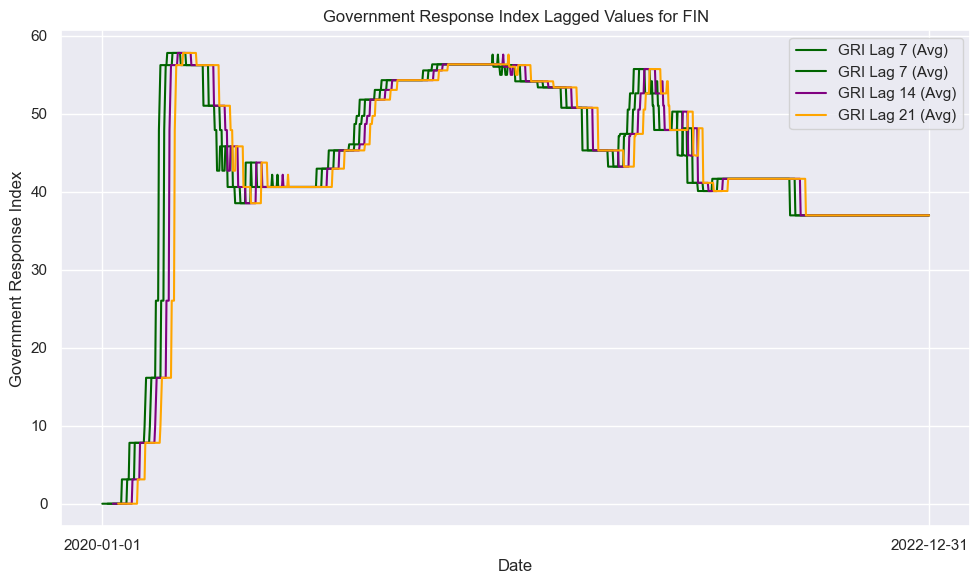

In [ ]:
country = 'FIN'

plt.figure(figsize=(10, 6))

data = justViewingLagged[justViewingLagged['CountryCode'] == country].sort_values(by='Date')

sns.lineplot(x='Date', y='GovernmentResponseIndex_Average', data=data, color='darkgreen', label='GRI Lag 7 (Avg)')
sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag7', data=data, color='darkgreen', label='GRI Lag 7 (Avg)')
sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag14', data=data, color='purple', label='GRI Lag 14 (Avg)')
sns.lineplot(x='Date', y='GovernmentResponseIndex_Average_Lag21', data=data, color='orange', label='GRI Lag 21 (Avg)')

plt.title(f'Government Response Index Lagged Values for {country}')
plt.ylabel('Government Response Index')
plt.xlabel('Date')
plt.legend()
plt.xticks([start_date, end_date])
plt.tight_layout()
plt.show()

#### Dropping China

In [5]:
df = df[df['CountryCode'] != 'CHN']

#### Create new features for every country

* Change in MR MA (14), CC MA (7)
* Include all lagged features for all intervals


In [6]:
df = df.sort_values(by=['CountryCode', 'Date'])
df['changeInCC'] = df.groupby(['CountryCode'])['ConfirmedCases'].transform(lambda x: x.diff())
df['changeInMR'] = df.groupby(['CountryCode'])['Mortality Rate'].transform(lambda x: x.diff())
df = df.replace(np.nan, 0)

df['ChangeCC_7dayMA'] = df.groupby(['CountryCode'])['changeInCC'].rolling(window=7, min_periods=1).mean().reset_index(0, drop=True)
df['ChangeMR_14dayMA'] = df.groupby(['CountryCode'])['changeInMR'].rolling(window=14, min_periods=1).mean().reset_index(0, drop=True)

df = df.sort_values(by=['CountryCode', 'Date'])

label_encoder = LabelEncoder()

df['MajorityVaccinated'] = label_encoder.fit_transform(df['MajorityVaccinated'])

def create_lagged_features(df, columns, days):
    df_lagged = df.copy()
    for day in days:
        for col in columns:
            df_lagged[col + f'_Lag{day}'] = df.groupby('CountryCode')[col].shift(day)
    return df_lagged


columns = ['StringencyIndex_Average', 'GovernmentResponseIndex_Average',
                 'ContainmentHealthIndex_Average', 'EconomicSupportIndex', 'H5', 'V1', 'V3', 'MajorityVaccinated']


days = [7,14,21]

dfWithLagged = create_lagged_features(df, columns, days)

dfWithLagged.head(1)

,CountryCode,Date,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,Mortality Rate,H5,V1,V3,Mortality_Rate_7day_MA,ConfirmedCases_7day_MA,changeInCC,changeInMR,ChangeCC_7dayMA,ChangeMR_14dayMA,StringencyIndex_Average_Lag7,GovernmentResponseIndex_Average_Lag7,ContainmentHealthIndex_Average_Lag7,EconomicSupportIndex_Lag7,H5_Lag7,V1_Lag7,V3_Lag7,MajorityVaccinated_Lag7,StringencyIndex_Average_Lag14,GovernmentResponseIndex_Average_Lag14,ContainmentHealthIndex_Average_Lag14,EconomicSupportIndex_Lag14,H5_Lag14,V1_Lag14,V3_Lag14,MajorityVaccinated_Lag14,StringencyIndex_Average_Lag21,GovernmentResponseIndex_Average_Lag21,ContainmentHealthIndex_Average_Lag21,EconomicSupportIndex_Lag21,H5_Lag21,V1_Lag21,V3_Lag21,MajorityVaccinated_Lag21
0,AFG,2020-01-01,0.0,0.0,0,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.5,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Imputing values

In [7]:
dfWithLagged = dfWithLagged.replace(np.nan, 0)

### Distribution of dataset by Country

In [8]:
dfWithLagged.shape

(163304, 47)

163304 / 1096 = 149, which is the number of countries in our dataset.

In [ ]:
size = dfWithLagged.groupby('CountryCode').size()
size.nunique()

1

### Check Label Encode Majority Vaccinated

In [ ]:
dfWithLagged['MajorityVaccinated'].nunique()
dfWithLagged['MajorityVaccinated_Lag7'].nunique()
dfWithLagged['MajorityVaccinated_Lag14'].nunique()
dfWithLagged['MajorityVaccinated_Lag21'].nunique()

2

In [9]:
dfWithLagged.shape

(163304, 47)

### Binary Encode Countries

In [10]:
encoder = BinaryEncoder(cols=['CountryCode'])
df_encoded = encoder.fit_transform(dfWithLagged['CountryCode'])

In [11]:
df_WithLag_encoded = pd.concat([dfWithLagged, df_encoded], axis=1)

In [12]:
df_WithLag_encoded.shape

(163304, 55)

In [13]:
df_WithLag_encoded.head()

,CountryCode,Date,ConfirmedCases,ConfirmedDeaths,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,Mortality Rate,H5,V1,V3,Mortality_Rate_7day_MA,ConfirmedCases_7day_MA,changeInCC,changeInMR,ChangeCC_7dayMA,ChangeMR_14dayMA,StringencyIndex_Average_Lag7,GovernmentResponseIndex_Average_Lag7,ContainmentHealthIndex_Average_Lag7,EconomicSupportIndex_Lag7,H5_Lag7,V1_Lag7,V3_Lag7,MajorityVaccinated_Lag7,StringencyIndex_Average_Lag14,GovernmentResponseIndex_Average_Lag14,ContainmentHealthIndex_Average_Lag14,EconomicSupportIndex_Lag14,H5_Lag14,V1_Lag14,V3_Lag14,MajorityVaccinated_Lag14,StringencyIndex_Average_Lag21,GovernmentResponseIndex_Average_Lag21,ContainmentHealthIndex_Average_Lag21,EconomicSupportIndex_Lag21,H5_Lag21,V1_Lag21,V3_Lag21,MajorityVaccinated_Lag21,CountryCode_0,CountryCode_1,CountryCode_2,CountryCode_3,CountryCode_4,CountryCode_5,CountryCode_6,CountryCode_7
0,AFG,2020-01-01,0.0,0.0,0,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.5,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1
198,AFG,2020-01-02,0.0,0.0,0,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.5,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1
386,AFG,2020-01-03,0.0,0.0,0,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.5,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1
518,AFG,2020-01-04,0.0,0.0,0,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.5,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1
714,AFG,2020-01-05,0.0,0.0,0,0.0,0.0,0.0,0.0,41128772.0,1803.987,64.83,0.5,0.0,0.0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,1


In [ ]:
columns = df_WithLag_encoded.columns
print(columns)

Index(['CountryCode', 'Date', 'ConfirmedCases', 'ConfirmedDeaths',
       'MajorityVaccinated', 'StringencyIndex_Average',
       'GovernmentResponseIndex_Average', 'ContainmentHealthIndex_Average',
       'EconomicSupportIndex', 'Population', 'GDP_Per_Capita',
       'Life_Expectancy', 'Hospital_Beds_Per_Thousand', 'Mortality Rate', 'H5',
       'V1', 'V3', 'Mortality_Rate_7day_MA', 'ConfirmedCases_7day_MA',
       'changeInCC', 'changeInMR', 'ChangeCC_7dayMA', 'ChangeMR_14dayMA',
       'StringencyIndex_Average_Lag7', 'GovernmentResponseIndex_Average_Lag7',
       'ContainmentHealthIndex_Average_Lag7', 'EconomicSupportIndex_Lag7',
       'H5_Lag7', 'V1_Lag7', 'V3_Lag7', 'MajorityVaccinated_Lag7',
       'StringencyIndex_Average_Lag14',
       'GovernmentResponseIndex_Average_Lag14',
       'ContainmentHealthIndex_Average_Lag14', 'EconomicSupportIndex_Lag14',
       'H5_Lag14', 'V1_Lag14', 'V3_Lag14', 'MajorityVaccinated_Lag14',
       'StringencyIndex_Average_Lag21',
       'Governme

### Regression Model Features

In [14]:
base_columns = ['CountryCode', 'Date', 'ConfirmedCases','Population', 'GDP_Per_Capita', 'Life_Expectancy', 'Hospital_Beds_Per_Thousand', 'ChangeCC_7dayMA','ChangeMR_14dayMA','CountryCode_0', 'CountryCode_1', 'CountryCode_2', 'CountryCode_3', 'CountryCode_4', 'CountryCode_5', 'CountryCode_6', 'CountryCode_7']
modelCols = base_columns + ['MajorityVaccinated', 'StringencyIndex_Average', 'GovernmentResponseIndex_Average', 'ContainmentHealthIndex_Average', 'EconomicSupportIndex', 'H5', 'V1', 'V3']
modelCols7 = base_columns + ['MajorityVaccinated_Lag7', 'StringencyIndex_Average_Lag7', 'GovernmentResponseIndex_Average_Lag7', 'ContainmentHealthIndex_Average_Lag7', 'EconomicSupportIndex_Lag7', 'H5_Lag7', 'V1_Lag7', 'V3_Lag7']
modelCols14 = base_columns + ['MajorityVaccinated_Lag14', 'StringencyIndex_Average_Lag14', 'GovernmentResponseIndex_Average_Lag14', 'ContainmentHealthIndex_Average_Lag14', 'EconomicSupportIndex_Lag14', 'H5_Lag14', 'V1_Lag14', 'V3_Lag14']
modelCols21 = base_columns + ['MajorityVaccinated_Lag21', 'StringencyIndex_Average_Lag21', 'GovernmentResponseIndex_Average_Lag21', 'ContainmentHealthIndex_Average_Lag21', 'EconomicSupportIndex_Lag21', 'H5_Lag21', 'V1_Lag21', 'V3_Lag21']

model = df_WithLag_encoded[modelCols]
model7 = df_WithLag_encoded[modelCols7]
model14 = df_WithLag_encoded[modelCols14]
model21 = df_WithLag_encoded[modelCols21]


print(model.shape)
print(model7.shape)
print(model14.shape)
print(model21.shape)


(163304, 25)
(163304, 25)
(163304, 25)
(163304, 25)


In [15]:
dataframes = [model, model7, model14, model21]

for df in dataframes:
    df['Date'] = pd.to_datetime(df['Date'])
    df['year'] = df['Date'].dt.year
    df['month'] = df['Date'].dt.month
    df['day'] = df['Date'].dt.day


### Add your results HERE!

In [16]:
model_dict = {
    'model': [model, 'basefeatures', {}],
    'model7': [model7, ' 7 days lag', {}],
    'model14': [model14, ' 14 days lag', {}],
    'model21': [model21, '21 days lag', {}],
}

### Correlation Matrices

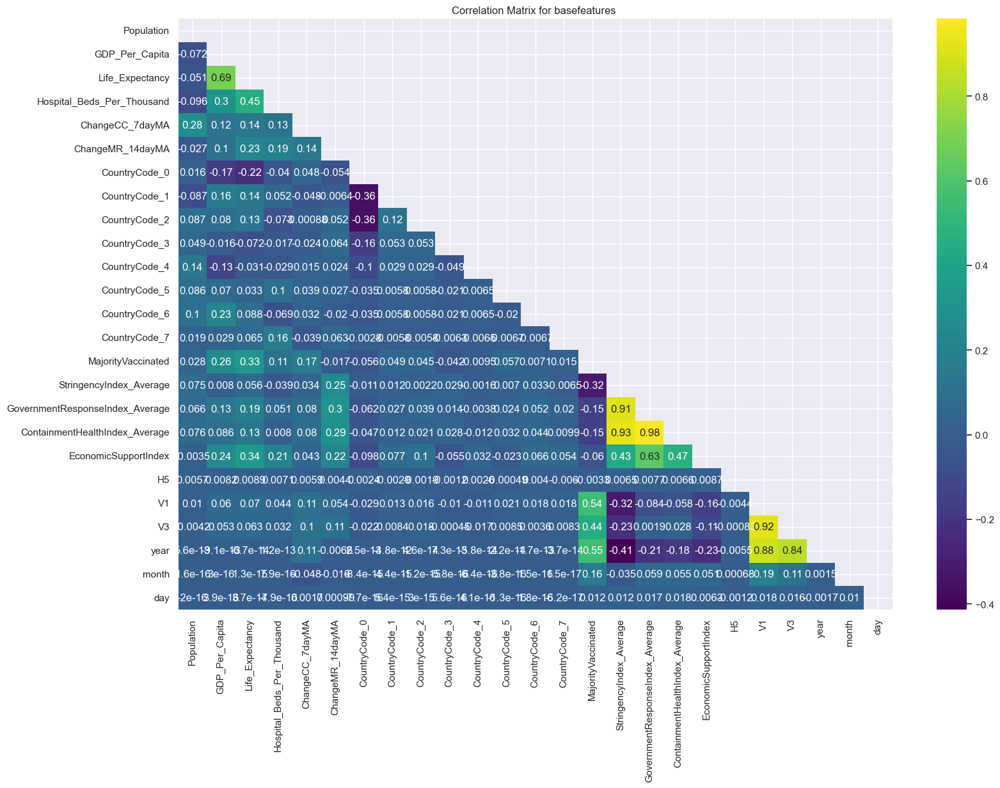

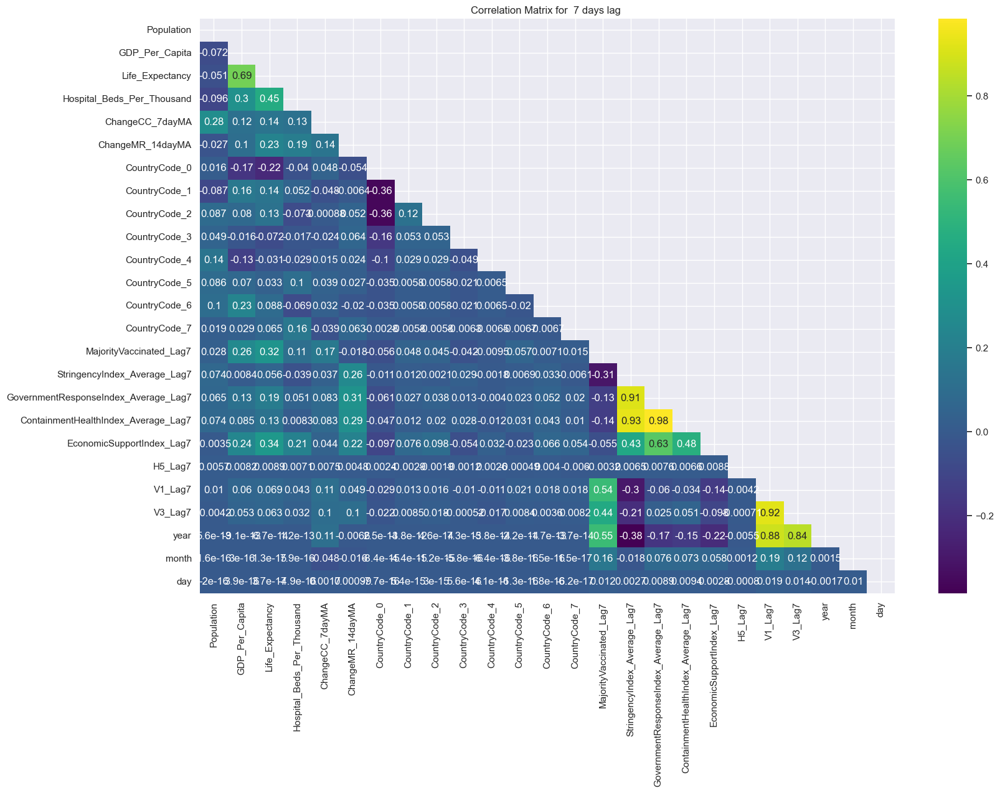

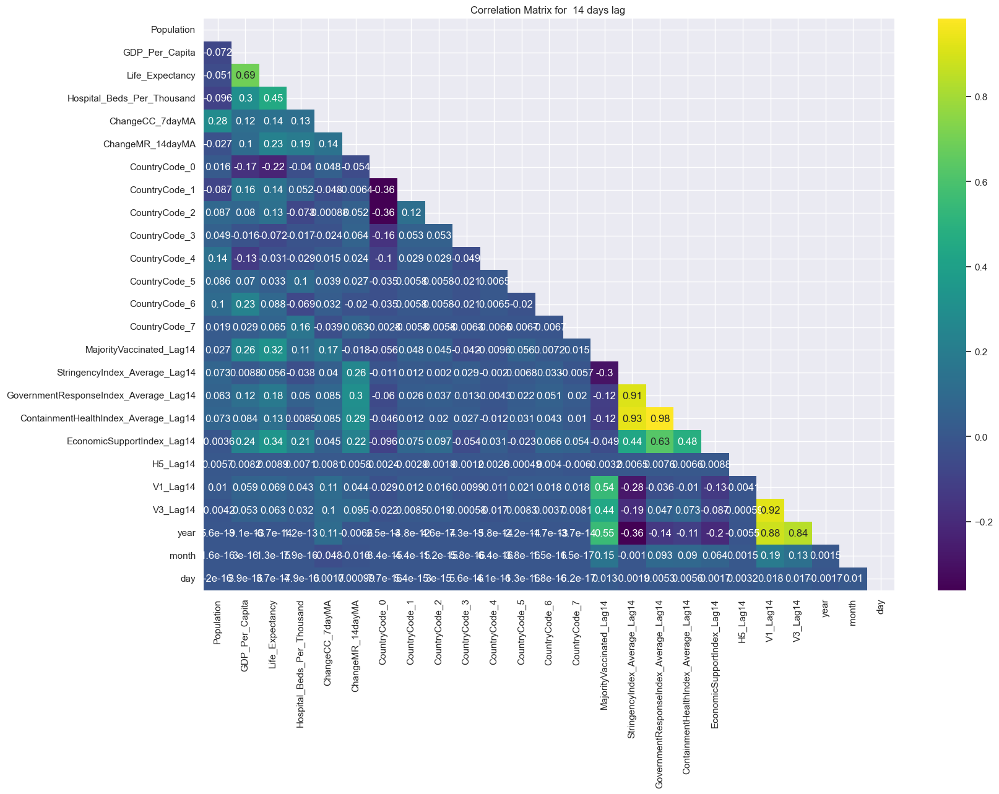

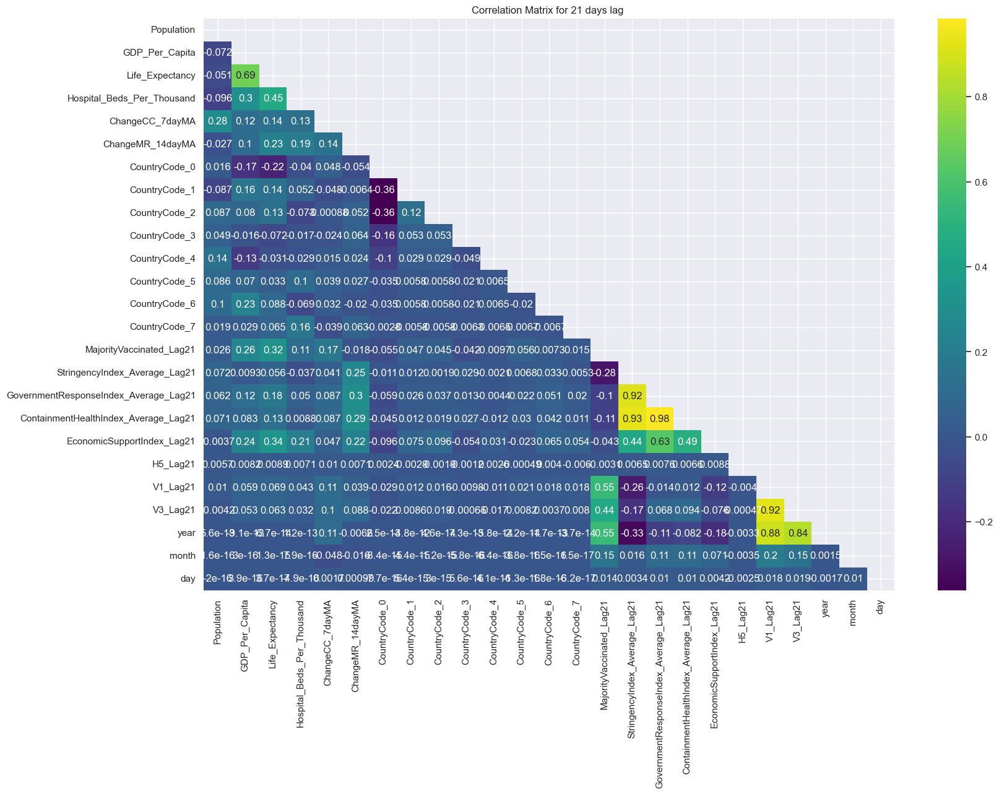

In [ ]:
for key, value in model_dict.items():
    plt.figure(figsize=(18, 12))
    corr_matrix = value[0].corr(numeric_only=True)
    #if key == 'model':
    #    print(corr_matrix)
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, mask=mask, cmap='viridis', annot=True)
    plt.title(f'Correlation Matrix for {value[1]} ')
    plt.show()


#### Dropping Collinear features

In [17]:
model.drop(columns=['ContainmentHealthIndex_Average', 'StringencyIndex_Average'], inplace=True)
model7.drop(columns=['ContainmentHealthIndex_Average_Lag7', 'StringencyIndex_Average_Lag7'], inplace=True)
model14.drop(columns=['ContainmentHealthIndex_Average_Lag14', 'StringencyIndex_Average_Lag14'], inplace=True)


In [18]:
model21.drop(columns=['ContainmentHealthIndex_Average_Lag21', 'StringencyIndex_Average_Lag21'], inplace=True)

In [19]:
for key, value in model_dict.items():
    print(value[0].shape)

(163304, 26)
(163304, 26)
(163304, 26)
(163304, 26)


### Basic model

In [ ]:
here = model.groupby('Date').agg({'ChangeCC_7dayMA':'sum', 'ChangeMR_14dayMA':'sum', 'MajorityVaccinated':'sum', 'GovernmentResponseIndex_Average':'mean', 'EconomicSupportIndex':'mean', 'H5':'mean', 'V1':'mean', 'V3':'mean'}).reset_index()
here['Date'] = pd.to_datetime(here['Date'])
here['year'] = here['Date'].dt.year
here['month'] = here['Date'].dt.month
here['day'] = here['Date'].dt.day

#### Change mortality rate MA 14 day

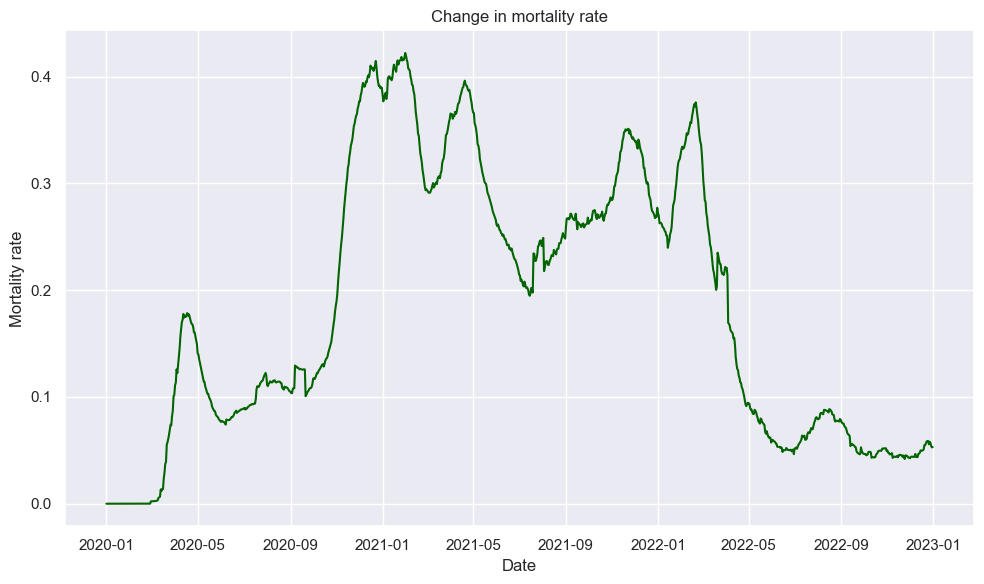

In [ ]:
plt.figure(figsize=(10, 6))

data = here.sort_values('Date')

plt.plot(data['Date'], data['ChangeMR_14dayMA'], color='darkgreen')

plt.title('Change in mortality rate')
plt.ylabel('Mortality rate')
plt.xlabel('Date')
plt.tight_layout()
plt.show()


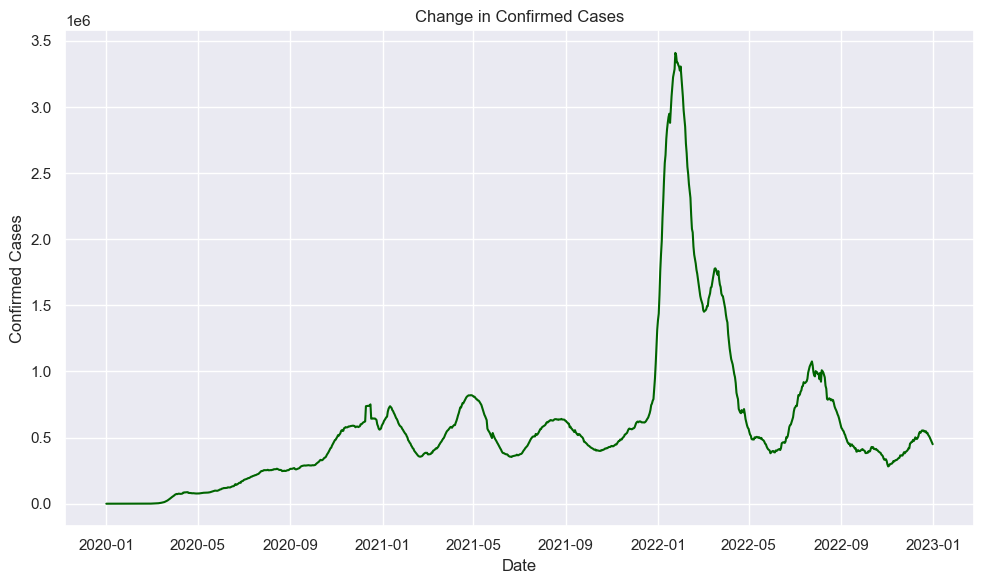

In [ ]:
plt.figure(figsize=(10,6))

plt.plot(data['Date'], data['ChangeCC_7dayMA'], color='darkgreen')

plt.title('Change in Confirmed Cases')
plt.ylabel('Confirmed Cases')
plt.xlabel('Date')
plt.tight_layout()
plt.show()

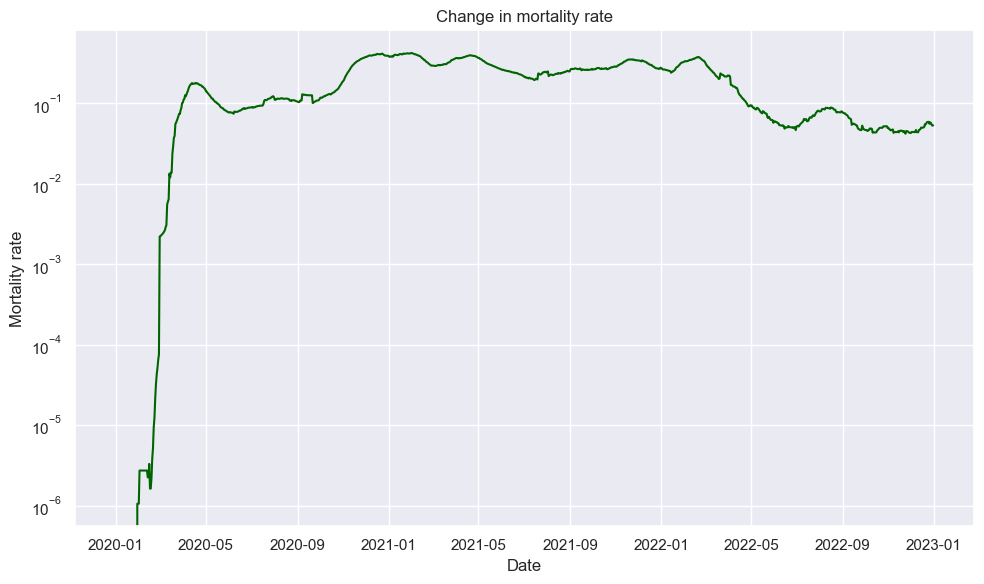

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(data['Date'], data['ChangeMR_14dayMA'], color='darkgreen')

plt.title('Change in mortality rate')
plt.ylabel('Mortality rate')
plt.xlabel('Date')
plt.yscale('log')
plt.tight_layout()
plt.show()


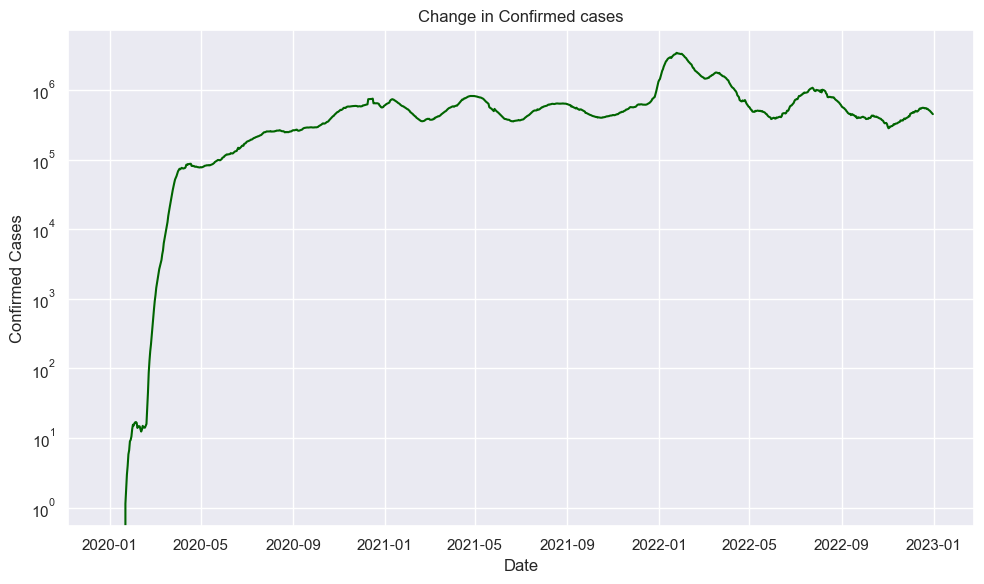

In [ ]:
plt.figure(figsize=(10,6))

plt.plot(data['Date'], data['ChangeCC_7dayMA'], color='darkgreen')

plt.title('Change in Confirmed cases')
plt.ylabel('Confirmed Cases')
plt.xlabel('Date')
plt.yscale('log')
plt.tight_layout()
plt.show()

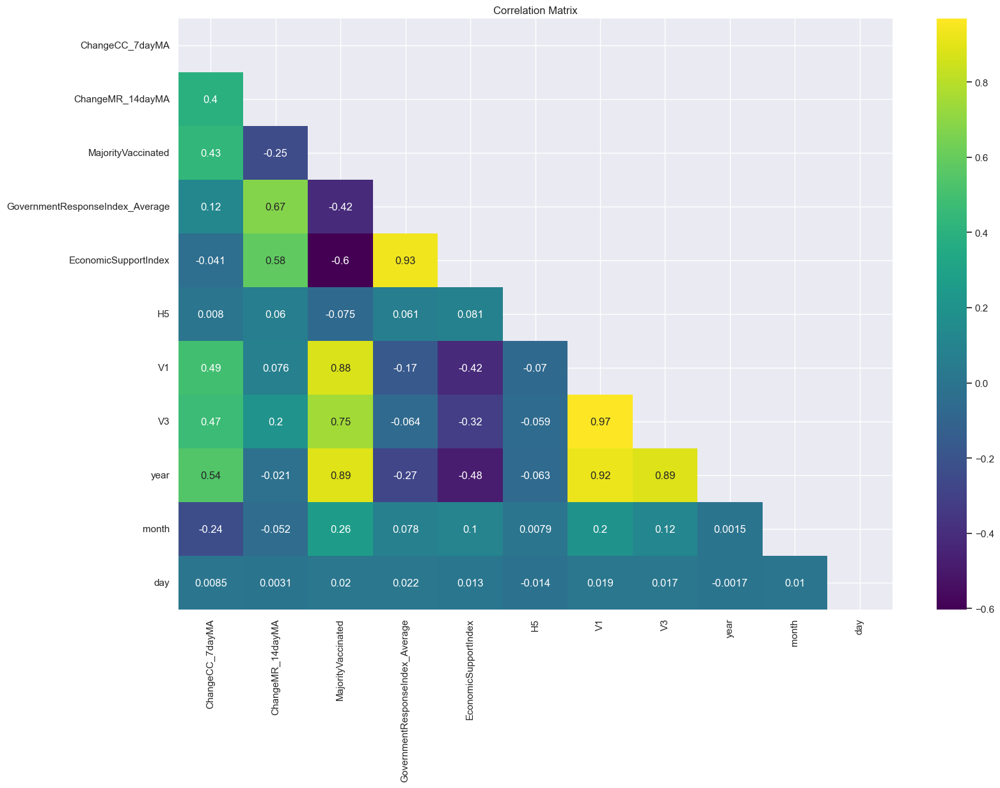

In [ ]:
plt.figure(figsize=(18, 12))
corr_matrix = here.corr(numeric_only=True)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, mask=mask, cmap='viridis', annot=True)
plt.title(f'Correlation Matrix')
plt.show()

In [ ]:
here.shape

(1096, 12)

In [ ]:
here.drop(columns=['Date'], inplace=True)

In [ ]:
here.head()

,ChangeCC_7dayMA,ChangeMR_14dayMA,MajorityVaccinated,GovernmentResponseIndex_Average,EconomicSupportIndex,H5,V1,V3,year,month,day
0,0.0,0.0,0,0.132752,0.0,0.0,0.0,0.006711,2020,1,1
1,0.0,0.0,0,0.199195,0.0,0.0,0.0,0.006711,2020,1,2
2,0.0,0.0,0,0.220134,0.0,0.0,0.0,0.006711,2020,1,3
3,0.0,0.0,0,0.262081,0.0,0.0,0.0,0.006711,2020,1,4
4,0.0,0.0,0,0.262081,0.0,0.0,0.0,0.006711,2020,1,5


In [ ]:
X = here.drop('ChangeMR_14dayMA', axis=1)
y = here['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression(n_jobs=-1)

lr.fit(X_train_scaled, y_train)

y_pred = lr.predict(X_test_scaled)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

model_dict['model'][2]['globalMR_r2'] = r2
model_dict['model'][2]['globalMR_mse'] = mse
model_dict['model'][2]['globalMR_rmse'] = rmse

In [ ]:
print(model_dict['model'][2])

{'globalMR_r2': 0.6878070282764837, 'globalMR_mse': 0.004782801497469299, 'globalMR_rmse': 0.06915780142159884}


#### With 7D

In [ ]:
here7 = model7.groupby('Date').agg({'ChangeCC_7dayMA':'sum', 'ChangeMR_14dayMA':'sum', 'MajorityVaccinated_Lag7':'sum', 'GovernmentResponseIndex_Average_Lag7':'mean', 'EconomicSupportIndex_Lag7':'mean', 'H5_Lag7':'mean', 'V1_Lag7':'mean', 'V3_Lag7':'mean'}).reset_index()
here7['Date'] = pd.to_datetime(here7['Date'])
here7['year'] = here7['Date'].dt.year
here7['month'] = here7['Date'].dt.month
here7['day'] = here7['Date'].dt.day
here7.drop(columns=['Date'], inplace=True)

In [ ]:
X = here7.drop('ChangeMR_14dayMA', axis=1)
y = here7['ChangeMR_14dayMA']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression(n_jobs=-1)

lr.fit(X_train_scaled, y_train)

y_pred = lr.predict(X_test_scaled)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

model_dict['model7'][2]['globalMR_r2'] = r2
model_dict['model7'][2]['globalMR_mse'] = mse
model_dict['model7'][2]['globalMR_rmse'] = rmse

In [ ]:
print(model_dict['model7'][2])

{'globalMR_r2': 0.6839473126798008, 'globalMR_mse': 0.004841932404336638, 'globalMR_rmse': 0.06958399531743373}


#### With 14 D

In [ ]:
here14 = model14.groupby('Date').agg({'ChangeCC_7dayMA':'sum', 'ChangeMR_14dayMA':'sum', 'MajorityVaccinated_Lag14':'sum', 'GovernmentResponseIndex_Average_Lag14':'mean', 'EconomicSupportIndex_Lag14':'mean', 'H5_Lag14':'mean', 'V1_Lag14':'mean', 'V3_Lag14':'mean'}).reset_index()
here14['Date'] = pd.to_datetime(here14['Date'])
here14['year'] = here14['Date'].dt.year
here14['month'] = here14['Date'].dt.month
here14['day'] = here14['Date'].dt.day
here14.drop(columns=['Date'], inplace=True)

In [ ]:
X = here14.drop('ChangeMR_14dayMA', axis=1)
y = here14['ChangeMR_14dayMA']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression(n_jobs=-1)

lr.fit(X_train_scaled, y_train)

y_pred = lr.predict(X_test_scaled)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

model_dict['model14'][2]['globalMR_r2'] = r2
model_dict['model14'][2]['globalMR_mse'] = mse
model_dict['model14'][2]['globalMR_rmse'] = rmse

In [ ]:
print(model_dict['model14'][2])

{'globalMR_r2': 0.6884833451731365, 'globalMR_mse': 0.004772440311411147, 'globalMR_rmse': 0.06908285106602902}


#### With 21 D

In [ ]:
here21 = model21.groupby('Date').agg({'ChangeCC_7dayMA':'sum', 'ChangeMR_14dayMA':'sum', 'MajorityVaccinated_Lag21':'sum', 'GovernmentResponseIndex_Average_Lag21':'mean', 'EconomicSupportIndex_Lag21':'mean', 'H5_Lag21':'mean', 'V1_Lag21':'mean', 'V3_Lag21':'mean'}).reset_index()
here21['Date'] = pd.to_datetime(here21['Date'])
here21['year'] = here21['Date'].dt.year
here21['month'] = here21['Date'].dt.month
here21['day'] = here21['Date'].dt.day
here21.drop(columns=['Date'], inplace=True)

X = here21.drop('ChangeMR_14dayMA', axis=1)
y = here21['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression(n_jobs=-1)

lr.fit(X_train_scaled, y_train)

y_pred = lr.predict(X_test_scaled)

r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

model_dict['model21'][2]['globalMR_r2'] = r2
model_dict['model21'][2]['globalMR_mse'] = mse
model_dict['model21'][2]['globalMR_rmse'] = rmse

In [ ]:
print(model_dict['model21'][2])

{'globalMR_r2': 0.6915708090641737, 'globalMR_mse': 0.004725140313464644, 'globalMR_rmse': 0.06873965604703478}


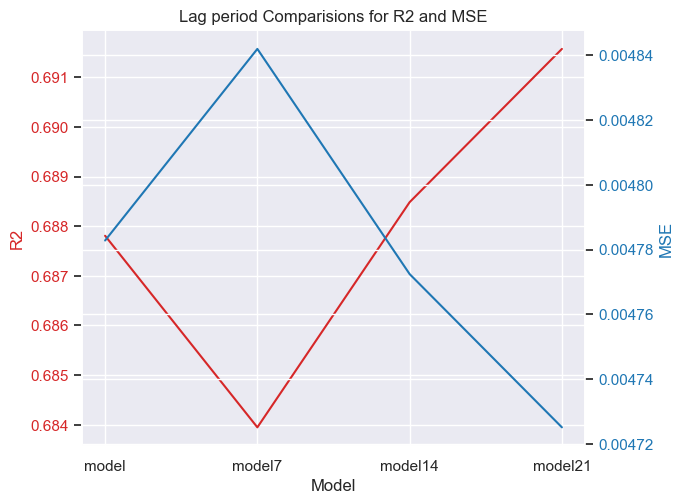

In [ ]:
models = list(model_dict.keys())
globalMR_r2 = [model_dict[model][2]['globalMR_r2'] for model in models]
globalMR_mse = [model_dict[model][2]['globalMR_mse'] for model in models]

fig, ax1 = plt.subplots(figsize=(7,5))

color = 'tab:red'
ax1.set_xlabel('Model')
ax1.set_ylabel('R2', color=color)
ax1.plot(models, globalMR_r2, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('MSE', color=color)
ax2.plot(models, globalMR_mse, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Lag period Comparisions for R2 and MSE')
plt.show()

#### Model21 with Elastic Net

In [ ]:
X = here21.drop('ChangeMR_14dayMA', axis=1)
y = here21['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

alpha = 0.3
l1_ratio = 0.2
iterations = [100, 300, 500, 700, 900, 1000, 1100, 1300, 1500]

lag21_dict = {}

for iteration in iterations:
    elastic_net = ElasticNet(alpha=alpha, l1_ratio=l1_ratio, max_iter=iteration, random_state=42)
    elastic_net.fit(X_train_scaled, y_train)
    y_pred = elastic_net.predict(X_test_scaled)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    lag21_dict[iteration] = {'r2': r2, 'mse': mse, 'rmse': rmse}

lag21_dict

{100: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 300: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 500: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 700: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 900: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 1000: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 1100: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 1300: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258},
 1500: {'r2': 0.19830302149215606,
  'mse': 0.012282010988766603,
  'rmse': 0.11082423466357258}}

##### no differece with change in max iterations

#### 21 D with Elastic Net and Grid Search

##### Experimenting with various values

In [ ]:
X = here21.drop('ChangeMR_14dayMA', axis=1)
y = here21['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()

parameters = {
    'enet__alpha': [1e-06, 5e-06, 8e-06, 1e-05, 1.2e-05, 1.5e-05, 1e-04],
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.7, 0.75, 0.8, 1.0]
}

iter = 2000

elastic_net = ElasticNet(max_iter=iter, random_state=42)
pipeline = Pipeline([
    ('scale', scaler),
    ('enet', elastic_net)
])

grid = GridSearchCV(estimator=pipeline, param_grid=parameters, n_jobs = -1, cv=5, scoring='r2')
grid.fit(X_train, y_train)


results21 = grid.cv_results_
best_params21 = grid.best_params_
best_score21 = grid.best_score_

best_model21 = grid.best_estimator_
y_pred = best_model21.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

alpha = best_params21['enet__alpha']
l1_ratio = best_params21['enet__l1_ratio']
parameters = f"alpha({alpha})__l1Ratio({l1_ratio}_{iter}"



/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.572e-03, tolerance: 1.032e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.991e-03, tolerance: 1.037e-03
  model = cd_fast.enet_coordinate_descent(


In [ ]:
for mean_score, params in zip(results21['mean_test_score'], results21['params']):
    print(params, 'has a mean cross-validation score of:', mean_score)

{'enet__alpha': 1e-06, 'enet__l1_ratio': 0.1} has a mean cross-validation score of: 0.687032562156712
{'enet__alpha': 1e-06, 'enet__l1_ratio': 0.25} has a mean cross-validation score of: 0.6870325111293188
{'enet__alpha': 1e-06, 'enet__l1_ratio': 0.5} has a mean cross-validation score of: 0.6870324316497494
{'enet__alpha': 1e-06, 'enet__l1_ratio': 0.7} has a mean cross-validation score of: 0.687032363044678
{'enet__alpha': 1e-06, 'enet__l1_ratio': 0.75} has a mean cross-validation score of: 0.6870323454348501
{'enet__alpha': 1e-06, 'enet__l1_ratio': 0.8} has a mean cross-validation score of: 0.6870323265980535
{'enet__alpha': 1e-06, 'enet__l1_ratio': 1.0} has a mean cross-validation score of: 0.6870322502317008
{'enet__alpha': 1e-05, 'enet__l1_ratio': 0.1} has a mean cross-validation score of: 0.6870350421766417
{'enet__alpha': 1e-05, 'enet__l1_ratio': 0.25} has a mean cross-validation score of: 0.6870339493104671
{'enet__alpha': 1e-05, 'enet__l1_ratio': 0.5} has a mean cross-validatio

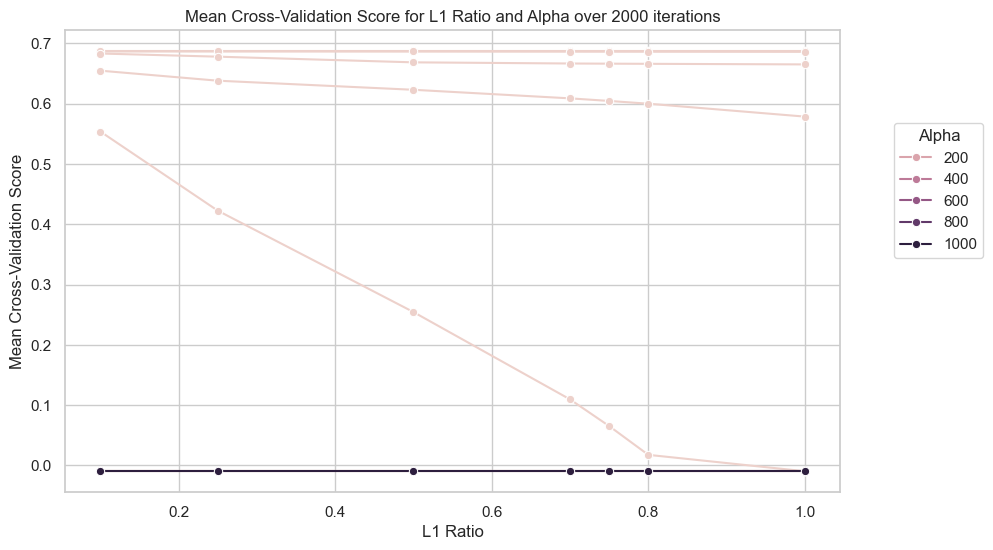

In [ ]:
params = results21['params']
mean_scores = results21['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

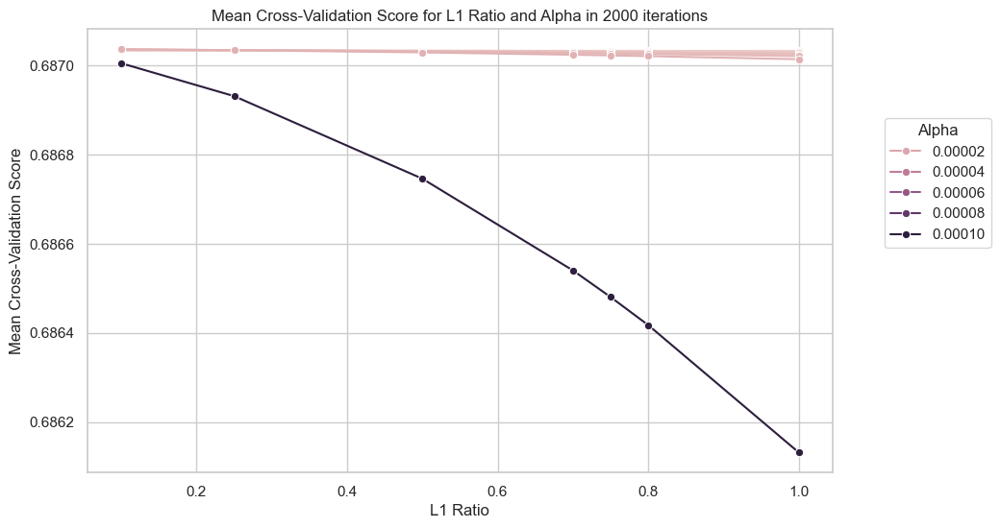

In [ ]:
params = results21['params']
mean_scores = results21['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

In [ ]:
alpha

1e-05

In [ ]:
l1_ratio

0.1

In [ ]:
if 'globalMR_ENGS_r2' not in model_dict['model21'][2]:
    model_dict['model21'][2]['globalMR_ENGS_r2'] = {}

model_dict['model21'][2]['globalMR_ENGS_r2'][f'{parameters}'] = r2

if 'globalMR_ENGS_mse' not in model_dict['model21'][2]:
    model_dict['model21'][2]['globalMR_ENGS_mse'] = {}
model_dict['model21'][2]['globalMR_ENGS_mse'][f'{parameters}'] = mse

if 'globalMR_ENGS_rmse' not in model_dict['model21'][2]:
    model_dict['model21'][2]['globalMR_ENGS_rmse'] = {}
model_dict['model21'][2]['globalMR_ENGS_rmse'][f'{parameters}'] = rmse

In [ ]:
print(model_dict['model21'][2])

{'globalMR_r2': 0.6915708090641737, 'globalMR_mse': 0.004725140313464644, 'globalMR_rmse': 0.06873965604703478, 'globalMR_ENGS_r2': {'alpha(1e-05)__l1Ratio(0.1': 0.6915694293903878, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.6915705443658691}, 'globalMR_ENGS_mse': {'alpha(1e-05)__l1Ratio(0.1': 0.004725161450089894, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.004725144368647054}, 'globalMR_ENGS_rmse': {'alpha(1e-05)__l1Ratio(0.1': 0.06873980979090569, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.06873968554370215}}


#### 14 D with Elastic Net and Grid Search

In [ ]:
X = here14.drop('ChangeMR_14dayMA', axis=1)
y = here14['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()

parameters = {
    'enet__alpha': [1e-06, 5e-06, 8e-06, 1e-05, 1.2e-05, 1.5e-05, 1e-04],
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.7, 0.75, 0.8, 1.0]
}

iter = 2000

elastic_net = ElasticNet(max_iter=iter, random_state=42)
pipeline = Pipeline([
    ('scale', scaler),
    ('enet', elastic_net)
])

grid = GridSearchCV(estimator=pipeline, param_grid=parameters, n_jobs = -1, cv=5, scoring='r2')
grid.fit(X_train, y_train)

results14 = grid.cv_results_
best_params14 = grid.best_params_
best_score14 = grid.best_score_

best_model14 = grid.best_estimator_
y_pred = best_model14.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

alpha = best_params14['enet__alpha']
l1_ratio = best_params14['enet__l1_ratio']
parameters = f"alpha({alpha})__l1Ratio({l1_ratio}_{iter}"

if 'globalMR_ENGS_r2' not in model_dict['model14'][2]:
    model_dict['model14'][2]['globalMR_ENGS_r2'] = {}

model_dict['model14'][2]['globalMR_ENGS_r2'][f'{parameters}'] = r2

if 'globalMR_ENGS_mse' not in model_dict['model14'][2]:
    model_dict['model14'][2]['globalMR_ENGS_mse'] = {}
model_dict['model14'][2]['globalMR_ENGS_mse'][f'{parameters}'] = mse

if 'globalMR_ENGS_rmse' not in model_dict['model14'][2]:
    model_dict['model14'][2]['globalMR_ENGS_rmse'] = {}
model_dict['model14'][2]['globalMR_ENGS_rmse'][f'{parameters}'] = rmse

/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.494e-03, tolerance: 1.032e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.063e-03, tolerance: 1.054e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.347e-03, toleranc

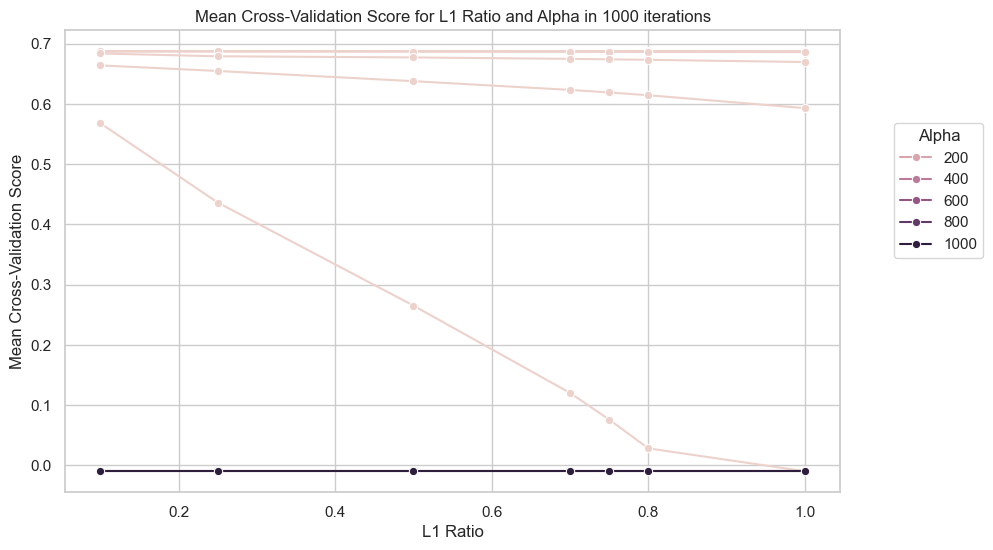

In [ ]:
params = results14['params']
mean_scores = results14['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 1000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

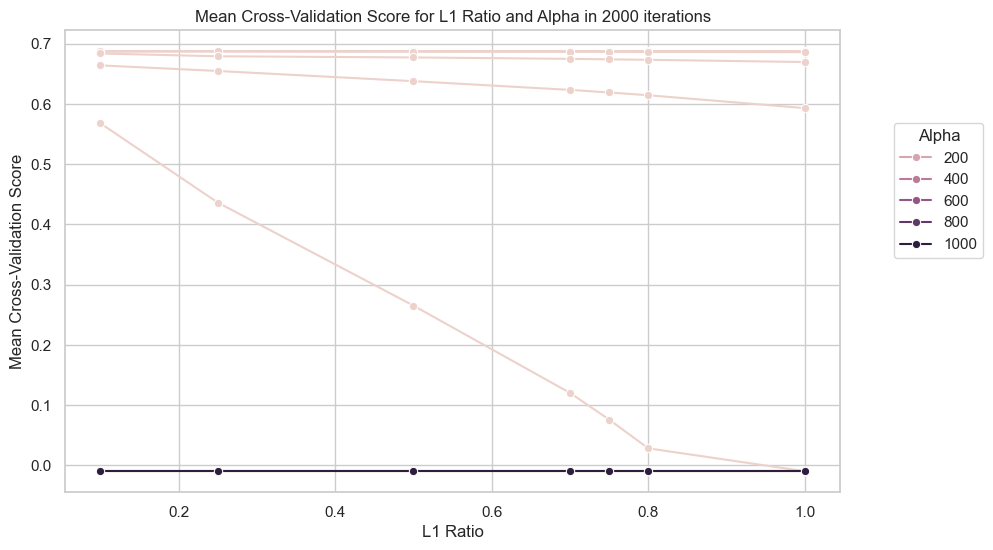

In [ ]:
params = results14['params']
mean_scores = results14['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

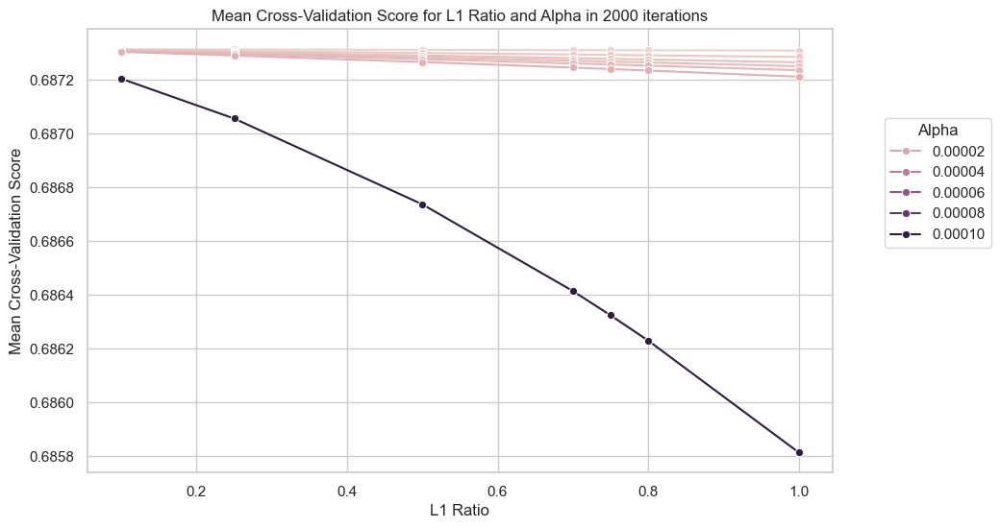

In [ ]:
params = results14['params']
mean_scores = results14['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

In [ ]:
alpha, l1_ratio

(1e-06, 0.1)

In [ ]:
print(model_dict['model14'][2])

{'globalMR_r2': 0.6884833451731365, 'globalMR_mse': 0.004772440311411147, 'globalMR_rmse': 0.06908285106602902, 'globalMR_ENGS_r2': {'alpha(1e-06)__l1Ratio(0.1': 0.6885014116896306, 'alpha(1e-06)__l1Ratio(0.1_2000': 0.6884871068758807}, 'globalMR_ENGS_mse': {'alpha(1e-06)__l1Ratio(0.1': 0.004772163532079231, 'alpha(1e-06)__l1Ratio(0.1_2000': 0.004772382682062804}, 'globalMR_ENGS_rmse': {'alpha(1e-06)__l1Ratio(0.1': 0.0690808477950237, 'alpha(1e-06)__l1Ratio(0.1_2000': 0.0690824339616288}}


#### 7 D with Elastic Net and Grid Search

In [ ]:
X = here7.drop('ChangeMR_14dayMA', axis=1)
y = here7['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()

parameters = {
    'enet__alpha': [1e-06, 5e-06, 8e-06, 1e-05, 1.2e-05, 1.5e-05, 1e-04],
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.7, 0.75, 0.8, 1.0]
}

iter = 2000

elastic_net = ElasticNet(max_iter=iter, random_state=42)
pipeline = Pipeline([
    ('scale', scaler),
    ('enet', elastic_net)
])

grid = GridSearchCV(estimator=pipeline, param_grid=parameters, n_jobs = -1, cv=5, scoring='r2')
grid.fit(X_train, y_train)

results7 = grid.cv_results_
best_params7 = grid.best_params_
best_score7 = grid.best_score_

best_model7 = grid.best_estimator_
y_pred = best_model7.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

alpha = best_params7['enet__alpha']
l1_ratio = best_params7['enet__l1_ratio']
parameters = f"alpha({alpha})__l1Ratio({l1_ratio}_{iter}"

if 'globalMR_ENGS_r2' not in model_dict['model7'][2]:
    model_dict['model7'][2]['globalMR_ENGS_r2'] = {}

model_dict['model7'][2]['globalMR_ENGS_r2'][f'{parameters}'] = r2

if 'globalMR_ENGS_mse' not in model_dict['model7'][2]:
    model_dict['model7'][2]['globalMR_ENGS_mse'] = {}
model_dict['model7'][2]['globalMR_ENGS_mse'][f'{parameters}'] = mse

if 'globalMR_ENGS_rmse' not in model_dict['model7'][2]:
    model_dict['model7'][2]['globalMR_ENGS_rmse'] = {}
model_dict['model7'][2]['globalMR_ENGS_rmse'][f'{parameters}'] = rmse

/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.110e-02, tolerance: 1.032e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.859e-02, tolerance: 1.045e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.523e-03, toleranc

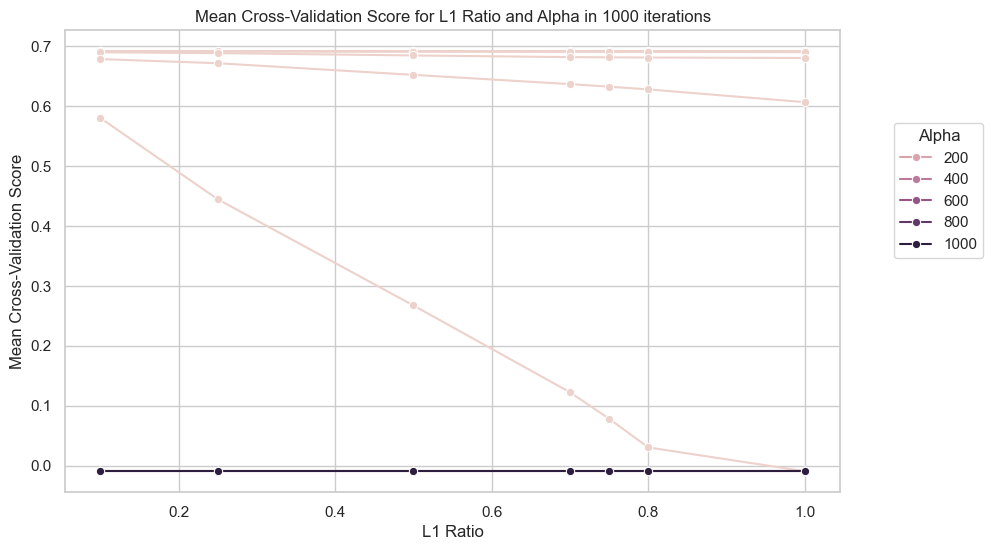

In [ ]:
params = results7['params']
mean_scores = results7['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 1000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

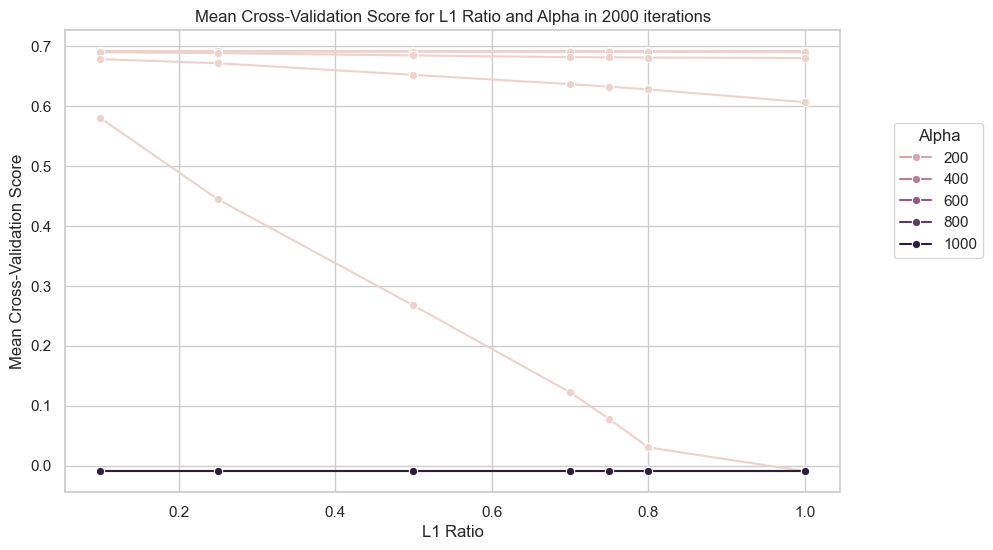

In [ ]:
params = results7['params']
mean_scores = results7['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

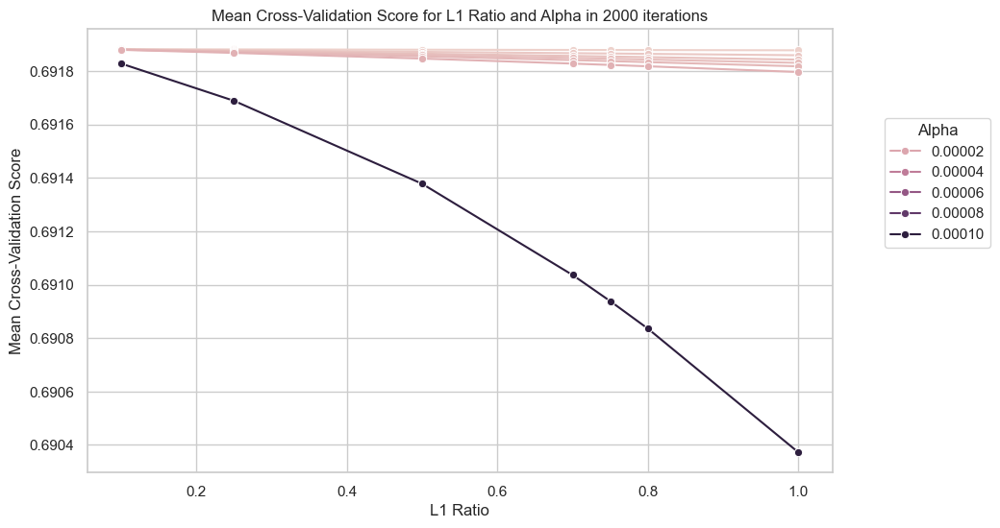

In [ ]:
params = results7['params']
mean_scores = results7['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

In [ ]:
alpha, l1_ratio

(1e-06, 0.1)

#### Base model with Elastic Net and Grid Search

In [ ]:
X = here.drop('ChangeMR_14dayMA', axis=1)
y = here['ChangeMR_14dayMA']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

scaler = StandardScaler()

parameters = {
    'enet__alpha': [1e-06, 5e-06, 8e-06, 1e-05, 1.2e-05, 1.5e-05, 1e-04],
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.7, 0.75, 0.8, 1.0]
}
iter = 2000

elastic_net = ElasticNet(max_iter=iter, random_state=42)
pipeline = Pipeline([
    ('scale', scaler),
    ('enet', elastic_net)
])

grid = GridSearchCV(estimator=pipeline, param_grid=parameters, n_jobs = -1, cv=5, scoring='r2')
grid.fit(X_train, y_train)

results = grid.cv_results_
best_params = grid.best_params_
best_score = grid.best_score_

best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

alpha = best_params['enet__alpha']
l1_ratio = best_params['enet__l1_ratio']
parameters = f"alpha({alpha})__l1Ratio({l1_ratio}_{iter}"

if 'globalMR_ENGS_r2' not in model_dict['model'][2]:
    model_dict['model'][2]['globalMR_ENGS_r2'] = {}

model_dict['model'][2]['globalMR_ENGS_r2'][f'{parameters}'] = r2

if 'globalMR_ENGS_mse' not in model_dict['model'][2]:
    model_dict['model'][2]['globalMR_ENGS_mse'] = {}
model_dict['model'][2]['globalMR_ENGS_mse'][f'{parameters}'] = mse

if 'globalMR_ENGS_rmse' not in model_dict['model'][2]:
    model_dict['model'][2]['globalMR_ENGS_rmse'] = {}
model_dict['model'][2]['globalMR_ENGS_rmse'][f'{parameters}'] = rmse

/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.126e-02, tolerance: 1.045e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.382e-02, tolerance: 1.032e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.694e-02, toleranc

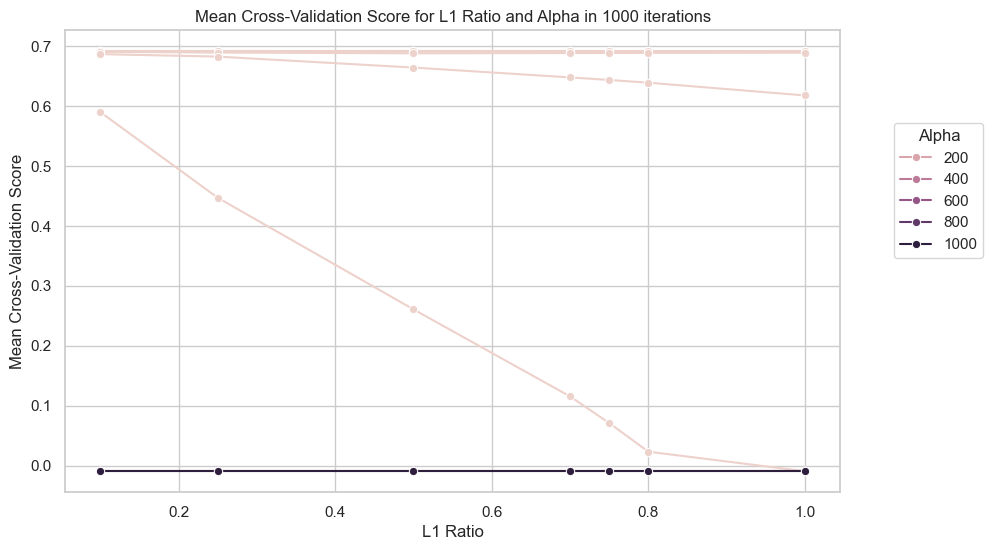

In [ ]:
params = results['params']
mean_scores = results['mean_test_score']

enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 1000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

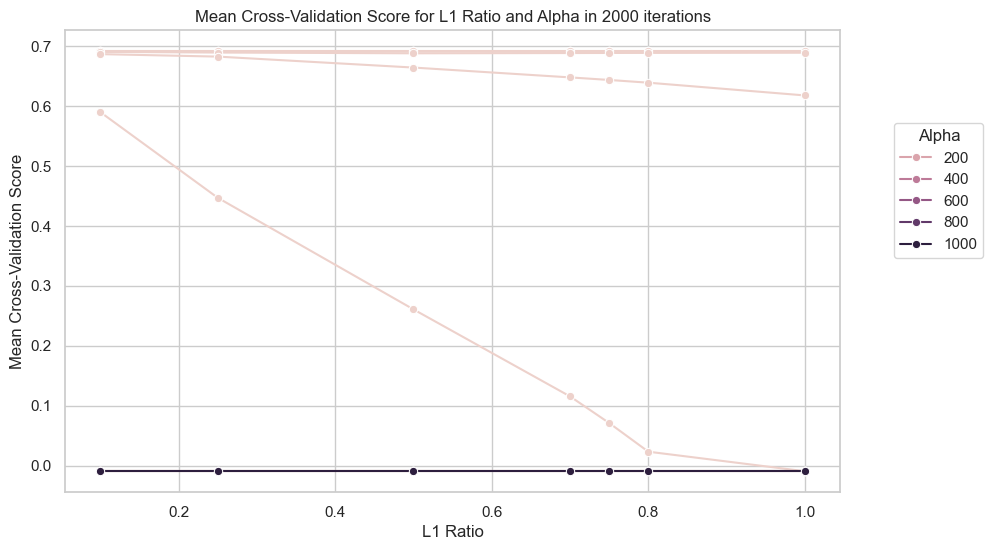

In [ ]:
params = results['params']
mean_scores = results['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

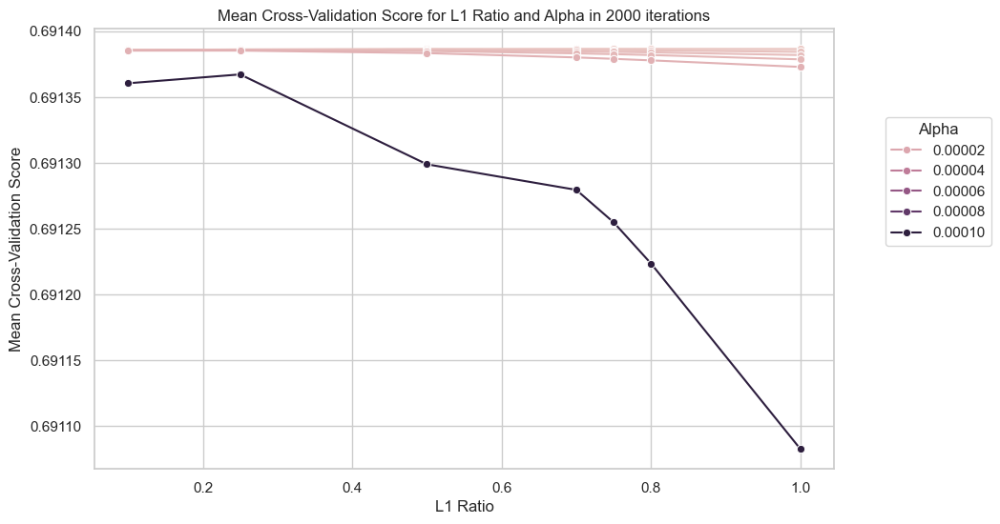

In [ ]:
params = results['params']
mean_scores = results['mean_test_score']


enet_l1_ratio = [p['enet__l1_ratio'] for p in params]
enet_alpha = [p['enet__alpha'] for p in params]


data = pd.DataFrame({
    'L1 Ratio': enet_l1_ratio,
    'Mean Score': mean_scores,
    'Alpha': enet_alpha
})


sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
line_plot = sns.lineplot(x='L1 Ratio', y='Mean Score', hue='Alpha', data=data, marker='o')
line_plot.set_title('Mean Cross-Validation Score for L1 Ratio and Alpha in 2000 iterations')
line_plot.set_xlabel('L1 Ratio')
line_plot.set_ylabel('Mean Cross-Validation Score')
plt.legend(title='Alpha', loc='upper left', bbox_to_anchor=(1.07, 0.8), borderaxespad=0.)
plt.show()

In [ ]:
model_dict['model14'][2]['globalMR_ENGS_r2']


{'alpha(1e-06)__l1Ratio(0.1': 0.6885014116896306}

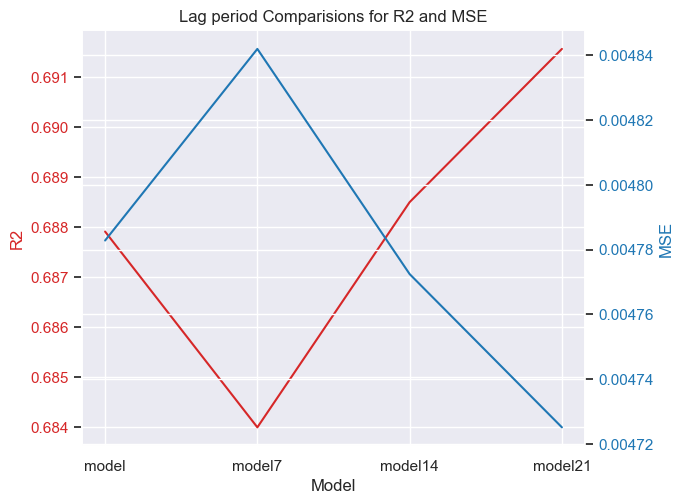

In [ ]:
models = list(model_dict.keys())
globalMR_ENGS_r2 = [model_dict[model][2]['globalMR_ENGS_r2'][key] for model in models for key in model_dict[model][2]['globalMR_ENGS_r2']]

globalMR_ENGS_mse = [model_dict[model][2]['globalMR_ENGS_mse'][key] for model in models for key in model_dict[model][2]['globalMR_ENGS_mse']]

fig, ax1 = plt.subplots(figsize=(7,5))

color = 'tab:red'
ax1.set_xlabel('Model')
ax1.set_ylabel('R2', color=color)
ax1.plot(models, globalMR_ENGS_r2, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('MSE', color=color)
ax2.plot(models, globalMR_mse, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Lag period Comparisions for R2 and MSE')
plt.show()

In [ ]:
globalMR_ENGS_mse, globalMR_ENGS_r2

([0.004781187909577054,
  0.004841238094907774,
  0.004772163532079231,
  0.004725161450089894],
 [0.6879123537430505,
  0.6839926330896081,
  0.6885014116896306,
  0.6915694293903878])

In [ ]:
globalMR_mse, globalMR_r2

([0.004782801497469299,
  0.004841932404336638,
  0.004772440311411147,
  0.004725140313464644],
 [0.6878070282764837,
  0.6839473126798008,
  0.6884833451731365,
  0.6915708090641737])

#### Grid Search

In [ ]:
best_params = grid.best_params_
best_score = grid.best_score_

best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)


model_dict['model21'][2]['globalMR_ENCV_r2'] = r2
model_dict['model21'][2]['globalMR_ENCV_mse'] = mse
model_dict['model21'][2]['globalMR_ENCV_rmse'] = rmse

In [ ]:
feature_importance = best_model21.named_steps['enet'].coef_
significant_features = {feature: coef for feature, coef in zip(here21.drop('ChangeMR_14dayMA', axis=1).columns, feature_importance) if coef != 0}

print(significant_features)

{'ChangeCC_7dayMA': 0.053970849333748, 'MajorityVaccinated_Lag21': -0.27799453966343285, 'GovernmentResponseIndex_Average_Lag21': 0.07366567505095171, 'EconomicSupportIndex_Lag21': -0.05749511114675212, 'H5_Lag21': -0.0013962195823743282, 'V1_Lag21': 0.2192707122112974, 'V3_Lag21': -0.16017548977286897, 'year': 0.14447218576804827, 'month': 0.05024485443302768, 'day': 0.0046020312986166855}


### Polynomial Features

In [ ]:
X = here21.drop('ChangeMR_14dayMA', axis=1)
y = here21['ChangeMR_14dayMA']

for degree in [2,3,4,5,6,7]:
 poly = PolynomialFeatures(degree=2)
 X_poly = poly.fit_transform(X)
 model = LinearRegression()
 model.fit(X_poly, y)
 y_pred = lr.predict(X_test_scaled)

 r2 = r2_score(y_test, y_pred)
 mse = mean_squared_error(y_test, y_pred)
 rmse = np.sqrt(mse)

 model_dict['model21'][2][f'globalMR_poly{degree}_r2'] = r2
 model_dict['model21'][2][f'globalMR_poly{degree}_mse'] = mse
 model_dict['model21'][2][f'globalMR_poly{degree}_rmse'] = rmse

In [ ]:
X = here21.drop('ChangeMR_14dayMA', axis=1)
X_log = np.log(X + 1)
X_log.isna().sum()

ChangeCC_7dayMA                          0
MajorityVaccinated_Lag21                 0
GovernmentResponseIndex_Average_Lag21    0
EconomicSupportIndex_Lag21               0
H5_Lag21                                 0
V1_Lag21                                 0
V3_Lag21                                 0
year                                     0
month                                    0
day                                      0
dtype: int64

In [ ]:
print(model_dict['model21'][2])

{'globalMR_r2': 0.6915708090641737, 'globalMR_mse': 0.004725140313464644, 'globalMR_rmse': 0.06873965604703478, 'globalMR_ENGS_r2': {'alpha(1e-05)__l1Ratio(0.1': 0.6915694293903878, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.6915705443658691}, 'globalMR_ENGS_mse': {'alpha(1e-05)__l1Ratio(0.1': 0.004725161450089894, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.004725144368647054}, 'globalMR_ENGS_rmse': {'alpha(1e-05)__l1Ratio(0.1': 0.06873980979090569, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.06873968554370215}, 'globalMR_poly2_r2': 0.6915708090641737, 'globalMR_poly2_mse': 0.004725140313464644, 'globalMR_poly2_rmse': 0.06873965604703478, 'globalMR_poly3_r2': 0.6915708090641737, 'globalMR_poly3_mse': 0.004725140313464644, 'globalMR_poly3_rmse': 0.06873965604703478, 'globalMR_poly4_r2': 0.6915708090641737, 'globalMR_poly4_mse': 0.004725140313464644, 'globalMR_poly4_rmse': 0.06873965604703478, 'globalMR_poly5_r2': 0.6915708090641737, 'globalMR_poly5_mse': 0.004725140313464644, 'globalMR_poly5_rmse': 0.0687396

#### Logarthimic scaling for 21 day

In [ ]:
X_log = np.log(X + 1)

X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
model_dict['model21'][2]['globalMR_log_r2'] = r2
model_dict['model21'][2]['globalMR_log_mse'] = mse
model_dict['model21'][2]['globalMR_log_rmse'] = rmse

print(model_dict['model21'][2]['globalMR_log_r2'])

0.7643177220616741


#### Logarthimic with Polynomial for 21 day

In [ ]:
transformer = FunctionTransformer(np.log1p, validate=False)


pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


pipeline.fit(X_train, y_train)


y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

model_dict['model21'][2]['globalMR_logT_r2'] = r2
model_dict['model21'][2]['globalMR_logT_mse'] = mse
model_dict['model21'][2]['globalMR_logT_rmse'] = rmse

print(model_dict['model21'][2]['globalMR_logT_r2'])

Mean Squared Error: 0.0003507534997541547
R-squared: 0.9775889591247131
0.9775889591247131


In [ ]:
X = here21.drop('ChangeMR_14dayMA', axis=1)
y = here21['ChangeMR_14dayMA']

In [ ]:
X

,ChangeCC_7dayMA,MajorityVaccinated_Lag21,GovernmentResponseIndex_Average_Lag21,EconomicSupportIndex_Lag21,H5_Lag21,V1_Lag21,V3_Lag21,year,month,day
0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,2020,1,1
1,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,2020,1,2
2,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,2020,1,3
3,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,2020,1,4
4,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,2020,1,5
...,...,...,...,...,...,...,...,...,...,...
1091,502723.857143,95.0,26.493960,14.177852,0.0,1.986577,4.973154,2022,12,27
1092,489222.000000,95.0,26.483490,14.177852,0.0,1.986577,4.973154,2022,12,28
1093,474659.714286,95.0,26.483490,14.177852,0.0,1.986577,4.973154,2022,12,29
1094,463845.142857,95.0,26.455302,14.177852,0.0,1.986577,4.973154,2022,12,30


In [ ]:
y

0       0.000000
1       0.000000
2       0.000000
3       0.000000
4       0.000000
          ...   
1091    0.058025
1092    0.057052
1093    0.054006
1094    0.052761
1095    0.053091
Name: ChangeMR_14dayMA, Length: 1096, dtype: float64

In [ ]:
X = here21.drop('ChangeMR_14dayMA', axis=1)
y = here21['ChangeMR_14dayMA']

parameters = {
    'enet__alpha': np.logspace(-6, 3, 10),
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.75, 1.0]
}

elastic_net = ElasticNet(max_iter=2000, random_state=42)
pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('enet', ElasticNet())
])



grid_search = GridSearchCV(pipeline, parameters, cv=5, scoring='r2', n_jobs=-1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, y_train)

best_model_lopo_21 = grid_search.best_estimator_

y_pred = best_model_lopo_21.predict(X_test)


mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mse)

best_params21 = grid.best_params_

alpha = best_params21['enet__alpha']
l1_ratio = best_params21['enet__l1_ratio']

model_dict['model21'][2]['globalMR_lopo_r2'] = r2
model_dict['model21'][2]['globalMR_lopo_mse'] = mse
model_dict['model21'][2]['globalMR_lopo_rmse'] = rmse

print("Best Parameters:", grid_search.best_params_)
print("Mean Squared Error:", mse)
print("R-squared:", r2)



/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.521e-01, tolerance: 1.115e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.872e-01, tolerance: 1.096e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.610e-01, toleranc

Best Parameters: {'enet__alpha': 0.0001, 'enet__l1_ratio': 0.25}
Mean Squared Error: 0.0011402761233653502
R-squared: 0.9271432079002317


/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.121e-02, tolerance: 1.125e-03
  model = cd_fast.enet_coordinate_descent(


In [ ]:
alpha, l1_ratio

(5e-06, 0.7)

#### Logarthimic Scaling for 14 day

In [ ]:
X = here14.drop('ChangeMR_14dayMA', axis=1)
y = here14['ChangeMR_14dayMA']

X_log = np.log(X + 1)

X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
model_dict['model14'][2]['globalMR_log_r2'] = r2
model_dict['model14'][2]['globalMR_log_mse'] = mse
model_dict['model14'][2]['globalMR_log_rmse'] = rmse

print(model_dict['model14'][2]['globalMR_log_r2'])

0.778005286589566


#### Logarthimic with Polynomial for 14 day

In [ ]:
transformer = FunctionTransformer(np.log1p, validate=False)


pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


pipeline.fit(X_train, y_train)


y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

model_dict['model14'][2]['globalMR_logT_r2'] = r2
model_dict['model14'][2]['globalMR_logT_mse'] = mse
model_dict['model14'][2]['globalMR_logT_rmse'] = rmse

print(model_dict['model14'][2]['globalMR_logT_r2'])

Mean Squared Error: 0.0003673502593325505
R-squared: 0.9765285259214251
0.9765285259214251


In [ ]:
X = here14.drop('ChangeMR_14dayMA', axis=1)
y = here14['ChangeMR_14dayMA']

parameters = {
    'enet__alpha': np.logspace(-6, 3, 10),
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.75, 1.0]
}

elastic_net = ElasticNet(max_iter=2000, random_state=42)
pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('enet', ElasticNet())
])



grid_search = GridSearchCV(pipeline, parameters, cv=5, scoring='r2', n_jobs=-1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, y_train)

best_model_lopo_14 = grid_search.best_estimator_

y_pred = best_model_lopo_14.predict(X_test)


mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mse)

best_params14 = grid.best_params_

alpha = best_params14['enet__alpha']
l1_ratio = best_params14['enet__l1_ratio']

model_dict['model14'][2]['globalMR_lopo_r2'] = r2
model_dict['model14'][2]['globalMR_lopo_mse'] = mse
model_dict['model14'][2]['globalMR_lopo_rmse'] = rmse

print("Best Parameters:", grid_search.best_params_)
print("Mean Squared Error:", mse)
print("R-squared:", r2)



/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.644e-01, tolerance: 1.115e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.906e-01, tolerance: 1.096e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.782e-01, toleranc

Best Parameters: {'enet__alpha': 0.0001, 'enet__l1_ratio': 0.25}
Mean Squared Error: 0.0011368425806051762
R-squared: 0.9273625906496533


/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.453e-03, tolerance: 1.096e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.160e-03, tolerance: 1.112e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.776e-03, toleranc

#### Logarthimic Scaling for 7 day

In [ ]:

X = here7.drop('ChangeMR_14dayMA', axis=1)
y = here7['ChangeMR_14dayMA']

X_log = np.log(X + 1)

X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
model_dict['model7'][2]['globalMR_log_r2'] = r2
model_dict['model7'][2]['globalMR_log_mse'] = mse
model_dict['model7'][2]['globalMR_log_rmse'] = rmse

print(model_dict['model7'][2]['globalMR_log_r2'])

0.8065294092800872


#### Logarthimic with Polynomial for 7 day

In [ ]:
transformer = FunctionTransformer(np.log1p, validate=False)


pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


pipeline.fit(X_train, y_train)


y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

model_dict['model7'][2]['globalMR_logT_r2'] = r2
model_dict['model7'][2]['globalMR_logT_mse'] = mse
model_dict['model7'][2]['globalMR_logT_rmse'] = rmse

print(model_dict['model7'][2]['globalMR_logT_r2'])

Mean Squared Error: 0.0003981638216316266
R-squared: 0.9745597244563455
0.9745597244563455


In [ ]:
X = here7.drop('ChangeMR_14dayMA', axis=1)
y = here7['ChangeMR_14dayMA']


parameters = {
    'enet__alpha': [ 0.001, 0.01],
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.75, 1.0]
}

elastic_net = ElasticNet(max_iter=100000, random_state=42, tol=0.01)
pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('enet', ElasticNet())
])



grid_search = GridSearchCV(pipeline, parameters, cv=5, scoring='r2', n_jobs=-1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, y_train)

best_model_lopo_7 = grid_search.best_estimator_

y_pred = best_model_lopo_7.predict(X_test)


mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mse)

best_params7 = grid.best_params_

alpha = best_params7['enet__alpha']
l1_ratio = best_params7['enet__l1_ratio']

model_dict['model7'][2][f'globalMR_lopo_r2_{alpha}'] = r2
model_dict['model7'][2][f'globalMR_lopo_mse_{alpha}'] = mse
model_dict['model7'][2][f'globalMR_lopo_rmse_{alpha}'] = rmse

print("Best Parameters:", grid_search.best_params_)
print("Mean Squared Error:", mse)
print("R-squared:", r2)


Best Parameters: {'enet__alpha': 0.001, 'enet__l1_ratio': 0.1}
Mean Squared Error: 0.001290772565117529
R-squared: 0.9175273896402363


/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.085e-01, tolerance: 1.115e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.738e-01, tolerance: 1.096e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.462e-01, toleranc

In [ ]:

X = here.drop('ChangeMR_14dayMA', axis=1)
y = here['ChangeMR_14dayMA']

X_log = np.log(X + 1)

X_train, X_test, y_train, y_test = train_test_split(X_log, y, test_size=0.2, random_state=0)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
model_dict['model'][2]['globalMR_log_r2'] = r2
model_dict['model'][2]['globalMR_log_mse'] = mse
model_dict['model'][2]['globalMR_log_rmse'] = rmse

print(model_dict['model'][2]['globalMR_log_r2'])

0.8253162063994512


In [ ]:
transformer = FunctionTransformer(np.log1p, validate=False)


pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('regressor', LinearRegression())
])


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


pipeline.fit(X_train, y_train)


y_pred = pipeline.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R-squared:", r2)

model_dict['model'][2]['globalMR_logT_r2'] = r2
model_dict['model'][2]['globalMR_logT_mse'] = mse
model_dict['model'][2]['globalMR_logT_rmse'] = rmse

print(model_dict['model'][2]['globalMR_logT_r2'])

Mean Squared Error: 0.0003619386020523194
R-squared: 0.9768742983017302
0.9768742983017302


#### Base model with Elastic net cv

In [ ]:
X = here.drop('ChangeMR_14dayMA', axis=1)
y = here['ChangeMR_14dayMA']

parameters = {
    'enet__alpha': np.logspace(-6, 1, 4),
    'enet__l1_ratio': [0.1, 0.25, 0.5, 0.75, 1.0]
}

elastic_net = ElasticNet(max_iter=5000, random_state=42)

pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('enet', ElasticNet())
])



grid_search = GridSearchCV(pipeline, parameters, cv=5, scoring='r2', n_jobs=-1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

grid_search.fit(X_train, y_train)


best_model_lopo = grid_search.best_estimator_

y_pred = best_model_lopo.predict(X_test)


mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mse)

model_dict['model'][2]['globalMR_lopo_r2'] = r2
model_dict['model'][2]['globalMR_lopo_mse'] = mse
model_dict['model'][2]['globalMR_lopo_rmse'] = rmse

print("Best Parameters:", grid_search.best_params_)
print("Mean Squared Error:", mse)
print("R-squared:", r2)



/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.297e-01, tolerance: 1.112e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.255e-01, tolerance: 1.115e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.283e-01, toleranc

Best Parameters: {'enet__alpha': 1e-06, 'enet__l1_ratio': 1.0}
Mean Squared Error: 0.0012069549450653583
R-squared: 0.9228828318820815


/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.984e-01, tolerance: 1.115e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.401e-01, tolerance: 1.125e-03
  model = cd_fast.enet_coordinate_descent(
/opt/homebrew/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.122e-01, toleranc

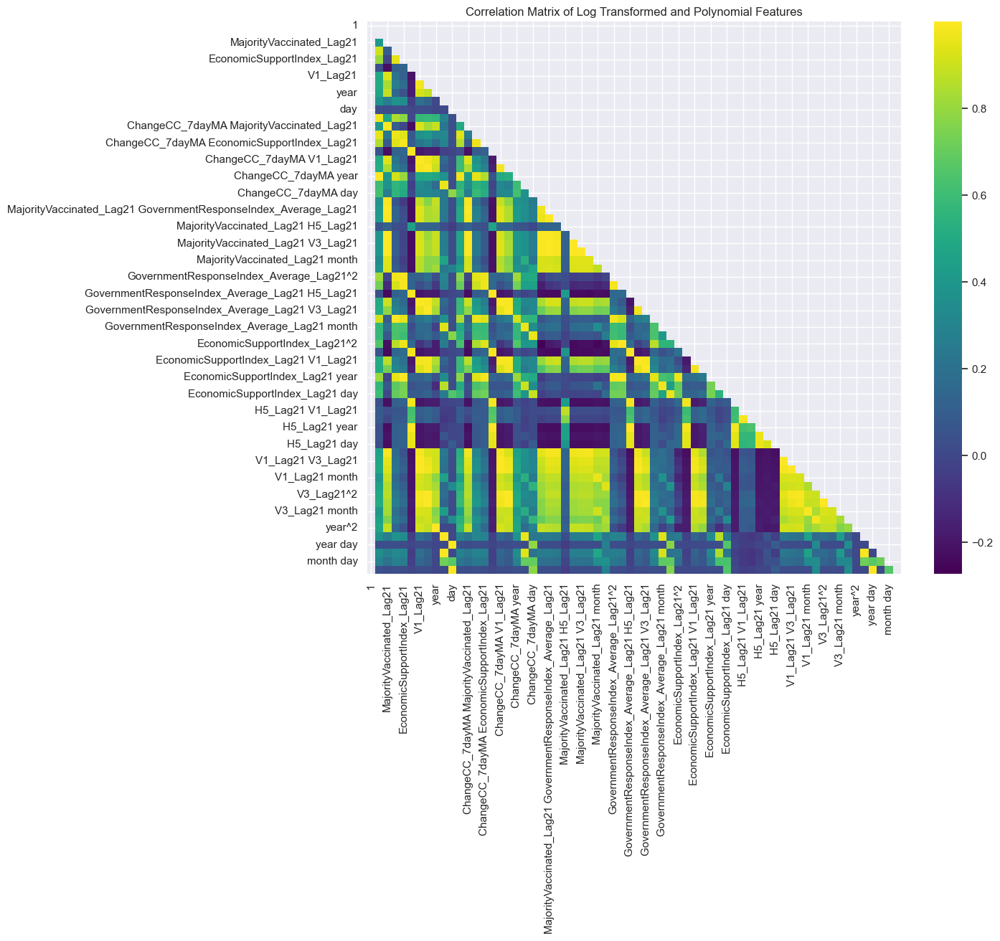

In [ ]:
transformer = FunctionTransformer(np.log1p, validate=False)

pipeline = Pipeline([
    ('log_transform', transformer),
    ('poly_features', PolynomialFeatures(degree=2))
])

X_transformed = pipeline.fit_transform(X)

feature_names = pipeline.named_steps['poly_features'].get_feature_names_out(input_features=X.columns)
X_transformed_df = pd.DataFrame(X_transformed, columns=feature_names)



corr_matrix = X_transformed_df.corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, mask = mask, annot=False, cmap='viridis', fmt=".1f")
plt.title('Correlation Matrix of Log Transformed and Polynomial Features')
plt.show()

In [ ]:
print(model_dict['model21'][2])

{'globalMR_r2': 0.6915708090641737, 'globalMR_mse': 0.004725140313464644, 'globalMR_rmse': 0.06873965604703478, 'globalMR_ENGS_r2': {'alpha(1e-05)__l1Ratio(0.1': 0.6915694293903878, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.6915705443658691}, 'globalMR_ENGS_mse': {'alpha(1e-05)__l1Ratio(0.1': 0.004725161450089894, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.004725144368647054}, 'globalMR_ENGS_rmse': {'alpha(1e-05)__l1Ratio(0.1': 0.06873980979090569, 'alpha(1e-05)__l1Ratio(0.1_2000': 0.06873968554370215}, 'globalMR_poly2_r2': 0.6915708090641737, 'globalMR_poly2_mse': 0.004725140313464644, 'globalMR_poly2_rmse': 0.06873965604703478, 'globalMR_poly3_r2': 0.6915708090641737, 'globalMR_poly3_mse': 0.004725140313464644, 'globalMR_poly3_rmse': 0.06873965604703478, 'globalMR_poly4_r2': 0.6915708090641737, 'globalMR_poly4_mse': 0.004725140313464644, 'globalMR_poly4_rmse': 0.06873965604703478, 'globalMR_poly5_r2': 0.6915708090641737, 'globalMR_poly5_mse': 0.004725140313464644, 'globalMR_poly5_rmse': 0.0687396

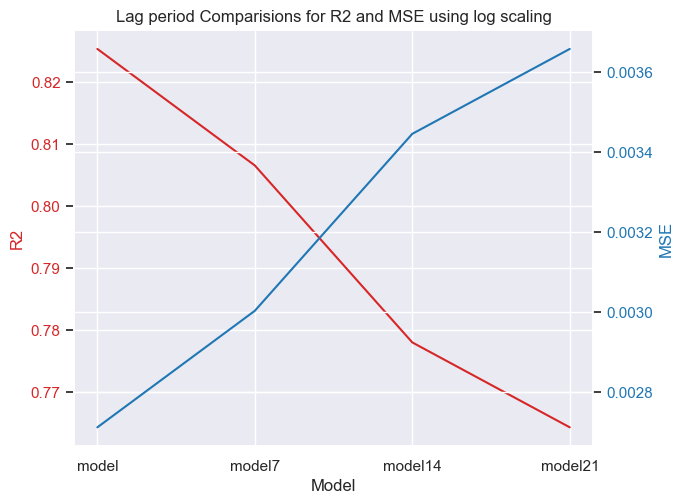

In [ ]:
models = list(model_dict.keys())
globalMR_r2 = [model_dict[model][2]['globalMR_log_r2'] for model in models]
globalMR_mse = [model_dict[model][2]['globalMR_log_mse'] for model in models]

fig, ax1 = plt.subplots(figsize=(7,5))

color = 'tab:red'
ax1.set_xlabel('Model')
ax1.set_ylabel('R2', color=color)
ax1.plot(models, globalMR_r2, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('MSE', color=color)
ax2.plot(models, globalMR_mse, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Lag period Comparisions for R2 and MSE using log scaling')
plt.show()

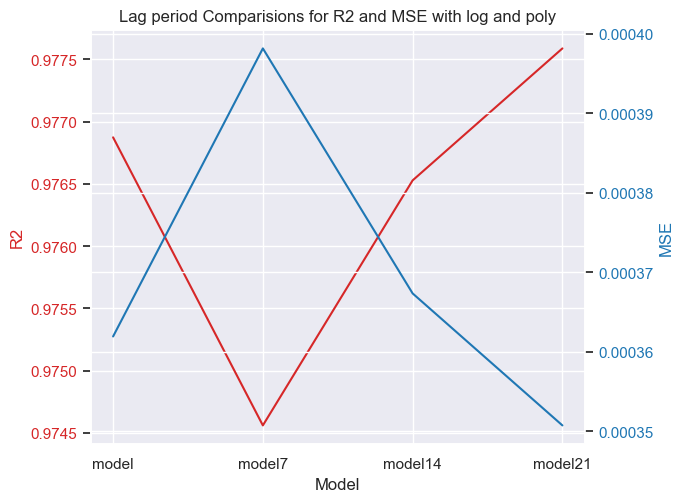

In [ ]:
models = list(model_dict.keys())
globalMR_r2 = [model_dict[model][2]['globalMR_logT_r2'] for model in models]
globalMR_mse = [model_dict[model][2]['globalMR_logT_mse'] for model in models]

fig, ax1 = plt.subplots(figsize=(7,5))

color = 'tab:red'
ax1.set_xlabel('Model')
ax1.set_ylabel('R2', color=color)
ax1.plot(models, globalMR_r2, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('MSE', color=color)
ax2.plot(models, globalMR_mse, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Lag period Comparisions for R2 and MSE with log and poly')
plt.show()

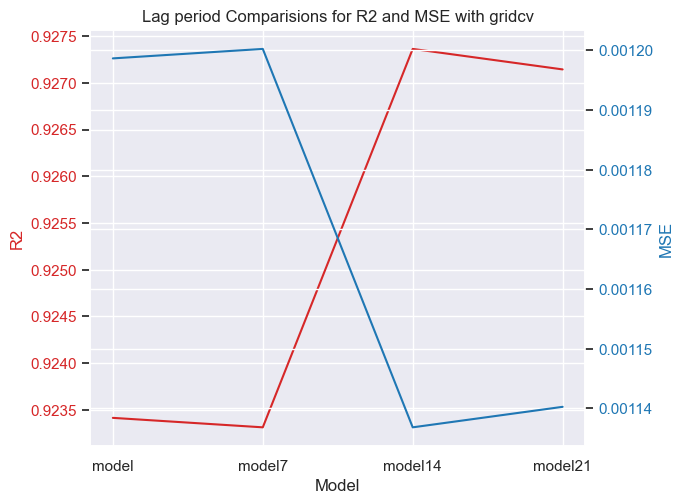

In [ ]:
models = list(model_dict.keys())
globalMR_r2 = [model_dict[model][2]['globalMR_lopo_r2'] for model in models]
globalMR_mse = [model_dict[model][2]['globalMR_lopo_mse'] for model in models]

fig, ax1 = plt.subplots(figsize=(7,5))

color = 'tab:red'
ax1.set_xlabel('Model')
ax1.set_ylabel('R2', color=color)
ax1.plot(models, globalMR_r2, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('MSE', color=color)
ax2.plot(models, globalMR_mse, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title('Lag period Comparisions for R2 and MSE with gridcv')
plt.show()

In [ ]:
model_dict

{'model': [       CountryCode       Date  Population  GDP_Per_Capita  Life_Expectancy  \
  0              AFG 2020-01-01  41128772.0        1803.987            64.83   
  198            AFG 2020-01-02  41128772.0        1803.987            64.83   
  386            AFG 2020-01-03  41128772.0        1803.987            64.83   
  518            AFG 2020-01-04  41128772.0        1803.987            64.83   
  714            AFG 2020-01-05  41128772.0        1803.987            64.83   
  ...            ...        ...         ...             ...              ...   
  163657         ZWE 2022-12-27  16320539.0        1899.775            61.49   
  163850         ZWE 2022-12-28  16320539.0        1899.775            61.49   
  163984         ZWE 2022-12-29  16320539.0        1899.775            61.49   
  164246         ZWE 2022-12-30  16320539.0        1899.775            61.49   
  164399         ZWE 2022-12-31  16320539.0        1899.775            61.49   
  
          Hospital_Beds_Per_

### Classification Model

In [50]:
exp = []

In [149]:
policyEffective = df_WithLag_encoded[modelCols + ['changeInMR']]

policyEffective['Date'] = pd.to_datetime(policyEffective['Date'])

policyEffective['year'] = policyEffective['Date'].dt.year
policyEffective['month'] = policyEffective['Date'].dt.month
policyEffective['day'] = policyEffective['Date'].dt.day


In [150]:
policyEffective['changeInMR'].dtype

dtype('float64')

##### Filling in 0 for first entry for every country column of Change in daily deaths as the change will be 0

In [151]:
policyEffective['changeinDailyDeaths'] = policyEffective.groupby('CountryCode')['changeInMR'].diff().fillna(0)

In [152]:
print(policyEffective.columns)

Index(['CountryCode', 'Date', 'ConfirmedCases', 'Population', 'GDP_Per_Capita',
       'Life_Expectancy', 'Hospital_Beds_Per_Thousand', 'ChangeCC_7dayMA',
       'ChangeMR_14dayMA', 'CountryCode_0', 'CountryCode_1', 'CountryCode_2',
       'CountryCode_3', 'CountryCode_4', 'CountryCode_5', 'CountryCode_6',
       'CountryCode_7', 'MajorityVaccinated', 'StringencyIndex_Average',
       'GovernmentResponseIndex_Average', 'ContainmentHealthIndex_Average',
       'EconomicSupportIndex', 'H5', 'V1', 'V3', 'changeInMR', 'year', 'month',
       'day', 'changeinDailyDeaths'],
      dtype='object')


In [55]:
policyEffective[policyEffective['CountryCode'] == 'IND']['changeinDailyDeaths']

76        0.000000e+00
150       0.000000e+00
413       0.000000e+00
573       0.000000e+00
748       0.000000e+00
              ...     
163705   -7.056301e-07
163853    1.411260e-06
164087   -7.056301e-07
164100    1.411260e-06
164277    1.110223e-16
Name: changeinDailyDeaths, Length: 1096, dtype: float64

In [153]:
conditions = [
    policyEffective['changeinDailyDeaths'] > 0,
    policyEffective['changeinDailyDeaths'] <= 0,
]

choices = [0, 1]

policyEffective['EncodedEffectiveness'] = np.select(conditions, choices)

In [57]:
policyEffective[policyEffective['CountryCode'] == 'IND']['EncodedEffectiveness']

76        1
150       1
413       1
573       1
748       1
         ..
163705    1
163853    0
164087    1
164100    0
164277    0
Name: EncodedEffectiveness, Length: 1096, dtype: int64

[]

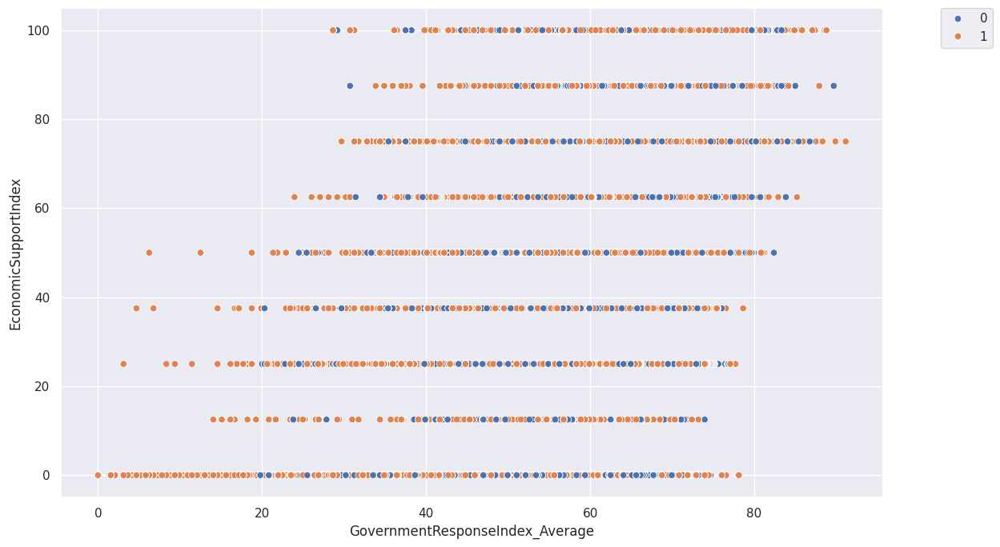

In [58]:
plt.figure(figsize=(15,7))
sns.scatterplot(data=policyEffective, x="GovernmentResponseIndex_Average",  y="EconomicSupportIndex", hue="EncodedEffectiveness")
plt.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.plot()

[]

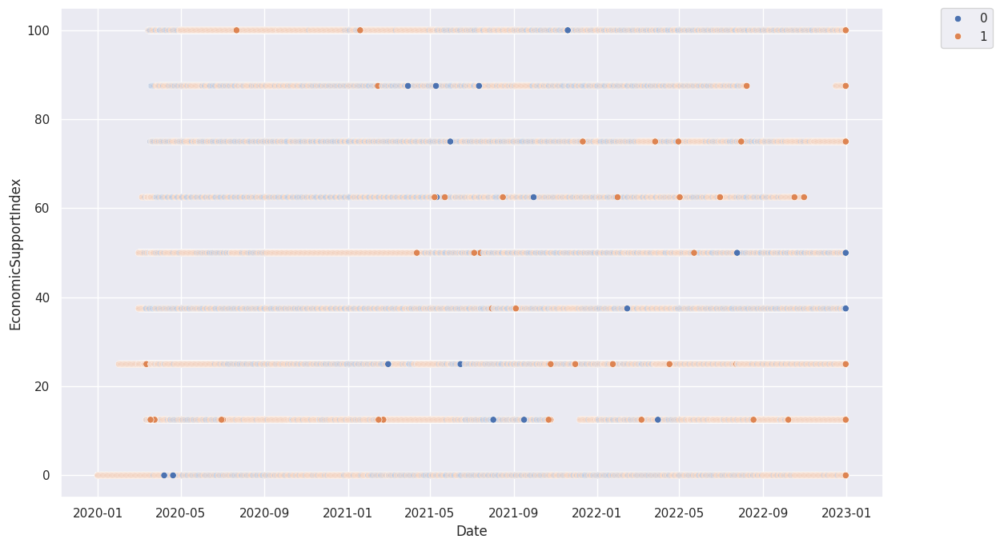

In [59]:
plt.figure(figsize=(15,7))
sns.scatterplot(data=policyEffective, x="Date",  y="EconomicSupportIndex", hue="EncodedEffectiveness")
plt.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.plot()

[]

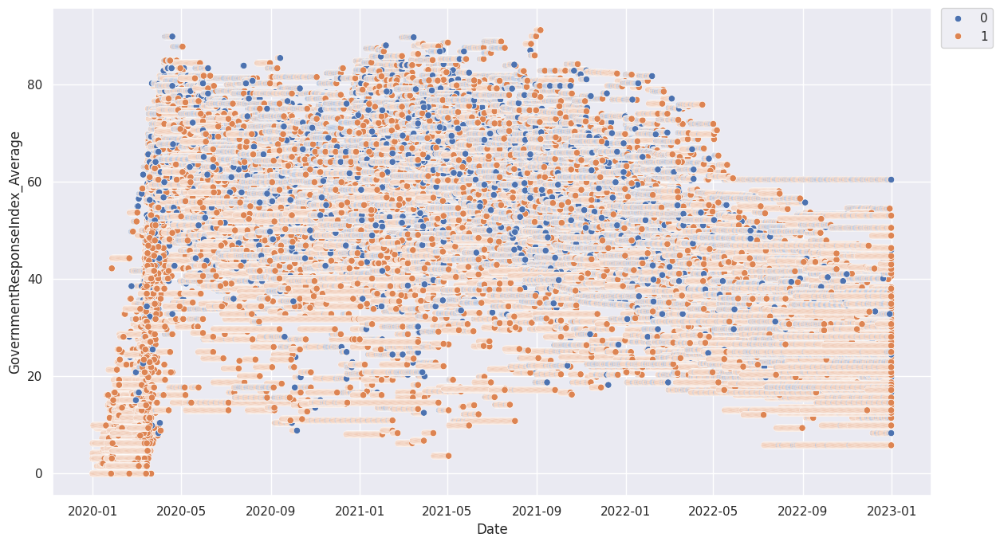

In [60]:
plt.figure(figsize=(15,7))
sns.scatterplot(data=policyEffective, x="Date",  y="GovernmentResponseIndex_Average", hue="EncodedEffectiveness")
plt.legend(loc='upper right', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.plot()

In [61]:
policyEffective.isna().sum()

CountryCode                        0
Date                               0
ConfirmedCases                     0
Population                         0
GDP_Per_Capita                     0
Life_Expectancy                    0
Hospital_Beds_Per_Thousand         0
ChangeCC_7dayMA                    0
ChangeMR_14dayMA                   0
CountryCode_0                      0
CountryCode_1                      0
CountryCode_2                      0
CountryCode_3                      0
CountryCode_4                      0
CountryCode_5                      0
CountryCode_6                      0
CountryCode_7                      0
MajorityVaccinated                 0
StringencyIndex_Average            0
GovernmentResponseIndex_Average    0
ContainmentHealthIndex_Average     0
EconomicSupportIndex               0
H5                                 0
V1                                 0
V3                                 0
changeInMR                         0
year                               0
m

In [62]:
policyEffective.info()

<class 'pandas.core.frame.DataFrame'>
Index: 163304 entries, 0 to 164399
Data columns (total 31 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   CountryCode                      163304 non-null  object        
 1   Date                             163304 non-null  datetime64[ns]
 2   ConfirmedCases                   163304 non-null  float64       
 3   Population                       163304 non-null  float64       
 4   GDP_Per_Capita                   163304 non-null  float64       
 5   Life_Expectancy                  163304 non-null  float64       
 6   Hospital_Beds_Per_Thousand       163304 non-null  float64       
 7   ChangeCC_7dayMA                  163304 non-null  float64       
 8   ChangeMR_14dayMA                 163304 non-null  float64       
 9   CountryCode_0                    163304 non-null  int64         
 10  CountryCode_1                    163304 non-null 

In [154]:
policyEffective['EncodedEffectiveness'].value_counts()

EncodedEffectiveness
1    118334
0     44970
Name: count, dtype: int64

In [155]:
X = policyEffective.drop(['EncodedEffectiveness','CountryCode','Date','ChangeCC_7dayMA',
                        'ChangeMR_14dayMA', 'ConfirmedCases', 'changeInMR','changeinDailyDeaths'], axis=1)
y = policyEffective['EncodedEffectiveness']

#### Tree size vs Accuracy

In [156]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y, shuffle=True)

f1_scores1 = []
f1_scores2 = []
accuracy_ = []
exp  = []

for depth in range(1, 50):
    clf = DecisionTreeClassifier(max_depth=depth, random_state=42)
    clf.fit(X_train, y_train)
    y_train_pred = clf.predict(X_train)
    f1Train = f1_score(y_train, y_train_pred, average='weighted')
    f1_scores1.append(f1Train)
    y_test_pred = clf.predict(X_test)
    f1score = f1_score(y_test, y_test_pred, average='weighted')
    f1_scores2.append(f1score)
    accuracy = accuracy_score(y_test,y_test_pred)
    accuracy_.append(accuracy)
    exp.append({
        'Dataset' : 'Updated_Base_',
        'Tree Size': depth,
        'WeightedF1': f1score,
        'Accuracy': accuracy
    })

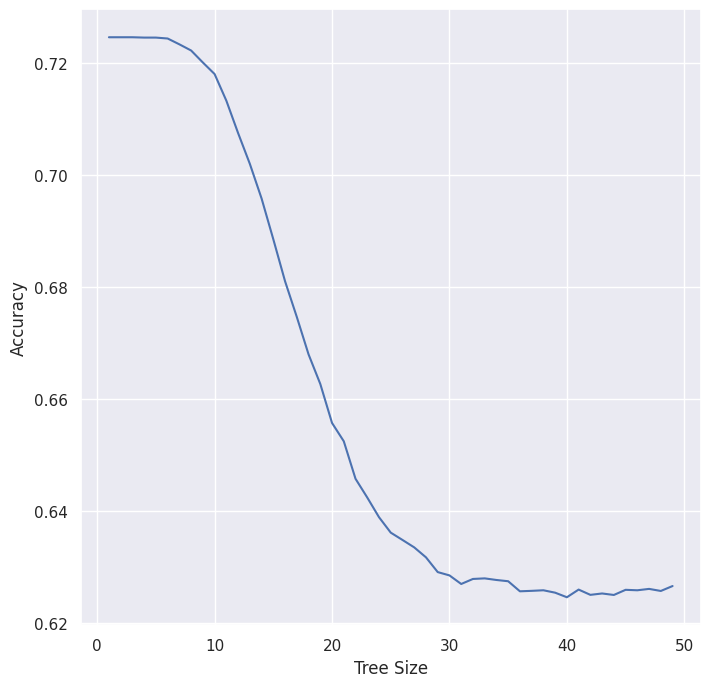

In [157]:
classResults = pd.DataFrame(exp)
plt.figure(figsize=(8,8))
sns.lineplot(data=classResults, x='Tree Size', y='Accuracy')
plt.show()

In [158]:
max(f1_scores2)

0.654070574321925

#### Weighted F1 scores with tree depth

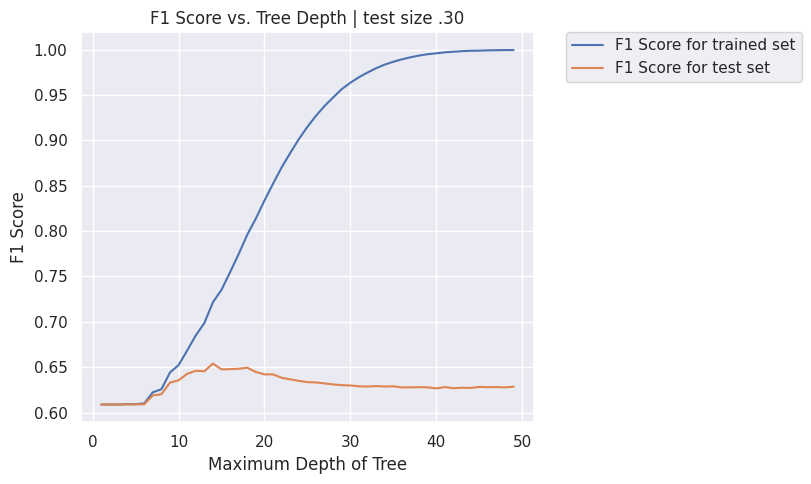

In [160]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, 50), f1_scores1, label='F1 Score for trained set')
plt.plot(range(1, 50), f1_scores2, label='F1 Score for test set')
plt.xlabel('Maximum Depth of Tree')
plt.ylabel('F1 Score')
plt.title('F1 Score vs. Tree Depth | test size .30')
plt.legend(loc='upper left', bbox_to_anchor=(1.07, 1), borderaxespad=0.)
plt.tight_layout(rect=[0, 0, 0.85, 1])
plt.grid(True)
plt.show()

In [161]:
maxTree = np.argmax(f1_scores2)
maxTree

13

In [162]:
model = DecisionTreeClassifier()
parameters = {'max_depth': [13], 'min_samples_leaf': [2,4,8,16,32,64]}
grid_search = GridSearchCV(model, parameters, scoring='f1_weighted', cv=5)

grid_search.fit(X, y)

results = pd.DataFrame(grid_search.cv_results_)
results = results[['param_max_depth', 'param_min_samples_leaf', 'mean_test_score']]
pd.set_option('display.precision', 10)
print(results)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
y_scores = best_model.predict_proba(X_test)[:, 1]

  param_max_depth param_min_samples_leaf  mean_test_score
0              13                      2     0.6108529017
1              13                      4     0.6137297360
2              13                      8     0.6142559535
3              13                     16     0.6168856718
4              13                     32     0.6203774109
5              13                     64     0.6151765912


In [163]:
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
print(f"F1 Score: {f1}, Precision: {precision}, Recall: {recall}")

F1 Score: 0.6874438362483438, Precision: 0.6975663973571417, Recall: 0.733874918354017


In [164]:
len(exp)

49

In [165]:
exp.append({
        'Dataset' : 'Updated_Base_GS_Fin',
        'WeightedF1': f1,
        'Precision': precision,
        'Recall': recall
    })

In [166]:
classResults = pd.DataFrame(exp)

<Figure size 800x600 with 0 Axes>

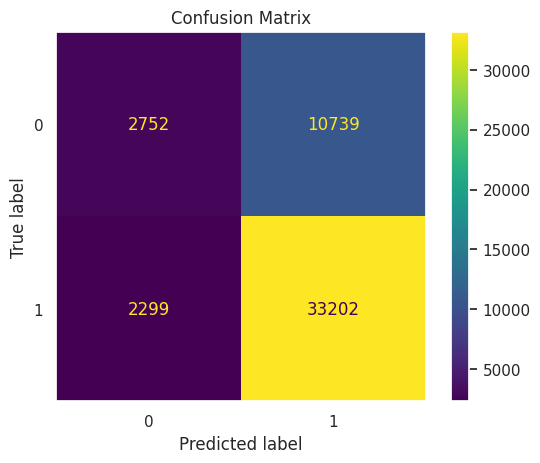

In [167]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.viridis)
plt.title('Confusion Matrix')
plt.grid(False)
plt.show()

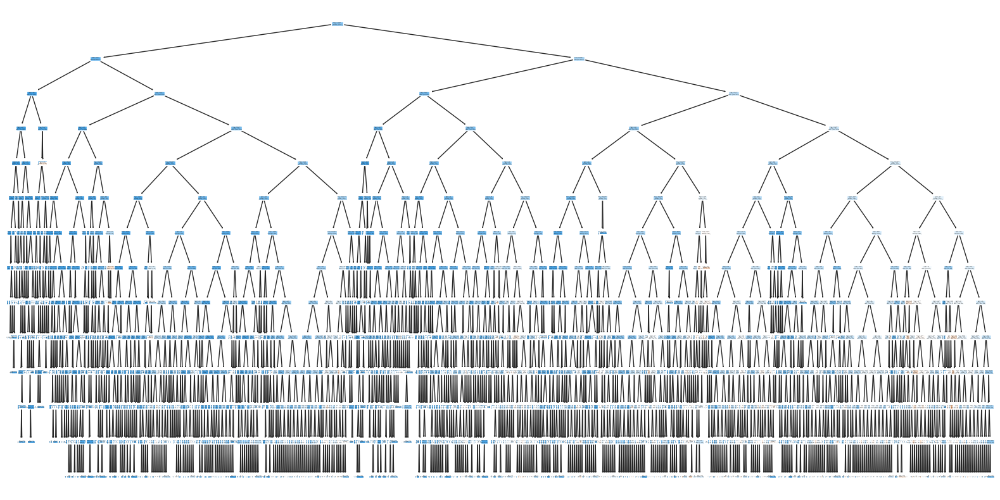

In [168]:
plt.figure(figsize=(20,10))
plot_tree(best_model, filled=True)
plt.show()

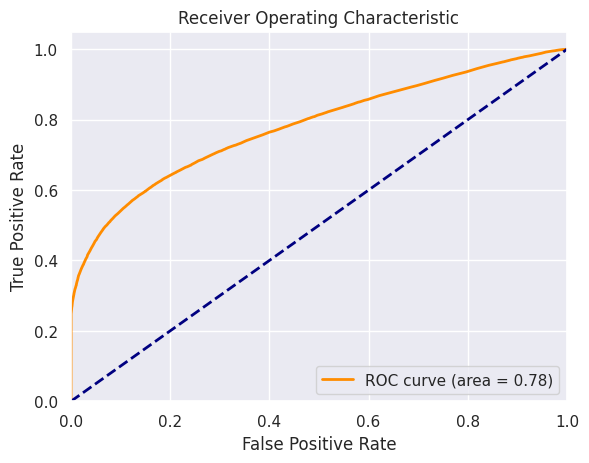

In [170]:
fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

#### SMOT

In [174]:
from imblearn.over_sampling import SMOTE
from collections import Counter

In [175]:
policyEffective21 = df_WithLag_encoded[modelCols21 + ['changeInMR']]

policyEffective21['Date'] = pd.to_datetime(policyEffective21['Date'])

policyEffective21['year'] = policyEffective21['Date'].dt.year
policyEffective21['month'] = policyEffective21['Date'].dt.month
policyEffective21['day'] = policyEffective21['Date'].dt.day

In [176]:
policyEffective21['changeinDailyDeaths'] = policyEffective21.groupby('CountryCode')['changeInMR'].diff().fillna(0)

In [177]:
conditions = [
    policyEffective21['changeinDailyDeaths'] > 0,
    policyEffective21['changeinDailyDeaths'] <= 0,
]

choices = [0, 1]

policyEffective21['EncodedEffectiveness'] = np.select(conditions, choices)

In [178]:
X = policyEffective21.drop(['EncodedEffectiveness','CountryCode','Date','ChangeCC_7dayMA',
                        'ChangeMR_14dayMA', 'ConfirmedCases', 'changeInMR','changeinDailyDeaths'], axis=1)
y = policyEffective21['EncodedEffectiveness']

oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [179]:
counter = Counter(y)
for key,value in counter.items():
  perc = value / len(y) * 100
  print((key, value, perc))

(1, 118334, 50.0)
(0, 118334, 50.0)


In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

f1_scores1 = []
f1_scores2 = []
accuracy_ = []

for depth in range(1, 50):
    clf = DecisionTreeClassifier(max_depth=depth, random_state=42)
    clf.fit(X_train, y_train)
    y_train_pred = clf.predict(X_train)
    f1Train = f1_score(y_train, y_train_pred, average='weighted')
    f1_scores1.append(f1Train)
    y_test_pred = clf.predict(X_test)
    f1score = f1_score(y_test, y_test_pred, average='weighted')
    f1_scores2.append(f1score)
    accuracy = accuracy_score(y_test,y_test_pred)
    accuracy_.append(accuracy)
    exp.append({
        'Dataset' : 'Updated_21D_',
        'Tree Size': depth,
        'WeightedF1': f1score,
        'Accuracy': accuracy
    })

In [182]:
classResults = pd.DataFrame(exp)

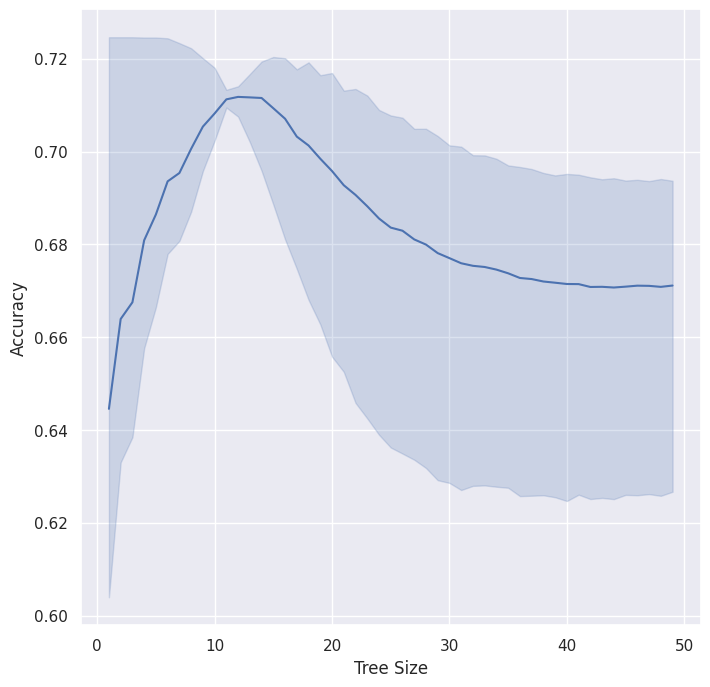

In [183]:
plt.figure(figsize=(8,8))
sns.lineplot(data=classResults, x='Tree Size', y='Accuracy')
plt.show()

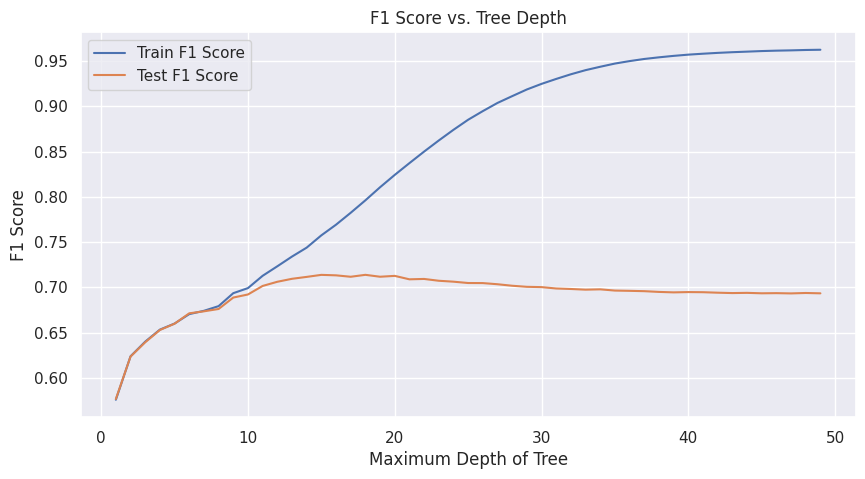

In [184]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, 50), f1_scores1, label='Train F1 Score')
plt.plot(range(1, 50), f1_scores2, label='Test F1 Score')
plt.xlabel('Maximum Depth of Tree')
plt.ylabel('F1 Score')
plt.title('F1 Score vs. Tree Depth')
plt.legend()
plt.grid(True)
plt.show()

In [185]:
axTree = np.argmax(f1_scores2)
maxTree

13

In [186]:
model = DecisionTreeClassifier()
parameters = {'max_depth': [13], 'min_samples_leaf': [2,4,8,16,32,64]}
grid_search = GridSearchCV(model, parameters, scoring='f1_weighted', cv=5)

grid_search.fit(X, y)

results = pd.DataFrame(grid_search.cv_results_)
results = results[['param_max_depth', 'param_min_samples_leaf', 'mean_test_score']]
print(results)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
y_scores = best_model.predict_proba(X_test)[:, 1]




  param_max_depth param_min_samples_leaf  mean_test_score
0              13                      2     0.3857430520
1              13                      4     0.3906188185
2              13                      8     0.3913758065
3              13                     16     0.3940169164
4              13                     32     0.3986455050
5              13                     64     0.4040269004


In [187]:
f1 = f1_score(y_test, y_pred, average='weighted')
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
print(f"F1 Score: {f1}, Precision: {precision}, Recall: {recall}")

F1 Score: 0.7152737209142526, Precision: 0.7428495995099996, Recall: 0.7215250489429726


In [188]:
exp.append({
    'Dataset' : '21D_SMOTE_CV',
    'WeightedF1': f1,
    'Precision': precision,
    'Recall': recall
})

In [189]:
fImp = best_model.feature_importances_

feature_importances_df = pd.DataFrame({
    'Attribute': X.columns,
    'Imp': fImp
}).sort_values(by='Imp', ascending=False)

print(feature_importances_df)

                                Attribute           Imp
15   ContainmentHealthIndex_Average_Lag21  0.3343805171
0                              Population  0.1942710835
2                         Life_Expectancy  0.1142746051
21                                  month  0.0740000386
13          StringencyIndex_Average_Lag21  0.0446985972
14  GovernmentResponseIndex_Average_Lag21  0.0378680890
1                          GDP_Per_Capita  0.0336109826
3              Hospital_Beds_Per_Thousand  0.0326272895
20                                   year  0.0255238742
22                                    day  0.0180354833
18                               V1_Lag21  0.0161351912
16             EconomicSupportIndex_Lag21  0.0105671646
12               MajorityVaccinated_Lag21  0.0105351442
8                           CountryCode_4  0.0096380700
5                           CountryCode_1  0.0093722659
6                           CountryCode_2  0.0084318288
10                          CountryCode_6  0.007

<Figure size 800x600 with 0 Axes>

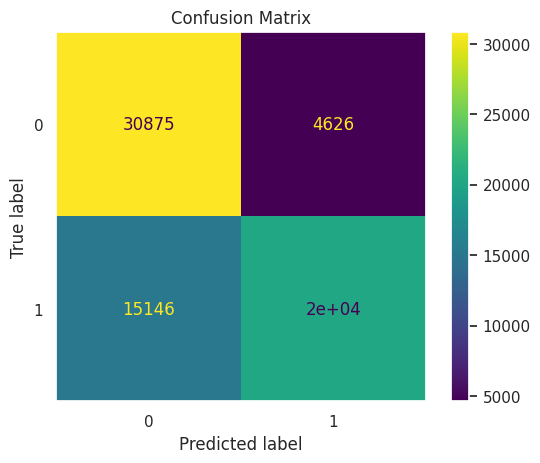

In [191]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.viridis)
plt.grid(False)
plt.title('Confusion Matrix')
plt.show()

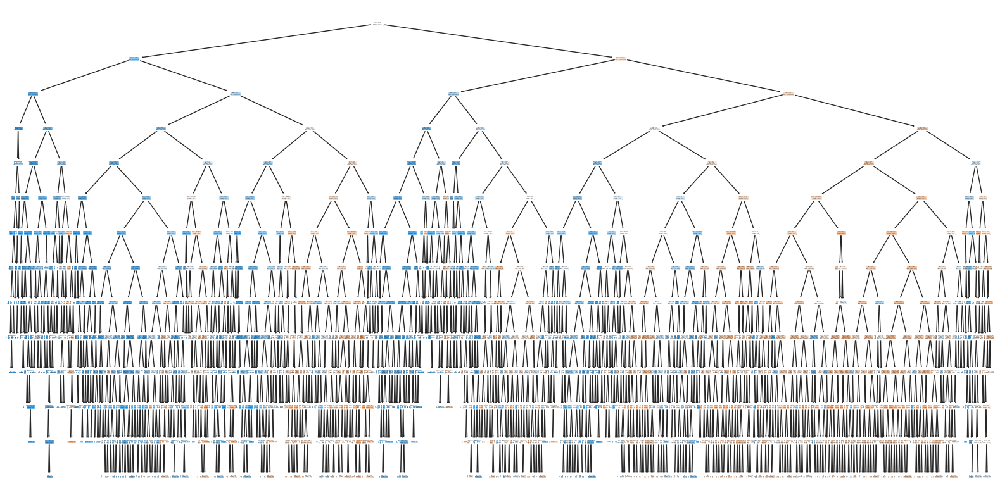

In [192]:
plt.figure(figsize=(20,10))
plot_tree(best_model, filled=True)
plt.show()

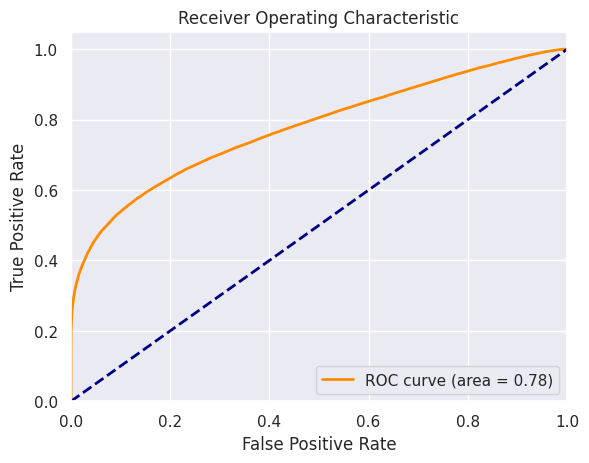

In [193]:
fpr, tpr, thresholds = roc_curve(y_test, y_scores)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [197]:
resultsFinal = pd.DataFrame(exp)
resultsFinal.to_csv('/content/drive/MyDrive/CIC/aiproject/classificationEP.csv')

In [208]:
best_model.classes_

array([0, 1])

In [200]:
shapExplainer = shap.TreeExplainer(best_model)
shapValues = shapExplainer.shap_values(X_test)

In [206]:
shapValues.shape

(71001, 23, 2)

In [207]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

for each label

In [210]:
meanSHAPForInEff = np.mean(shapValues[:, :, 0], axis=0)
meanSHAPForEff = np.mean(shapValues[:, :, 1], axis=0)
attributes = X_test.columns

dfMSI = pd.DataFrame(meanSHAPForInEff, index=attributes, columns=['SV'])
dfMSE = pd.DataFrame(meanSHAPForEff, index=attributes, columns=['SV'])

dfMSI = dfMSI.sort_values(by='SV', ascending=False)
dfMSE = dfMSE.sort_values(by='SV', ascending=False)


In [211]:
dfMSI

,SV
Life_Expectancy,0.0129640952
month,0.0015634779
year,0.0013270561
CountryCode_7,0.0011136067
CountryCode_2,0.0010643918
V3_Lag21,0.0009161456
CountryCode_4,0.0006936562
CountryCode_5,0.0004183979
CountryCode_6,0.0004150067
CountryCode_0,0.0003486806


([<matplotlib.axis.XTick at 0x7affd377a830>,
 [Text(0, 0, 'Life_Expectancy'),
  Text(1, 0, 'month'),
  Text(2, 0, 'year'),
  Text(3, 0, 'CountryCode_7'),
  Text(4, 0, 'CountryCode_2'),
  Text(5, 0, 'V3_Lag21'),
  Text(6, 0, 'CountryCode_4'),
  Text(7, 0, 'CountryCode_5'),
  Text(8, 0, 'CountryCode_6'),
  Text(9, 0, 'CountryCode_0'),
  Text(10, 0, 'ContainmentHealthIndex_Average_Lag21'),
  Text(11, 0, 'H5_Lag21'),
  Text(12, 0, 'MajorityVaccinated_Lag21'),
  Text(13, 0, 'V1_Lag21'),
  Text(14, 0, 'CountryCode_3'),
  Text(15, 0, 'day'),
  Text(16, 0, 'StringencyIndex_Average_Lag21'),
  Text(17, 0, 'CountryCode_1'),
  Text(18, 0, 'Population'),
  Text(19, 0, 'GovernmentResponseIndex_Average_Lag21'),
  Text(20, 0, 'EconomicSupportIndex_Lag21'),
  Text(21, 0, 'Hospital_Beds_Per_Thousand'),
  Text(22, 0, 'GDP_Per_Capita')])

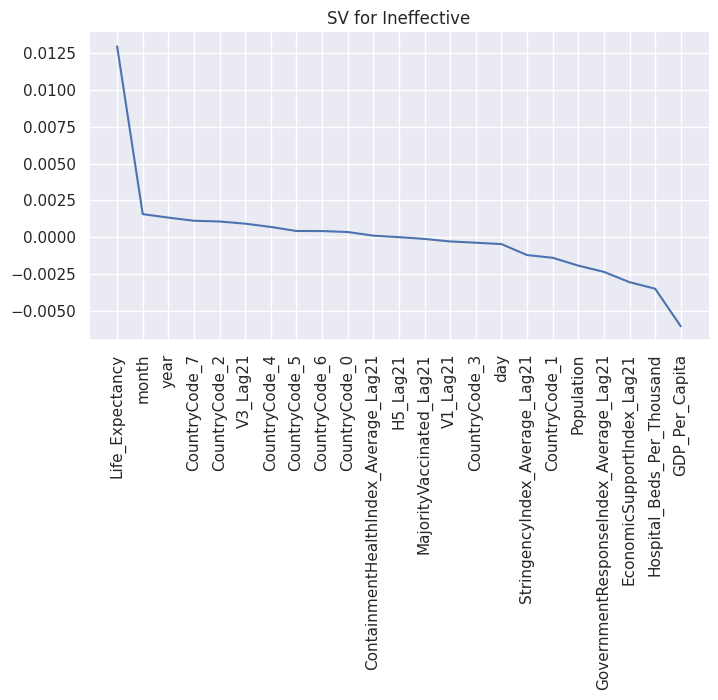

In [215]:
#made using colab
from matplotlib import pyplot as plt
dfMSI['SV'].plot(kind='line', figsize=(8, 4), title='SV for Ineffective')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(ticks=range(len(dfMSI.index)),labels=dfMSI.index,rotation=90)

([<matplotlib.axis.XTick at 0x7affd3dbd2d0>,
 [Text(0, 0, 'GDP_Per_Capita'),
  Text(1, 0, 'Hospital_Beds_Per_Thousand'),
  Text(2, 0, 'EconomicSupportIndex_Lag21'),
  Text(3, 0, 'GovernmentResponseIndex_Average_Lag21'),
  Text(4, 0, 'Population'),
  Text(5, 0, 'CountryCode_1'),
  Text(6, 0, 'StringencyIndex_Average_Lag21'),
  Text(7, 0, 'day'),
  Text(8, 0, 'CountryCode_3'),
  Text(9, 0, 'V1_Lag21'),
  Text(10, 0, 'MajorityVaccinated_Lag21'),
  Text(11, 0, 'H5_Lag21'),
  Text(12, 0, 'ContainmentHealthIndex_Average_Lag21'),
  Text(13, 0, 'CountryCode_0'),
  Text(14, 0, 'CountryCode_6'),
  Text(15, 0, 'CountryCode_5'),
  Text(16, 0, 'CountryCode_4'),
  Text(17, 0, 'V3_Lag21'),
  Text(18, 0, 'CountryCode_2'),
  Text(19, 0, 'CountryCode_7'),
  Text(20, 0, 'year'),
  Text(21, 0, 'month'),
  Text(22, 0, 'Life_Expectancy')])

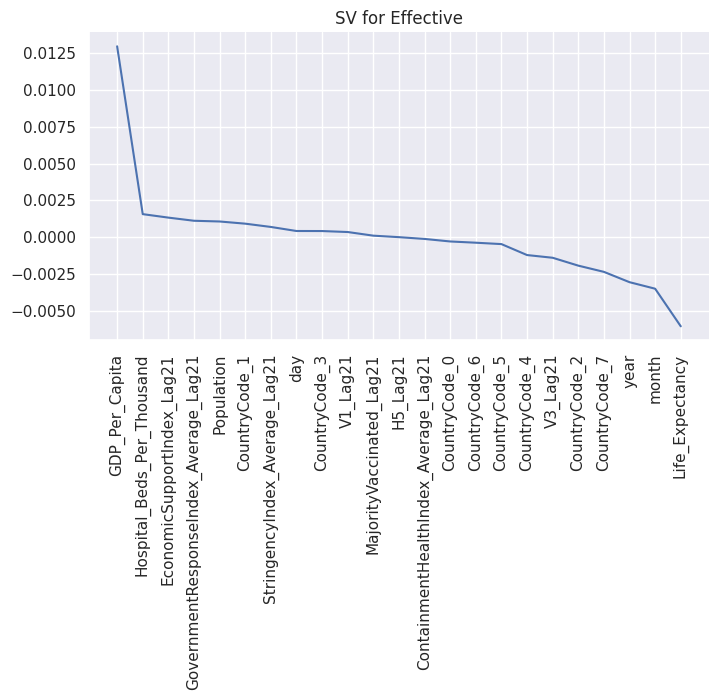

In [216]:
#made using colab
from matplotlib import pyplot as plt
dfMSI['SV'].plot(kind='line', figsize=(8, 4), title='SV for Effective')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.xticks(ticks=range(len(dfMSE.index)),labels=dfMSE.index,rotation=90)

In [196]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### PCA

In [ ]:
X = policyEffective.drop(['EncodedEffectiveness', 'CountryCode', 'Date'], axis=1)
y = policyEffective['EncodedEffectiveness']

In [ ]:
policyEffective.head()

,CountryCode,Date,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,ChangeCC_7dayMA,ChangeMR_14dayMA,CountryCode_0,CountryCode_1,CountryCode_2,CountryCode_3,CountryCode_4,CountryCode_5,CountryCode_6,CountryCode_7,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,H5,V1,V3,changeInMR,year,month,day,changeinDailyDeaths,EncodedEffectiveness
0,AFG,2020-01-01,41128772.0,1803.987,64.83,0.5,42704.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,1,0.0,1
198,AFG,2020-01-02,41128772.0,1803.987,64.83,0.5,42704.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,2,0.0,1
386,AFG,2020-01-03,41128772.0,1803.987,64.83,0.5,42704.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,3,0.0,1
518,AFG,2020-01-04,41128772.0,1803.987,64.83,0.5,42704.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,4,0.0,1
714,AFG,2020-01-05,41128772.0,1803.987,64.83,0.5,42704.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,5,0.0,1


In [ ]:
X['ChangeCC_7dayMA'] = policyEffective['ChangeCC_7dayMA'] + abs(policyEffective['ChangeCC_7dayMA'].min()) + 1

In [ ]:
X.head()

,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,ChangeCC_7dayMA,ChangeMR_14dayMA,CountryCode_0,CountryCode_1,CountryCode_2,CountryCode_3,CountryCode_4,CountryCode_5,CountryCode_6,CountryCode_7,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,H5,V1,V3,changeInMR,year,month,day,changeinDailyDeaths
0,41128772.0,1803.987,64.83,0.5,42706.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,1,0.0
198,41128772.0,1803.987,64.83,0.5,42706.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,2,0.0
386,41128772.0,1803.987,64.83,0.5,42706.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,3,0.0
518,41128772.0,1803.987,64.83,0.5,42706.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,4,0.0
714,41128772.0,1803.987,64.83,0.5,42706.0,0.0,0,0,0,0,0,0,0,1,0,0.0,0.0,0.0,0.0,0.0,0,0,0.0,2020,1,5,0.0


In [ ]:
X_Log = np.log1p(X + 1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
X_Log.head()

,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,ChangeCC_7dayMA,ChangeMR_14dayMA,CountryCode_0,CountryCode_1,CountryCode_2,CountryCode_3,CountryCode_4,CountryCode_5,CountryCode_6,CountryCode_7,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,H5,V1,V3,changeInMR,year,month,day,changeinDailyDeaths
0,17.532219,7.498863,4.202152,0.916291,10.662142,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,1.098612,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,7.611842,1.098612,1.098612,0.693147
198,17.532219,7.498863,4.202152,0.916291,10.662142,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,1.098612,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,7.611842,1.098612,1.386294,0.693147
386,17.532219,7.498863,4.202152,0.916291,10.662142,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,1.098612,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,7.611842,1.098612,1.609438,0.693147
518,17.532219,7.498863,4.202152,0.916291,10.662142,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,1.098612,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,7.611842,1.098612,1.791759,0.693147
714,17.532219,7.498863,4.202152,0.916291,10.662142,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,1.098612,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,0.693147,7.611842,1.098612,1.945910,0.693147


In [ ]:
X_Log.isna().sum()

Population                         0
GDP_Per_Capita                     0
Life_Expectancy                    0
Hospital_Beds_Per_Thousand         0
ChangeCC_7dayMA                    0
ChangeMR_14dayMA                   0
CountryCode_0                      0
CountryCode_1                      0
CountryCode_2                      0
CountryCode_3                      0
CountryCode_4                      0
CountryCode_5                      0
CountryCode_6                      0
CountryCode_7                      0
MajorityVaccinated                 0
StringencyIndex_Average            0
GovernmentResponseIndex_Average    0
ContainmentHealthIndex_Average     0
EconomicSupportIndex               0
H5                                 0
V1                                 0
V3                                 0
changeInMR                         0
year                               0
month                              0
day                                0
changeinDailyDeaths                0
d

In [ ]:
cov_mat = np.cov(X_scaled.T)

eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

print('\nEigenvalues \n%s' % eigen_vals)

tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

print('\nExplained Variance \n%s' % var_exp)
print('\nCumulative Explained Variance \n%s' % cum_var_exp)


Eigenvalues 
[4.23926657e+00 3.32812037e+00 2.49985904e+00 1.68982522e+00
 1.59445026e+00 1.36308672e+00 1.39079815e-03 3.67762557e-02
 4.70207745e-02 2.33788789e-01 1.46787492e-01 1.27139238e-01
 1.32925191e-01 3.70041886e-01 4.90080190e-01 5.42965606e-01
 5.65533030e-01 8.03299595e-01 1.08426625e+00 8.67607282e-01
 9.16636519e-01 8.90288061e-01 9.75197441e-01 9.92870968e-01
 9.99785380e-01 1.00930762e+00 1.05184880e+00]

Explained Variance 
[0.15700891144360948, 0.12326296258087013, 0.0925868047049127, 0.06258573591294, 0.059053351709523784, 0.05048438428758543, 0.04015776330882298, 0.038957124286608504, 0.03738153481706177, 0.037028861389963516, 0.03677277363693956, 0.036118202575353295, 0.03394929282342981, 0.032973429989884215, 0.032133406274380584, 0.029751654658842153, 0.020945539507451413, 0.02010971411125006, 0.018151006994636624, 0.013705171097708746, 0.00865879103232971, 0.005436540488843283, 0.004923125087016905, 0.00470883184724475, 0.0017414995015633602, 0.00136207520398

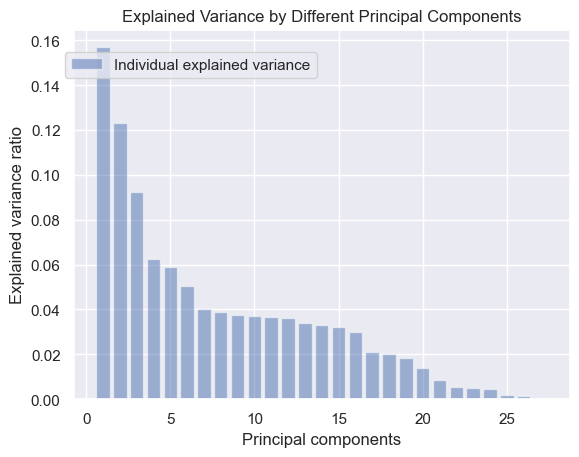

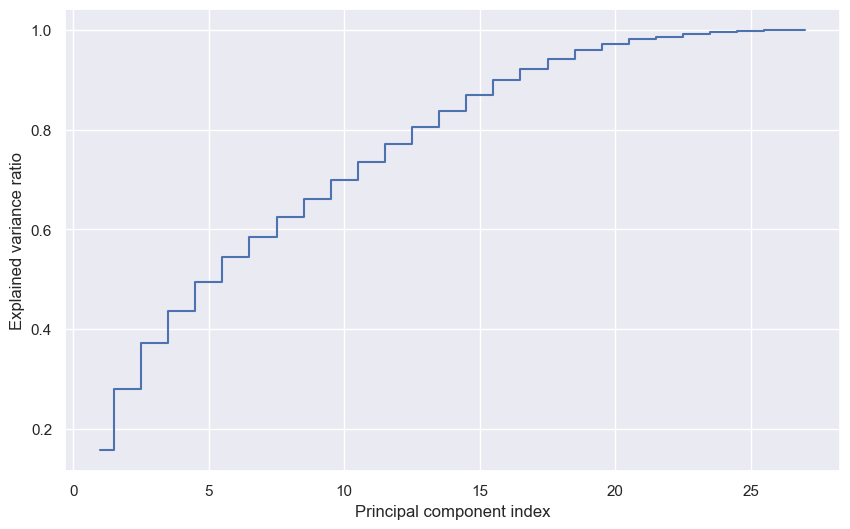

In [ ]:
n_components = len(var_exp)

fig, ax1 = plt.subplots()

ax1.bar(range(1, n_components + 1), var_exp, alpha=0.5, align='center', label='Individual explained variance')
ax1.set_ylabel('Explained variance ratio')
ax1.set_xlabel('Principal components')
ax1.set_title('Explained Variance by Different Principal Components')
fig.legend(loc='upper left', bbox_to_anchor=(0.1,0.85))

plt.figure(figsize=(10, 6))
plt.step(range(1, len(cum_var_exp) + 1), cum_var_exp, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')

plt.show()

Text(0.5, 0, 'Principal component index')

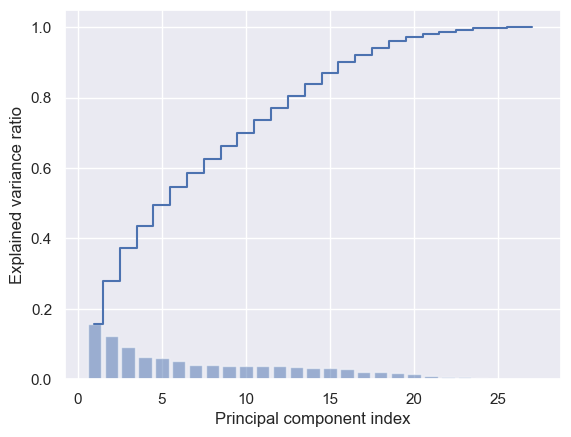

In [ ]:
plt.bar(range(1, len(var_exp) + 1), var_exp, alpha=0.5, align='center',
        label='Individual explained variance')
plt.step(range(1, len(cum_var_exp) + 1), cum_var_exp, where='mid',
         label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')

In [ ]:
X_scaled

array([[ 7.89491795e-01, -1.55809365e+00, -1.32599099e+00, ...,
        -2.02423652e+00, -2.51959362e+00,  1.04226021e-03],
       [ 7.89491795e-01, -1.55809365e+00, -1.32599099e+00, ...,
        -2.02423652e+00, -2.06903799e+00,  1.04226021e-03],
       [ 7.89491795e-01, -1.55809365e+00, -1.32599099e+00, ...,
        -2.02423652e+00, -1.71955989e+00,  1.04226021e-03],
       ...,
       [ 2.87147771e-01, -1.51486714e+00, -1.88315288e+00, ...,
         1.27251451e+00,  1.13797290e+00,  1.04226021e-03],
       [ 2.87147771e-01, -1.51486714e+00, -1.88315288e+00, ...,
         1.27251451e+00,  1.18769638e+00,  1.04226021e-03],
       [ 2.87147771e-01, -1.51486714e+00, -1.88315288e+00, ...,
         1.27251451e+00,  1.23588967e+00,  1.04226021e-03]])

In [ ]:
n_components = X.shape[1]
explained_variances = []
cumulative_variances = []

for n in range(1, n_components + 1):
    pca = PCA(n_components=n)
    pca.fit(X_scaled)
    explained_variance = np.sum(pca.explained_variance_ratio_)
    explained_variances.append(pca.explained_variance_ratio_)
    cumulative_variances.append(explained_variance)

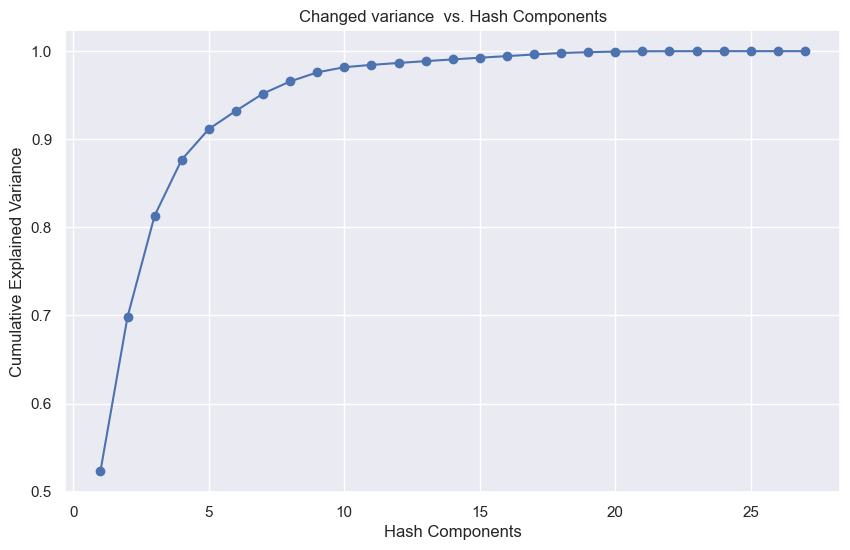

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, n_components + 1), cumulative_variances, marker='o')
plt.xlabel('# Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Changed variance  vs. # Components')
plt.grid(True)
plt.show()

In [ ]:
iteration_scores = {}

In [ ]:
column_min = policyEffective['ChangeCC_7dayMA'].min()
scaler = MinMaxScaler()
X = policyEffective.drop(['CountryCode', 'Date'], axis=1)
scaler.fit(X)

MinMaxScaler()

In [ ]:
scaler_t = scaler.transform(X)
scaler_t = pd.DataFrame(scaler_t, columns=X.columns)



#### PCA with grid search cv

In [ ]:
X = scaler_t.drop(['EncodedEffectiveness'], axis=1)
y = policyEffective['EncodedEffectiveness']

In [ ]:
def log_transform(X):
    return np.log1p(X + 1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


pipeline = Pipeline([
    ('log_transform', FunctionTransformer(log_transform, validate=False)),
    ('poly', PolynomialFeatures(degree=2)),
    ('scaler', StandardScaler()),
    ('pca', PCA(n_components=4)),
    ('elastic_net', ElasticNet())
])

param_grid = {
    'elastic_net__alpha': [0.01, 0.1, 1, 10],
    'elastic_net__l1_ratio': [0.1, 0.5, 0.9]
}

In [ ]:
X_train.head()

,Population,GDP_Per_Capita,Life_Expectancy,Hospital_Beds_Per_Thousand,ChangeCC_7dayMA,ChangeMR_14dayMA,CountryCode_0,CountryCode_1,CountryCode_2,CountryCode_3,CountryCode_4,CountryCode_5,CountryCode_6,CountryCode_7,MajorityVaccinated,StringencyIndex_Average,GovernmentResponseIndex_Average,ContainmentHealthIndex_Average,EconomicSupportIndex,H5,V1,V3,changeInMR,year,month,day,changeinDailyDeaths
17134,0.002258,0.095057,0.761123,0.262548,0.050967,0.304099,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.4444,0.500494,0.481541,0.50,4.444444e-12,1.0,1.0,0.115028,0.5,0.909091,0.800000,0.495620
148244,0.008695,0.087621,0.739034,0.169884,0.051995,0.122304,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.5463,0.548546,0.496843,0.75,4.444444e-12,0.0,0.0,0.105407,0.0,0.818182,0.333333,0.499730
73238,0.000239,0.394083,0.937520,0.216988,0.050492,0.092465,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.1111,0.251454,0.203852,0.50,4.444444e-12,1.0,1.0,0.102671,1.0,0.454545,0.666667,0.501469
124930,0.001878,1.000000,0.850426,0.084942,0.050646,0.092465,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.1111,0.274273,0.305725,0.00,4.444444e-12,1.0,1.0,0.102671,1.0,1.000000,0.566667,0.501469
143408,0.050569,0.134307,0.753234,0.154440,0.052915,0.098562,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.2407,0.302798,0.337614,0.00,4.444444e-12,1.0,1.0,0.103035,1.0,0.545455,0.533333,0.501217


In [ ]:
grid_search = GridSearchCV(pipeline, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)


grid_search.fit(X_train, y_train)


best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_


print("Best Parameters:")
print(best_params)

print("\nBest Estimator:")
print(best_estimator)


for i, score in enumerate(grid_search.cv_results_['mean_test_score']):
    iteration_scores[i] = score

print("Iteration Scores:")
print(iteration_scores)

Best Parameters:
{'elastic_net__alpha': 0.01, 'elastic_net__l1_ratio': 0.1}

Best Estimator:
Pipeline(steps=[('log_transform',
                 FunctionTransformer(func=<function log_transform at 0x35b9e89a0>)),
                ('poly', PolynomialFeatures()), ('scaler', StandardScaler()),
                ('pca', PCA(n_components=4)),
                ('elastic_net', ElasticNet(alpha=0.01, l1_ratio=0.1))])
Iteration Scores:
{0: 0.07333497198759616, 1: 0.07331972224615124, 2: 0.07329621471691442, 3: 0.07327728123096473, 4: 0.07204229150186285, 5: 0.06918856673499889, 6: 0.06788444662094369, 7: 0.033205853794866604, 8: -1.8909153804003155e-05, 9: -1.8909153804003155e-05, 10: -1.8909153804003155e-05, 11: -1.8909153804003155e-05}


In [ ]:
y_pred_test = best_estimator.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)

print("mse: ", mse_test)
print("R2: ", r2_test)

mse:  0.18401639345288445
R2:  0.06708202067021196


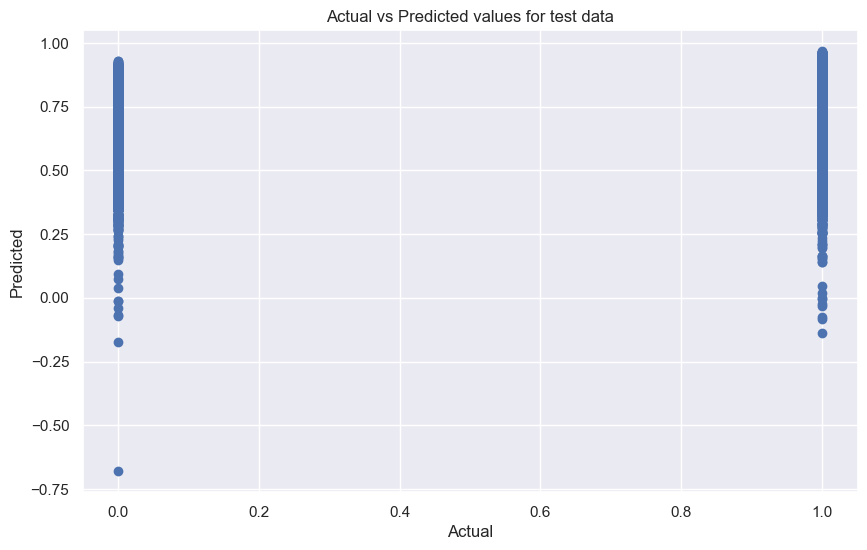

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted values for test data')
plt.grid(True)
plt.show()

In [ ]:
dict1 = model_dict['model21'][2]

In [ ]:
dict1

{'globalMR_r2': 0.6915708090641737,
 'globalMR_mse': 0.004725140313464644,
 'globalMR_rmse': 0.06873965604703478,
 'globalMR_ENGS_r2': {'alpha(1e-05)__l1Ratio(0.1': 0.6915694293903878,
  'alpha(1e-05)__l1Ratio(0.1_2000': 0.6915705443658691},
 'globalMR_ENGS_mse': {'alpha(1e-05)__l1Ratio(0.1': 0.004725161450089894,
  'alpha(1e-05)__l1Ratio(0.1_2000': 0.004725144368647054},
 'globalMR_ENGS_rmse': {'alpha(1e-05)__l1Ratio(0.1': 0.06873980979090569,
  'alpha(1e-05)__l1Ratio(0.1_2000': 0.06873968554370215},
 'globalMR_poly2_r2': 0.6915708090641737,
 'globalMR_poly2_mse': 0.004725140313464644,
 'globalMR_poly2_rmse': 0.06873965604703478,
 'globalMR_poly3_r2': 0.6915708090641737,
 'globalMR_poly3_mse': 0.004725140313464644,
 'globalMR_poly3_rmse': 0.06873965604703478,
 'globalMR_poly4_r2': 0.6915708090641737,
 'globalMR_poly4_mse': 0.004725140313464644,
 'globalMR_poly4_rmse': 0.06873965604703478,
 'globalMR_poly5_r2': 0.6915708090641737,
 'globalMR_poly5_mse': 0.004725140313464644,
 'globalMR

In [ ]:
final_df_model21 = pd.json_normalize(model_dict['model21'])

In [ ]:
final_df_model

,globalMR_r2,globalMR_mse,globalMR_rmse,globalMR_log_r2,globalMR_log_mse,globalMR_log_rmse,globalMR_logT_r2,globalMR_logT_mse,globalMR_logT_rmse,globalMR_lopo_r2,globalMR_lopo_mse,globalMR_lopo_rmse,globalMR_ENGS_r2.alpha(1e-06)__l1Ratio(1.0,globalMR_ENGS_r2.alpha(1e-06)__l1Ratio(1.0_2000,globalMR_ENGS_r2.alpha(5e-06)__l1Ratio(0.7_2000,globalMR_ENGS_mse.alpha(1e-06)__l1Ratio(1.0,globalMR_ENGS_mse.alpha(1e-06)__l1Ratio(1.0_2000,globalMR_ENGS_mse.alpha(5e-06)__l1Ratio(0.7_2000,globalMR_ENGS_rmse.alpha(1e-06)__l1Ratio(1.0,globalMR_ENGS_rmse.alpha(1e-06)__l1Ratio(1.0_2000,globalMR_ENGS_rmse.alpha(5e-06)__l1Ratio(0.7_2000
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.687807,0.004783,0.069158,0.825316,0.002711,0.033768,0.976874,0.000362,0.033768,0.922883,0.001207,0.034741,0.687912,0.687866,0.68802,0.004781,0.004782,0.00478,0.069146,0.069151,0.069134


In [ ]:
final_df_model7

,globalMR_r2,globalMR_mse,globalMR_rmse,globalMR_log_r2,globalMR_log_mse,globalMR_log_rmse,globalMR_logT_r2,globalMR_logT_mse,globalMR_logT_rmse,globalMR_lopo_r2,globalMR_lopo_mse,globalMR_lopo_rmse,globalMR_lopo_r2_5e-06,globalMR_lopo_mse_5e-06,globalMR_lopo_rmse_5e-06,globalMR_ENGS_r2.alpha(1e-06)__l1Ratio(0.1,globalMR_ENGS_r2.alpha(1e-06)__l1Ratio(0.1_2000,globalMR_ENGS_mse.alpha(1e-06)__l1Ratio(0.1,globalMR_ENGS_mse.alpha(1e-06)__l1Ratio(0.1_2000,globalMR_ENGS_rmse.alpha(1e-06)__l1Ratio(0.1,globalMR_ENGS_rmse.alpha(1e-06)__l1Ratio(0.1_2000
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.683947,0.004842,0.069584,0.806529,0.003003,0.078183,0.97456,0.000398,0.06874,0.923313,0.0012,0.034644,0.917527,0.001291,0.035927,0.683993,0.683954,0.004841,0.004842,0.069579,0.069583


In [ ]:
final_df_model14

,globalMR_r2,globalMR_mse,globalMR_rmse,globalMR_log_r2,globalMR_log_mse,globalMR_log_rmse,globalMR_logT_r2,globalMR_logT_mse,globalMR_logT_rmse,globalMR_lopo_r2,globalMR_lopo_mse,globalMR_lopo_rmse,globalMR_ENGS_r2.alpha(1e-06)__l1Ratio(0.1,globalMR_ENGS_r2.alpha(1e-06)__l1Ratio(0.1_2000,globalMR_ENGS_mse.alpha(1e-06)__l1Ratio(0.1,globalMR_ENGS_mse.alpha(1e-06)__l1Ratio(0.1_2000,globalMR_ENGS_rmse.alpha(1e-06)__l1Ratio(0.1,globalMR_ENGS_rmse.alpha(1e-06)__l1Ratio(0.1_2000
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.688483,0.004772,0.069083,0.778005,0.003445,0.06874,0.976529,0.000367,0.06874,0.927363,0.001137,0.033717,0.688501,0.688487,0.004772,0.004772,0.069081,0.069082


In [ ]:
final_df_model21

,globalMR_r2,globalMR_mse,globalMR_rmse,globalMR_poly2_r2,globalMR_poly2_mse,globalMR_poly2_rmse,globalMR_poly3_r2,globalMR_poly3_mse,globalMR_poly3_rmse,globalMR_poly4_r2,globalMR_poly4_mse,globalMR_poly4_rmse,globalMR_poly5_r2,globalMR_poly5_mse,globalMR_poly5_rmse,globalMR_poly6_r2,globalMR_poly6_mse,globalMR_poly6_rmse,globalMR_poly7_r2,globalMR_poly7_mse,globalMR_poly7_rmse,globalMR_log_r2,globalMR_log_mse,globalMR_log_rmse,globalMR_logT_r2,globalMR_logT_mse,globalMR_logT_rmse,globalMR_lopo_r2,globalMR_lopo_mse,globalMR_lopo_rmse,globalMR_ENGS_r2.alpha(1e-05)__l1Ratio(0.1,globalMR_ENGS_r2.alpha(1e-05)__l1Ratio(0.1_2000,globalMR_ENGS_mse.alpha(1e-05)__l1Ratio(0.1,globalMR_ENGS_mse.alpha(1e-05)__l1Ratio(0.1_2000,globalMR_ENGS_rmse.alpha(1e-05)__l1Ratio(0.1,globalMR_ENGS_rmse.alpha(1e-05)__l1Ratio(0.1_2000
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.691571,0.004725,0.06874,0.691571,0.004725,0.06874,0.691571,0.004725,0.06874,0.691571,0.004725,0.06874,0.691571,0.004725,0.06874,0.691571,0.004725,0.06874,0.691571,0.004725,0.06874,0.764318,0.003658,0.06874,0.977589,0.000351,0.06874,0.927143,0.00114,0.033768,0.691569,0.691571,0.004725,0.004725,0.06874,0.06874


In [ ]:
final_df_model.to_csv('../Datasets/Model.csv', index =False)

In [ ]:
class_dict

{'model': {'F1_score 1': 0.9845164204741483,
  'F1_score cv': 0.9845164204741483,
  'precision_score': 0.9849764321635543,
  'recall_score': 0.9846606043905576},
 'model21': {'F1_score 1': 0.9845164204741483,
  'F1_score cv': 0.9845164204741483,
  'precision_score': 0.9849764321635543,
  'recall_score': 0.9846606043905576}}

In [ ]:
class_df = pd.json_normalize(class_dict)

In [ ]:
class_df

,model.F1_score 1,model.F1_score cv,model.precision_score,model.recall_score,model21.F1_score 1,model21.F1_score cv,model21.precision_score,model21.recall_score
0,0.984516,0.984516,0.984976,0.984661,0.984516,0.984516,0.984976,0.984661


In [ ]:
class_df.to_csv('../Datasets/class_scores.csv', index = False)